In [1]:
from general_tools.notebook.gpu_utils import setup_one_gpu
GPU = 3
setup_one_gpu(GPU)

Picking GPU 3


In [2]:
import sys
import time
import numpy as np
import os.path as osp
import tensorflow as tf
import matplotlib.pyplot as plt

from general_tools.notebook.tf import reset_tf_graph

import tf_lab.point_clouds.in_out as pio
from tf_lab.point_clouds.in_out import PointCloudDataSet, write_model_ids_of_datasets

from tf_lab.point_clouds.point_net_ae import PointNetAutoEncoder
from tf_lab.point_clouds.autoencoder import Configuration as Conf
import tf_lab.point_clouds.encoders_decoders as enc_dec

from tf_lab.autopredictors.scripts.helper import shape_net_category_to_synth_id

from tf_lab.autopredictors.plotting import plot_original_pclouds_vs_reconstructed, \
                                           plot_train_val_test_curves, plot_reconstructions_at_epoch

from tf_lab.autopredictors.evaluate import eval_model, read_saved_epochs

from tf_lab.autopredictors.exploration import latent_embedding_of_entire_dataset
                                                  
from general_tools.in_out.basics import create_dir, delete_files_in_directory, files_in_subdirs
from general_tools.simpletons import select_first_last_and_k

from geo_tool import Point_Cloud

from tf_lab.nips.data_sets.shape_net import pc_loader as sn_pc_loader
from tf_lab.point_clouds.raw_gan import RawGAN
from tf_lab.point_clouds.raw_gan_gp import RawGAN_GP
from tf_lab.point_clouds.latent_gan import LatentGAN
from tf_lab.point_clouds.point_net_ae import PointNetAutoEncoder


from tf_lab.nips.evaluate_gan import entropy_of_occupancy_grid, jensen_shannon_divergence, \
                                     sample_pclouds_distances

from tf_lab.point_clouds.gan import model_saver_id

from tf_lab.autopredictors.exploration import find_neighbors

from tf_lab.nips.helper import pclouds_centered_and_half_sphere

from tf_lab.point_clouds.generators_discriminators import latent_code_discriminator_two_layers, latent_code_generator_two_layers    

from tf_lab.icml.ae_farm_helper import relevant_class

In [3]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

In [4]:
n_pc_samples = 2048
do_training = True
do_plotting = True
ae_loss = 'emd'

save_synthetic_samples = True
save_model = True
saver_step = 10

class_name = raw_input('Give me the class type: ').lower()
ae_id = raw_input('Give me the AE/experiment ID: ').lower()
cmp_type = raw_input('Comparison Type ("best" epoch vs. "max_min" epoch): ').lower()

syn_id = shape_net_category_to_synth_id()[class_name]

experiment_name = '_'.join(['nb_wgan_gp_ae', ae_id, ae_loss, class_name, str(n_pc_samples), cmp_type, 'epoch'])

top_data_dir = '/orions4-zfs/projects/lins2/Panos_Space/DATA/'
synthetic_data_out_dir = '/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/synthetic_point_clouds'

train_dir = osp.join(top_data_dir, 'OUT/icml/nn_models/gan/nb_gan')
train_dir = osp.join(train_dir, experiment_name)
create_dir(train_dir);

Give me the class type: chair
Give me the AE/experiment ID: 18
Comparison Type ("best" epoch vs. "max_min" epoch): best


In [5]:
# Load Raw Point-Clouds of class
pclouds_path = osp.join(top_data_dir, 'Point_Clouds/Shape_Net/Core/from_manifold_meshes/centered/', str(n_pc_samples))
pclouds_path = osp.join(pclouds_path, syn_id)
file_names = pio.load_filenames_of_input_data(pclouds_path, '.ply')
pclouds, model_ids, syn_ids = pio.load_crude_point_clouds(file_names=file_names, n_threads=50, loader=sn_pc_loader)
print '%d files containing complete point clouds were found.' % (len(pclouds), )

6778 files containing complete point clouds were found.


In [6]:
ae_help = relevant_class(ae_loss)

In [7]:
# Load Auto-Encoder
ae_net_name = 'ae_farm_' + class_name + '_conv_arch_' + ae_id + '_2048pts_' + ae_loss
ae_net_dir = osp.join(top_data_dir, 'OUT/icml/nn_models/ae_farming', ae_net_name)
ae_conf = Conf.load(osp.join(ae_net_dir, 'configuration'))
reset_tf_graph()
ae = PointNetAutoEncoder(ae_net_name, ae_conf)
bneck = ae.bottleneck_size
assert(ae_help.experiment_id_to_bneck[int(ae_id)] == bneck) 

if cmp_type.startswith('best'):
    load_epoch, _ = ae_help.best_epochs[bneck]
    print load_epoch
elif cmp_type.startswith('max'):
    load_epoch, _ = ae_help.max_min_epochs[bneck]
else:
    assert(False)
    saved_epochs = read_saved_epochs(ae_conf.train_dir)
    load_epoch = saved_epochs[-1]

ae.restore_model(ae_conf.train_dir, load_epoch, verbose=True)

1000
Model restored in epoch 1000.


In [8]:
# Convert raw-data to latent codes.
raw_data = PointCloudDataSet(pclouds, init_shuffle=False)
_, latent_codes, _ = latent_embedding_of_entire_dataset(raw_data, ae, ae_conf)
training_data = PointCloudDataSet(latent_codes)

In [17]:
# reconstructed = ae.decode(latent_codes)
# save_dir = osp.join(top_data_dir, 'OUT/icml/ae_reconstructed_point_clouds')
# create_dir(save_dir)
# save_file = osp.join(save_dir, 'ae_' + ae_id + '_2048pts_' + ae_loss + '_' + cmp_type)
# np.savez(save_file, reconstructed)

In [9]:
# TODO : make GAN conf.
init_lr = 0.0001
batch_size = 50

noise_params = {'mu':0, 'sigma': 0.5}
noise_dim = ae.bottleneck_size
max_epochs = 1500

n_syn_samples = training_data.num_examples  # Same number as original GT data.
n_out = [ae.bottleneck_size]

lam = 10
beta = 0.5
disc_kwargs = {'b_norm': False}
reset_tf_graph()
gan = RawGAN_GP(experiment_name, init_lr, lam, n_out, noise_dim,\
                latent_code_discriminator_two_layers, latent_code_generator_two_layers,\
                beta=beta, disc_kwargs=disc_kwargs)


1 (-0.64951655025835386, -0.02177952562838241)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-1 is not in all_model_checkpoint_paths. Manually adding it.


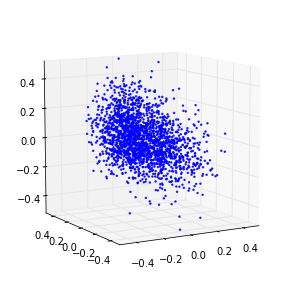

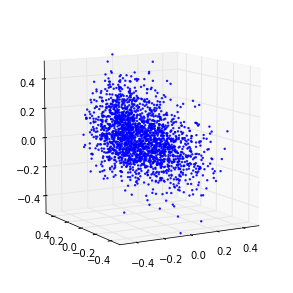

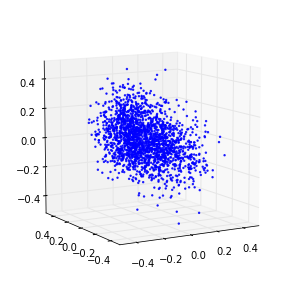

2 (-3.2518015702565513, -0.10041636380332487)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-2 is not in all_model_checkpoint_paths. Manually adding it.


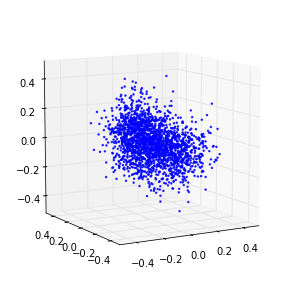

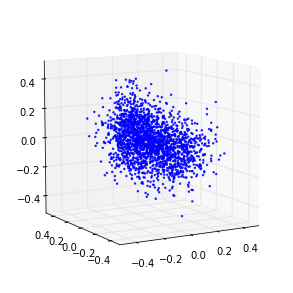

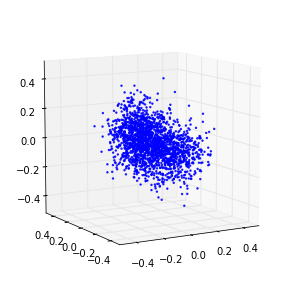

3 (-3.2575456266049985, -0.17012550102339852)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-3 is not in all_model_checkpoint_paths. Manually adding it.


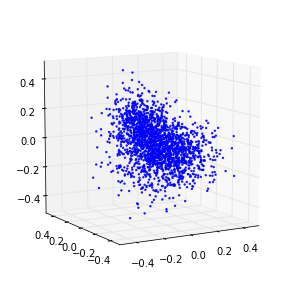

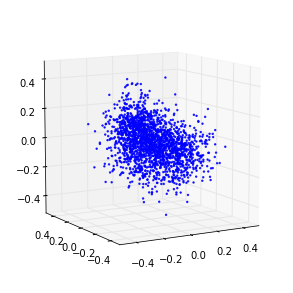

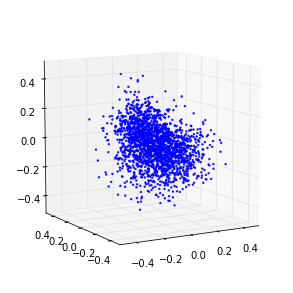

4 (-3.1839996549818252, -0.24890036991348974)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-4 is not in all_model_checkpoint_paths. Manually adding it.


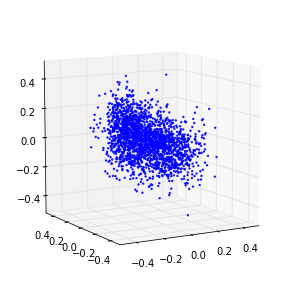

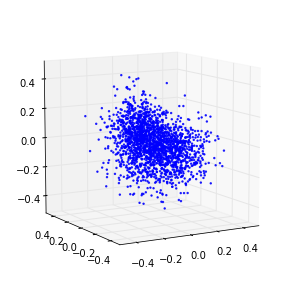

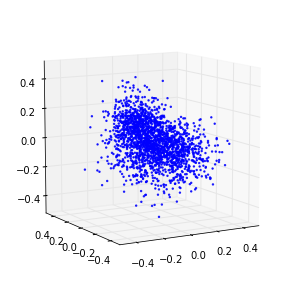

5 (-3.0944070392184786, -0.33801378916811059)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-5 is not in all_model_checkpoint_paths. Manually adding it.


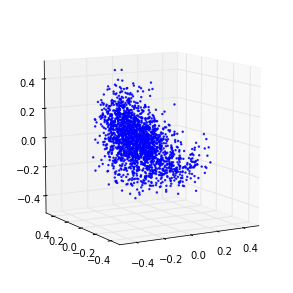

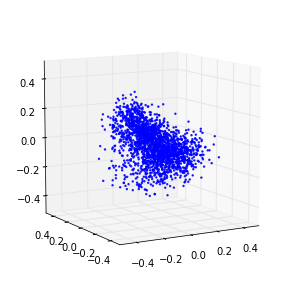

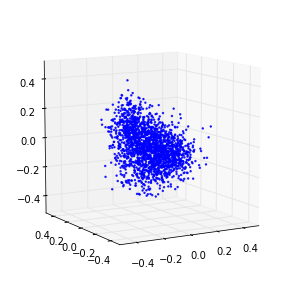

6 (-2.9874368155444109, -0.42463235170752917)
7 (-2.878925567203098, -0.52203760434080049)
8 (-2.756215570591114, -0.61248907777998185)
9 (-2.6463851928710938, -0.68869389428032768)
10 (-2.5210506386227078, -0.78029401876308302)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-10 is not in all_model_checkpoint_paths. Manually adding it.


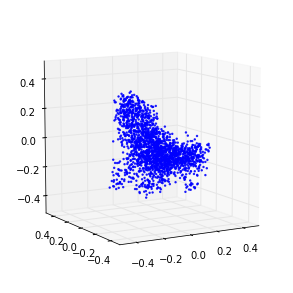

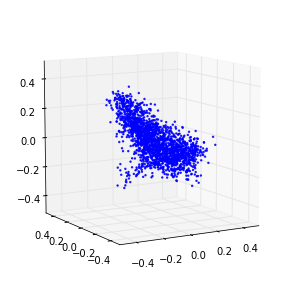

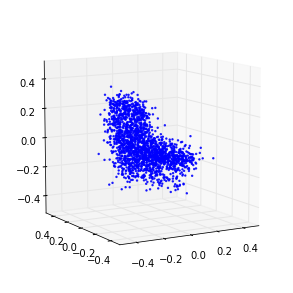

11 (-2.3944149679607816, -0.83170854383044768)
12 (-2.2631020404674387, -0.93189401538283734)
13 (-2.1289970000584919, -1.0287570688459609)
14 (-2.0011144134733412, -1.1217825545205011)
15 (-1.8519591322651616, -1.1703748747154519)
16 (-1.7138685606144093, -1.2296116837748774)
17 (-1.5756809278770729, -1.251556811509309)
18 (-1.4445023466039586, -1.2816035306012188)
19 (-1.3267557810854029, -1.2799896045967385)
20 (-1.2116334553118104, -1.2617378588075991)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-20 is not in all_model_checkpoint_paths. Manually adding it.


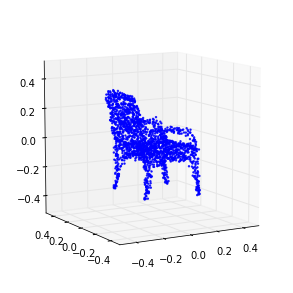

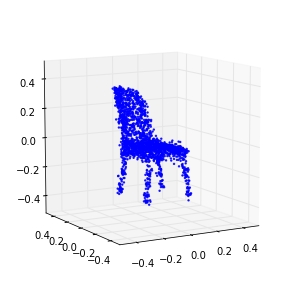

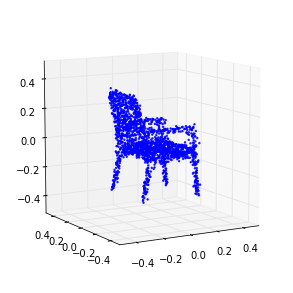

21 (-1.0947771505073265, -1.2225977932965313)
22 (-0.99647352916223031, -1.1396024712809809)
23 (-0.91449511934209748, -1.0691414188455652)
24 (-0.83778187345575406, -0.95519135616443773)
25 (-0.77598438240863654, -0.83873859599784573)
26 (-0.72355104353692801, -0.7258274996722186)
27 (-0.68667003269548765, -0.65145642006838766)
28 (-0.63245023996741678, -0.52824538946151733)
29 (-0.57756680537153171, -0.50528684368839971)
30 (-0.5092671977701011, -0.54054848463447003)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-30 is not in all_model_checkpoint_paths. Manually adding it.


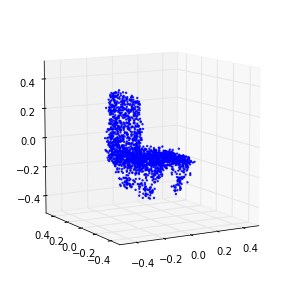

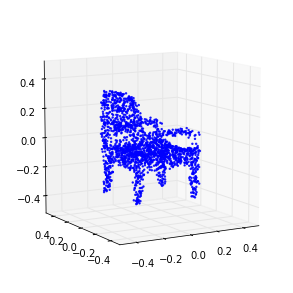

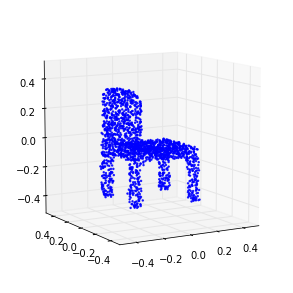

31 (-0.45755271988886376, -0.55745892061127555)
32 (-0.39819384283489651, -0.60184523242491261)
33 (-0.3578648572166761, -0.63711480078873806)
34 (-0.3036068445002591, -0.68216020531124544)
35 (-0.22921289379398027, -0.72650850481457185)
36 (-0.19090450546807713, -0.7865787148475647)
37 (-0.13674229957439282, -0.83818265906086675)
38 (-0.085707675306885334, -0.88117383586035836)
39 (-0.057974875856328892, -0.86434670289357507)
40 (-0.04930772113579291, -0.80352802850581984)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-40 is not in all_model_checkpoint_paths. Manually adding it.


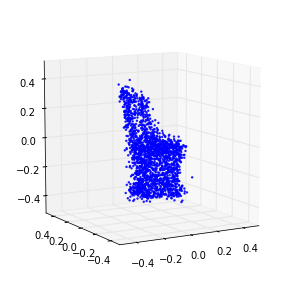

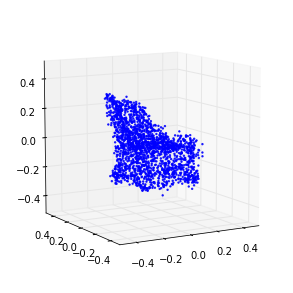

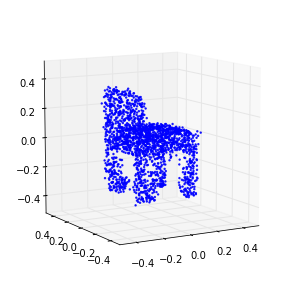

41 (-0.0090562975517025704, -0.83686623749909572)
42 (0.0086699364361939608, -0.6754712031947242)
43 (0.039713494645224674, -0.51102864411142135)
44 (0.10255962555055265, -0.72991693902898713)
45 (0.10539258497732656, -1.0156684120496113)
46 (0.075747516364962963, -1.0721722907490201)
47 (0.088720921178658804, -0.9542050847300777)
48 (-0.013370164125053971, 0.11961707576281494)
49 (-0.26257094608412851, 0.69346822963820565)
50 (-0.16112514734268188, 0.51367563781914882)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-50 is not in all_model_checkpoint_paths. Manually adding it.


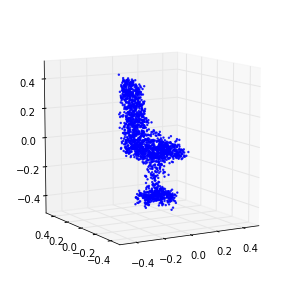

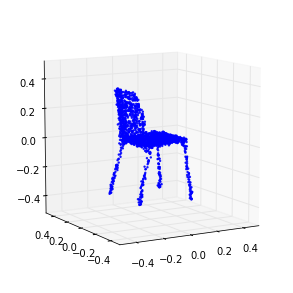

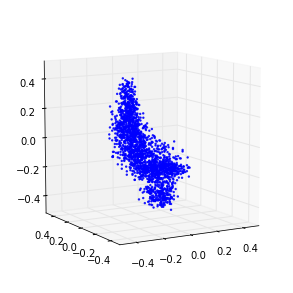

51 (-0.091493426980795683, -0.14369491805081014)
52 (-0.34384232742918863, -2.3792850882918746)
53 (-0.19366364081700643, -2.7244988812340631)
54 (-0.04158633952891385, -2.8790149158901639)
55 (-0.01716919392347336, -2.1634571728882968)
56 (-0.40042191567244351, 0.48264758316455064)
57 (-0.28576641838859629, 0.42073422104672148)
58 (-0.15106466346316869, 0.1660008504986763)
59 (-0.092340819261692186, -0.16682294107697629)
60 (-0.20582760081247048, -1.5416825181908078)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-60 is not in all_model_checkpoint_paths. Manually adding it.


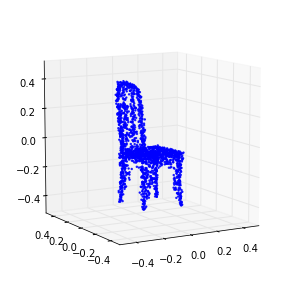

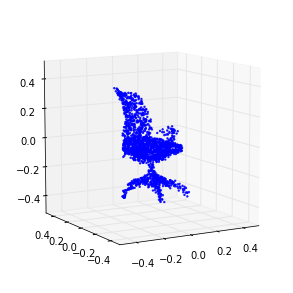

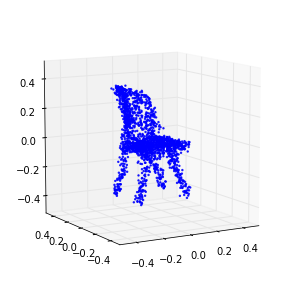

61 (-0.30280251284992254, -2.5367356406317816)
62 (-0.21506760818538842, -2.6446389357248941)
63 (-0.10679510820794988, -2.4859654020380089)
64 (-0.19577681985166337, -0.99951915525727797)
65 (-0.26175767635857616, -0.35834634911130975)
66 (-0.17383262360537494, -0.71035110288196135)
67 (-0.17505018435142658, -1.2108083632257249)
68 (-0.20542321403821309, -1.5264867279264662)
69 (-0.20951121631595823, -1.6486383853135285)
70 (-0.20237652996072061, -1.6811308551717687)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-70 is not in all_model_checkpoint_paths. Manually adding it.


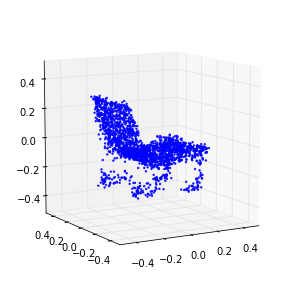

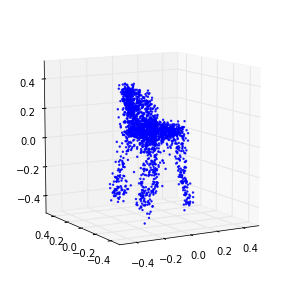

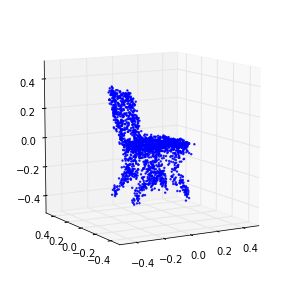

71 (-0.20839761898473458, -1.662659967387164)
72 (-0.18022681344990377, -1.6939039804317333)
73 (-0.1744818381137318, -1.7641970713933308)
74 (-0.17258381584176311, -1.636540452639262)
75 (-0.16648158207535743, -1.7192514251779627)
76 (-0.15776248612889537, -1.6634444837216977)
77 (-0.15521160584908944, -1.3985197102582012)
78 (-0.16666914616469983, -1.487007737159729)
79 (-0.14667438332129407, -1.5811761131993047)
80 (-0.16603549539490983, -1.4945043016363073)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-80 is not in all_model_checkpoint_paths. Manually adding it.


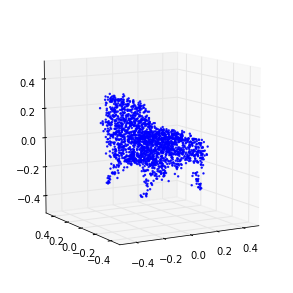

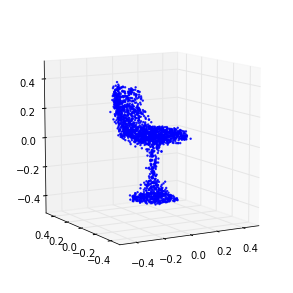

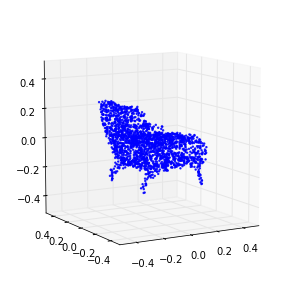

81 (-0.16082469815457309, -1.1884246578922979)
82 (-0.1594398332690751, -1.1189516716533237)
83 (-0.1507846121986707, -1.1056761763713978)
84 (-0.13881348252848344, -1.0582959254582722)
85 (-0.11575221877407145, -1.1567157506942749)
86 (-0.11358114740362873, -1.0693273919600028)
87 (-0.10586985421401483, -0.91992041799757218)
88 (-0.10799036481314235, -0.98836216661665177)
89 (-0.091948656627425435, -0.95512349958773013)
90 (-0.082478969075061651, -1.0599159443819965)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-90 is not in all_model_checkpoint_paths. Manually adding it.


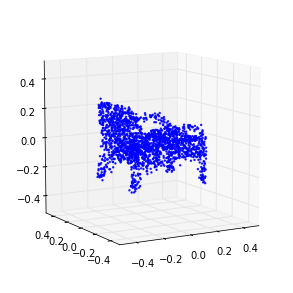

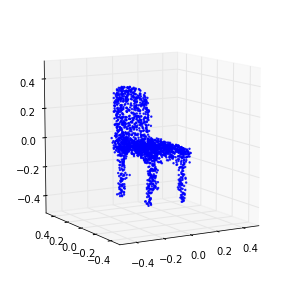

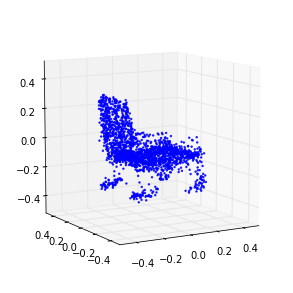

91 (-0.064458261982158385, -1.0400921834839716)
92 (-0.056520686077850837, -1.0542267958323162)
93 (-0.056435609884836056, -1.0932181720380429)
94 (-0.02426952667258404, -0.99542088861818667)
95 (-0.031257819715473388, -0.97554785233956798)
96 (-0.024846689844572986, -1.1884479544780873)
97 (-0.0021719265315267777, -1.1014058104267828)
98 (0.018161790983544455, -1.0009138076393693)
99 (0.017897682388623555, -1.1015175890039515)
100 (0.030303885456588533, -1.1631819186387238)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-100 is not in all_model_checkpoint_paths. Manually adding it.


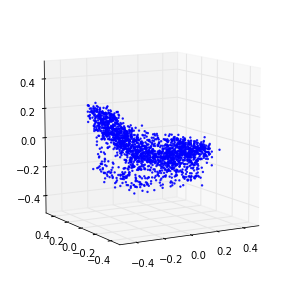

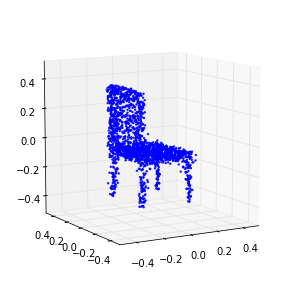

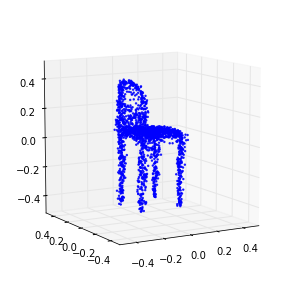

101 (0.042222382845701997, -1.2285276783837213)
102 (0.063365386481638308, -1.2712641645360876)
103 (0.078445272809929315, -1.2441757784949408)
104 (0.06830415057915229, -1.3591386433000918)
105 (0.075520670220807745, -1.3054377547016851)
106 (0.083339780293129107, -1.3963594922312983)
107 (0.078124707523319459, -1.4219101667404175)
108 (0.094397882979225231, -1.4374539278171681)
109 (0.093477812547374653, -1.4869364941561665)
110 (0.089484356067798754, -1.5316696211143777)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-110 is not in all_model_checkpoint_paths. Manually adding it.


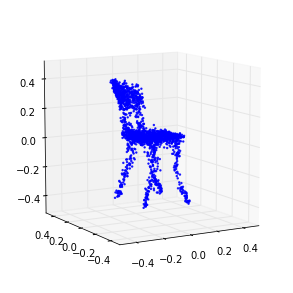

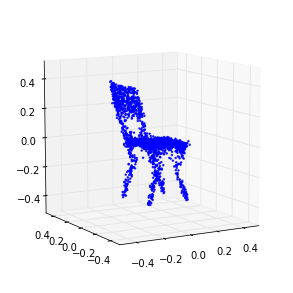

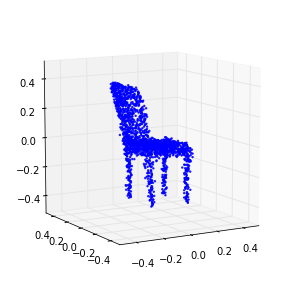

111 (0.09429717991087172, -1.6147665094446253)
112 (0.089131913416915468, -1.5440364413791232)
113 (0.10739785209298133, -1.5204088511290375)
114 (0.12173061141813243, -1.4470924801296658)
115 (0.10163208425596908, -1.5402612553702459)
116 (0.15952321693853097, -1.6360551560366596)
117 (0.083930373467780928, -1.5409635614465784)
118 (0.1126510528502641, -1.5284569969883672)
119 (0.14438595987028546, -1.5366535186767578)
120 (0.077368070488726653, -1.6054631471633911)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-120 is not in all_model_checkpoint_paths. Manually adding it.


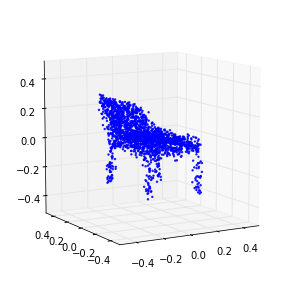

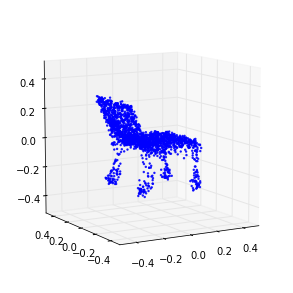

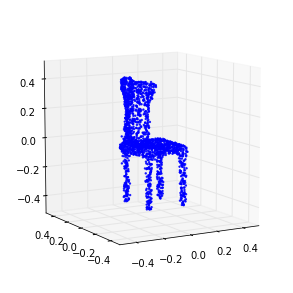

121 (0.12258999830594769, -1.8327191759038854)
122 (0.1598344161554619, -1.8535981134132102)
123 (0.090705392978809501, -1.7237027971832841)
124 (0.11076210693076805, -1.7191375803064417)
125 (0.16222090489334531, -1.6366640991634793)
126 (0.14165451314162325, -1.586214820543925)
127 (0.11022061622805066, -2.1167074883425676)
128 (0.19952891333787529, -2.2888911653448036)
129 (0.13824846545855204, -2.1754247126755892)
130 (0.10456398675839106, -2.0148717827267117)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-130 is not in all_model_checkpoint_paths. Manually adding it.


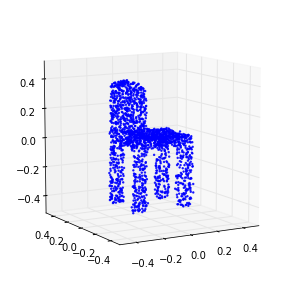

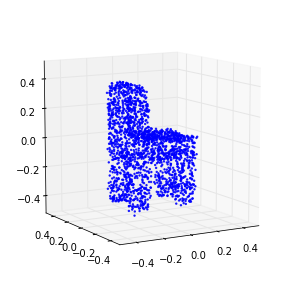

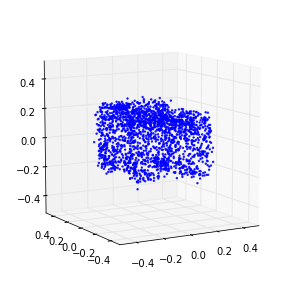

131 (0.14225252519051235, -1.8714469582946212)
132 (0.20274878698918555, -2.0702690415912204)
133 (0.14220463258248789, -2.4751226637098522)
134 (0.13908080955346425, -2.5461118132979781)
135 (0.23047377613407594, -2.7620181684140808)
136 (0.14733943679818401, -2.5181754253528736)
137 (0.10808544175492393, -2.2901207694300898)
138 (0.14300810217305465, -2.3911084069146051)
139 (0.20490215415204013, -2.4945378745043718)
140 (0.22046303329644379, -2.5132389686725758)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-140 is not in all_model_checkpoint_paths. Manually adding it.


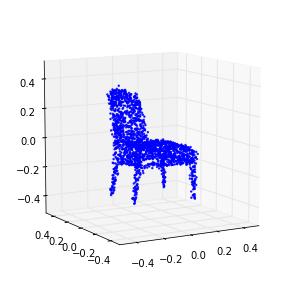

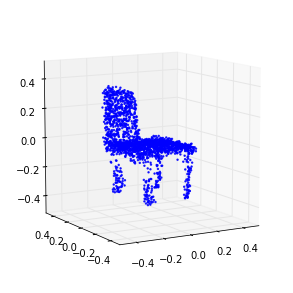

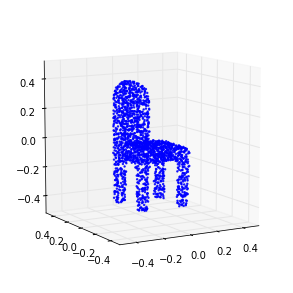

141 (0.12115315008494588, -2.454468259104976)
142 (0.20102697119668678, -2.7216278005529335)
143 (0.27111389885346093, -2.8263036674923367)
144 (0.1537679106273033, -2.8748237115365489)
145 (0.11640907388042521, -2.7443802180113614)
146 (0.16034945296468558, -2.7722469435797796)
147 (0.22332658240640604, -2.9438977329819291)
148 (0.24499224173250023, -2.9004790076503046)
149 (0.15213454367110021, -2.9111496254249856)
150 (0.14974005165751333, -2.9592677310661033)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-150 is not in all_model_checkpoint_paths. Manually adding it.


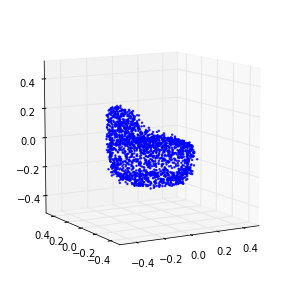

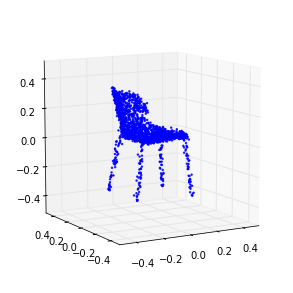

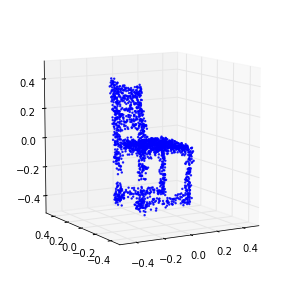

151 (0.25085687231686382, -2.9303248458438449)
152 (0.28047932916217377, -3.1572999954223633)
153 (0.1203258657069118, -3.352111401381316)
154 (0.092048942242507578, -3.1155267026689319)
155 (0.15270635057930593, -3.2800951268937855)
156 (0.22910348044501411, -2.693182353620176)
157 (0.23840304375798613, -3.3687074625933611)
158 (0.20808627884145137, -3.638991673787435)
159 (0.070967009484216012, -2.9439226697992393)
160 (0.20148928162676316, -2.8438961682496249)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-160 is not in all_model_checkpoint_paths. Manually adding it.


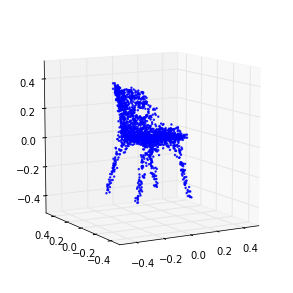

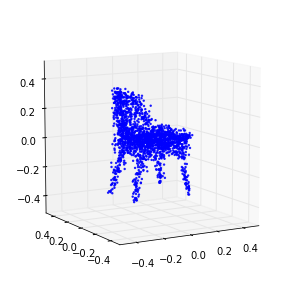

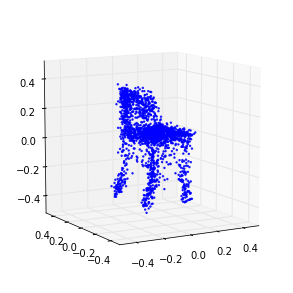

161 (0.25305942981331436, -3.5463171005249023)
162 (0.3470595290263494, -4.0760031629491733)
163 (0.16445565830778192, -2.2099074787563748)
164 (0.15058701568179661, -2.753658895139341)
165 (0.009777494575138445, -3.1648802492353649)
166 (0.072552135255601669, -2.2866214690385043)
167 (0.12430767193436623, -3.1710404466699669)
168 (0.022288737142527545, -1.8151405387454562)
169 (0.17907810672013849, -1.4548425232922588)
170 (0.10313898148360076, -2.5351741932056568)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-170 is not in all_model_checkpoint_paths. Manually adding it.


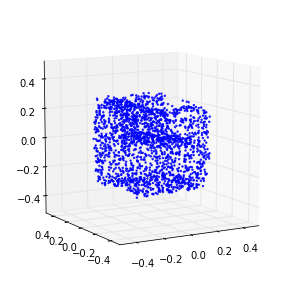

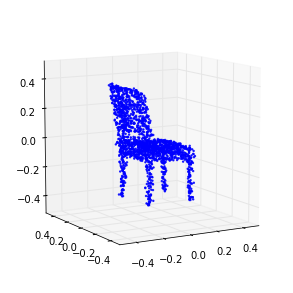

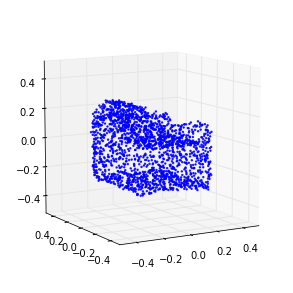

171 (-0.26362423444235766, -1.3826991783248053)
172 (-0.072929624716440836, -1.2665680933881689)
173 (0.080583582652939689, -2.0687895041924937)
174 (-0.11500168475839827, -2.0722107666510121)
175 (-0.13600479138118249, -1.0544598190872758)
176 (0.043605352662227773, -0.79775615974708836)
177 (0.21043420651996578, 0.066499711117810667)
178 (0.28417229530987914, 0.80258928901619386)
179 (-0.41183331625329123, -1.7038449545701344)
180 (-0.29051941496630512, -2.1271001762813992)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-180 is not in all_model_checkpoint_paths. Manually adding it.


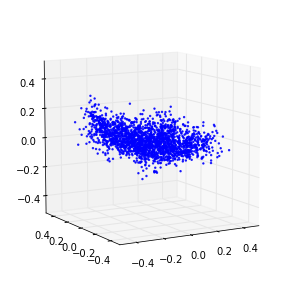

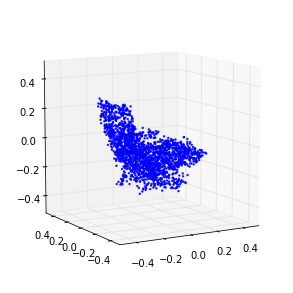

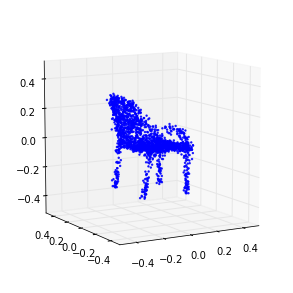

181 (-0.069324896319044954, -2.2134694964797408)
182 (0.063257497383488542, -0.99858270033642094)
183 (-0.13093965050798875, 1.1179366884408173)
184 (-0.090429960991497388, 0.11597172584798601)
185 (-0.042049895723660788, -1.5910653670628865)
186 (-0.031830332731759108, -1.6835335305443517)
187 (-0.18346019908785821, 0.57532856627194973)
188 (-0.00072109914488262597, 0.98546842071745133)
189 (0.16794711282407795, 1.1124940050972834)
190 (0.053528214301224106, -0.26177856629645385)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-190 is not in all_model_checkpoint_paths. Manually adding it.


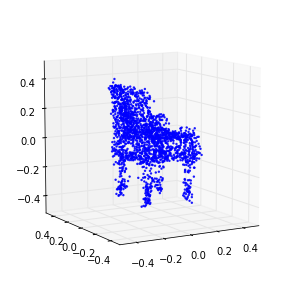

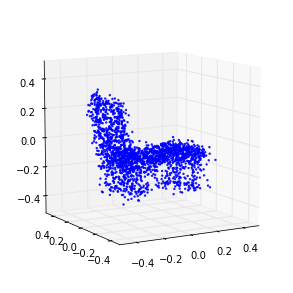

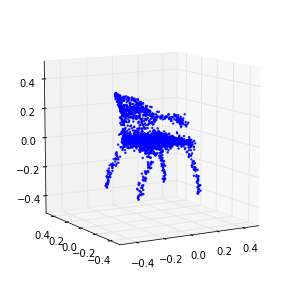

191 (-0.40191105234402197, -1.5894560416539509)
192 (-0.22053600662836323, -1.6410375789359763)
193 (-0.059185031718677943, -1.6237872529912878)
194 (0.11520913041852139, -1.5297522412406073)
195 (0.048295397173475335, -0.32891690841427557)
196 (-0.26968734658978605, 0.8691388567288717)
197 (-0.094636058338262413, 0.55570204059282935)
198 (0.051278237750132877, 0.71911943400347678)
199 (0.15822217412017009, 0.91412300533718538)
200 (0.25755141669953313, 1.2143567623915497)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-200 is not in all_model_checkpoint_paths. Manually adding it.


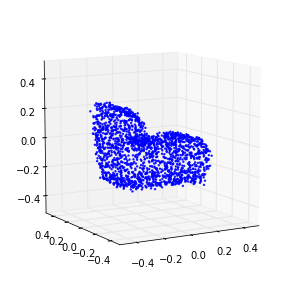

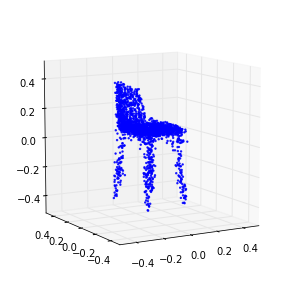

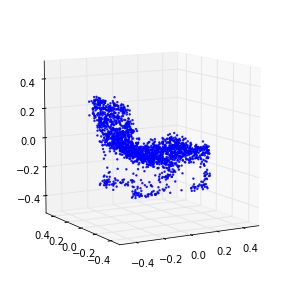

201 (0.29682831957384392, 1.3664508472990107)
202 (-0.51095640995988134, -1.073006123787275)
203 (-0.43740786264340081, -1.4067579861040469)
204 (-0.2601076739391795, -1.4405769860302959)
205 (-0.10644592829048634, -1.5818594031863742)
206 (0.036985285138642347, -1.479757997724745)
207 (0.068850475108181985, 0.36640969829426873)
208 (-0.22951562434986786, 0.90194443171774896)
209 (-0.15987327694892883, -0.1533125805909987)
210 (-0.0085025879106035932, 0.24904162360838167)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-210 is not in all_model_checkpoint_paths. Manually adding it.


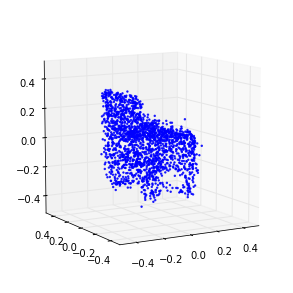

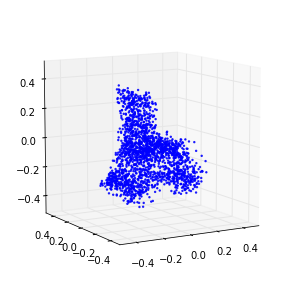

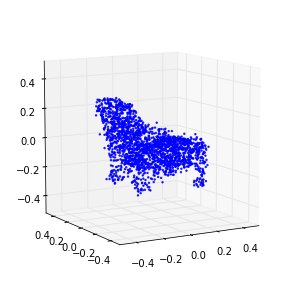

211 (0.044331627394314163, 1.5655414704923276)
212 (-0.17100922606057592, -0.26976538504715319)
213 (-0.18753195904471257, -1.819261493506255)
214 (-0.006525133508774969, -1.8049574560589261)
215 (0.098343965218023022, -1.4810446081338104)
216 (-0.097314173203927504, 1.150060201684634)
217 (-0.21558296826702578, 0.41943315416574478)
218 (-0.10112301834203578, 0.31118749592591216)
219 (0.057596077742399991, 0.51629443349385706)
220 (0.10051601275249764, 1.4436105048214947)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-220 is not in all_model_checkpoint_paths. Manually adding it.


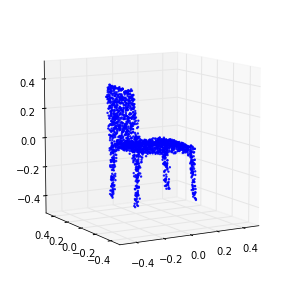

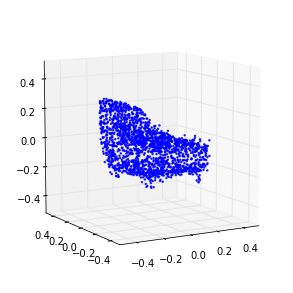

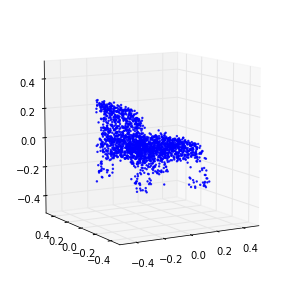

221 (-0.20112847981077653, -0.76427024934026933)
222 (-0.18817215178299834, -1.8848352873766865)
223 (-0.037943629837698403, -1.8707097636328802)
224 (0.11336137688270322, -1.8163318854791146)
225 (0.087657721726982676, 0.088612459875919203)
226 (-0.26820885454890903, 0.95637537042299903)
227 (-0.11796255331072543, 0.46154249280139253)
228 (0.020734128093829862, 0.47192983370688224)
229 (0.11765736545677538, 1.1947544283337064)
230 (0.10153836359580358, 0.98485660235638972)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-230 is not in all_model_checkpoint_paths. Manually adding it.


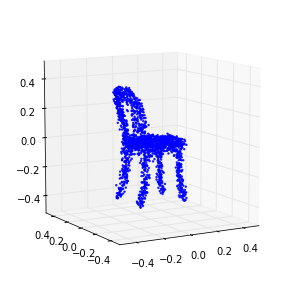

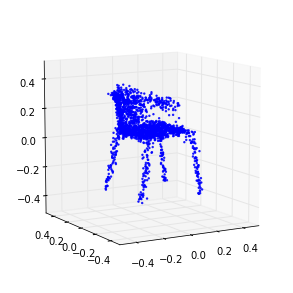

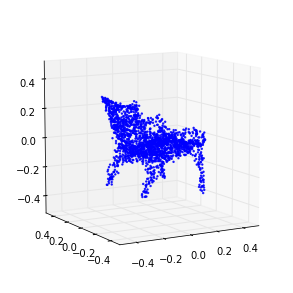

231 (-0.28154142381692376, -2.0983387673342668)
232 (-0.12620814261889016, -2.4092643525865345)
233 (0.012212841254141595, -2.2643019799832946)
234 (0.11656589615676138, -1.4420437525819849)
235 (-0.073246345365488977, 1.2316888910200861)
236 (-0.17151533217617759, 0.40035897934878312)
237 (-0.014333715138060076, 0.62254748879759403)
238 (0.087327688449510818, 0.68845148219002616)
239 (0.14891543120697692, 1.557613280084398)
240 (-0.10753397814653538, -0.10518536468346913)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-240 is not in all_model_checkpoint_paths. Manually adding it.


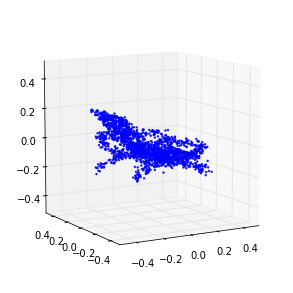

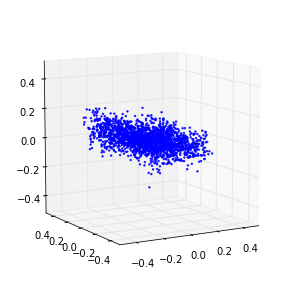

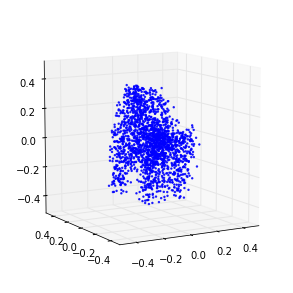

241 (-0.26126167060876332, -1.9746796113473397)
242 (-0.14546429913628983, -2.0052752494812012)
243 (0.0013479039486911561, -1.4716165728039212)
244 (0.087481220259710599, -0.77803829008782355)
245 (-0.030287593078834038, 0.89775994461443687)
246 (-0.21718915187650256, -0.26301978859636521)
247 (-0.060637561700962204, -0.10536245629191399)
248 (0.080676564822594318, 0.6262027370157065)
249 (0.056961316201421947, 1.3518448714856748)
250 (-0.1779772704122243, -1.4603107353603397)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-250 is not in all_model_checkpoint_paths. Manually adding it.


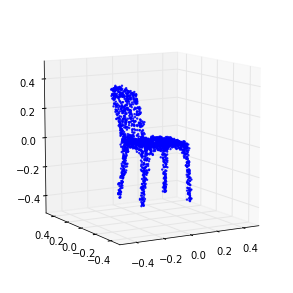

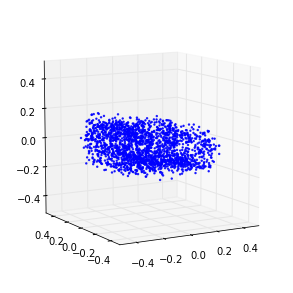

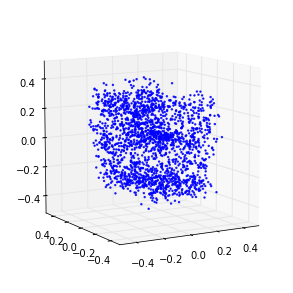

251 (-0.10448319057899493, -2.2904076355474965)
252 (0.03900685158592683, -2.1973498750616005)
253 (0.17401039363057524, -1.5704050108238503)
254 (-0.10668057195014424, 1.3778033212379173)
255 (-0.18911478713982635, 0.73273979624112451)
256 (-0.035284595908942049, -0.2339012614554829)
257 (0.10680082313440464, 0.018938148187266454)
258 (0.011107412532523826, 1.3126005419978388)
259 (-0.17356146176656087, -0.93449837590257323)
260 (-0.10606920826766227, -2.3488180239995322)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-260 is not in all_model_checkpoint_paths. Manually adding it.


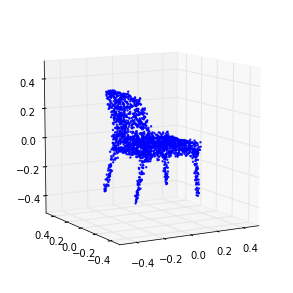

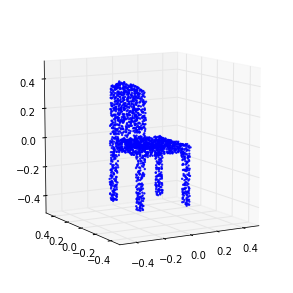

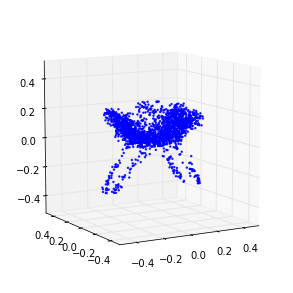

261 (0.010446904999790368, -2.3769872011961759)
262 (0.17725301695366699, -2.3803763919406467)
263 (-0.058316790422907584, 0.74730396574294122)
264 (-0.23506944905276653, 0.99674191739824081)
265 (-0.10229884690294663, 0.48021103193362552)
266 (0.076136966615363399, 0.97532460424635148)
267 (0.1583007592018004, 1.6129808911570795)
268 (0.050889497333102759, -0.088295439327204669)
269 (-0.30948496504376333, -2.4863625455785683)
270 (-0.14693720753270167, -2.6114783463654696)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-270 is not in all_model_checkpoint_paths. Manually adding it.


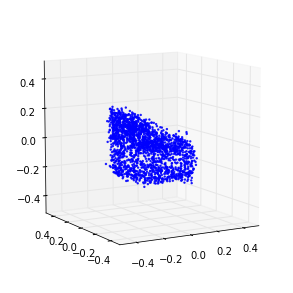

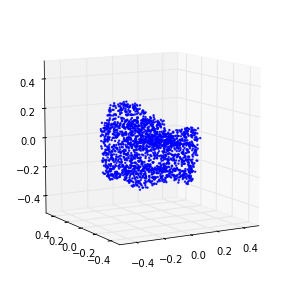

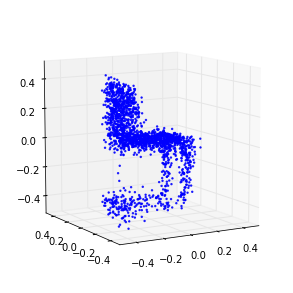

271 (-0.010085056473811468, -2.6062378176936396)
272 (0.13886180365527118, -2.3607836917594627)
273 (-0.024764533975610025, 0.15903796227993788)
274 (-0.21882234942857867, 0.97606348660257125)
275 (-0.10071409766872724, 0.33901732511542459)
276 (0.029354760575073736, 0.27913624793291092)
277 (0.14057690498453598, 0.93423938530462758)
278 (0.019727041986253527, 0.19483617665591063)
279 (-0.23658749402535181, -2.4642159938812256)
280 (-0.11089224793292858, -2.4922878477308483)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-280 is not in all_model_checkpoint_paths. Manually adding it.


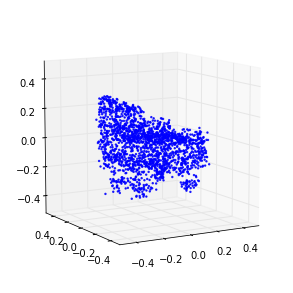

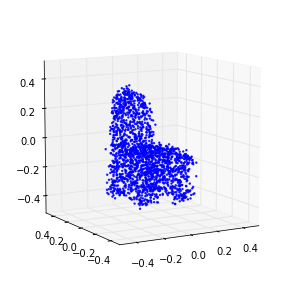

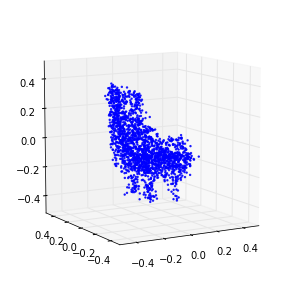

281 (0.034515149339481639, -2.4839356387103044)
282 (0.17927650453315841, -2.9281588748649314)
283 (0.3108658838327284, -2.7080356986434371)
284 (-0.24978685779152093, 1.0488220050379082)
285 (-0.2791366180336034, 0.95801995418689867)
286 (-0.1510694629823168, 0.67691149369434078)
287 (-0.021825877535674307, 0.48857139216529)
288 (0.10948434877726766, 0.39141895925557174)
289 (0.15871659335162905, 1.039385599118692)
290 (-0.095104779661805541, -1.1638913005590439)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-290 is not in all_model_checkpoint_paths. Manually adding it.


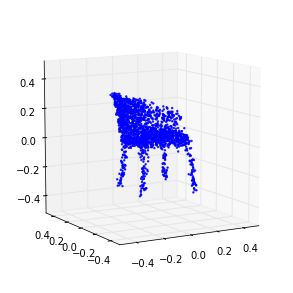

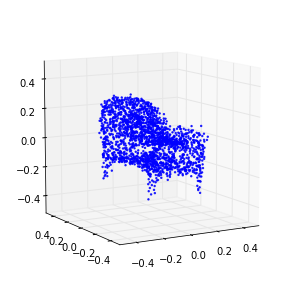

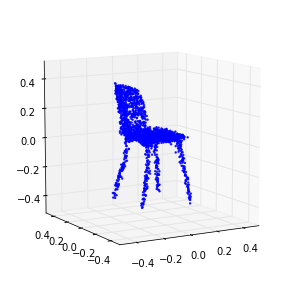

291 (-0.27606932355297936, -3.0357583452154091)
292 (-0.11573386085392148, -3.0867923454002097)
293 (0.035896230254460267, -3.1763986040044716)
294 (0.073063125144000401, -1.4579639920481928)
295 (-0.10559979573720031, 0.45443388102231203)
296 (-0.066695272984604037, -0.60492181777954102)
297 (0.041041169770889813, -0.27719852590450533)
298 (0.10774530506244412, 0.95621942811542082)
299 (0.058576011657714845, -0.0076697490833423755)
300 (-0.22035008205307854, -2.9251015804432057)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-300 is not in all_model_checkpoint_paths. Manually adding it.


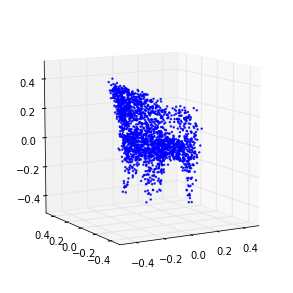

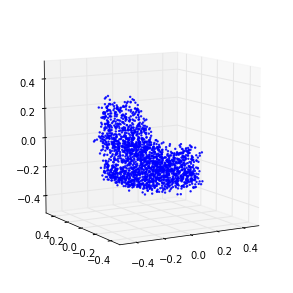

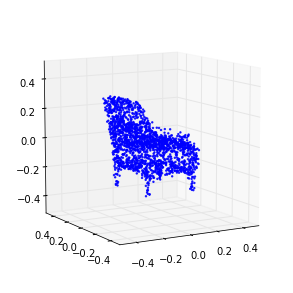

301 (-0.10528680307583677, -3.1555605906027333)
302 (0.042524171841365317, -2.8136215386567294)
303 (0.17048156638112333, -2.1546386965998896)
304 (0.032566426763380014, 0.37741517358356053)
305 (-0.23800762112217921, -0.24739829312872003)
306 (-0.10345403099501574, -0.3938555550520067)
307 (0.014183426586290201, 0.25658258726751365)
308 (0.12923802945900847, 1.1814078997682642)
309 (0.14273121798479999, 0.396008988911355)
310 (-0.2802645746411549, -3.3121407473528826)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-310 is not in all_model_checkpoint_paths. Manually adding it.


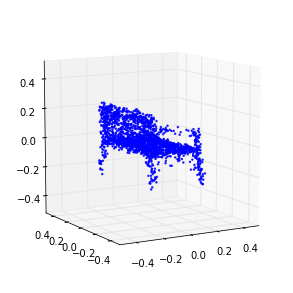

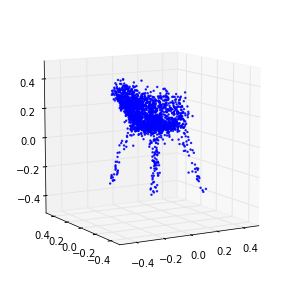

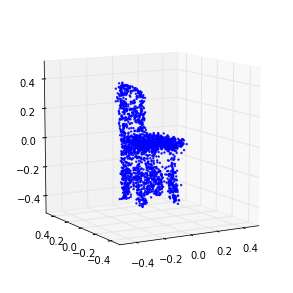

311 (-0.12597056343047708, -3.5295635947474726)
312 (0.011152967438101768, -2.9982267485724554)
313 (0.12216409109532833, -2.0866716084656893)
314 (-0.025461091170156443, 0.756574968221011)
315 (-0.16632553731539734, -0.61399579186130449)
316 (0.004151237514559869, -1.0005616192464475)
317 (0.11148044934703244, 0.21790581858820385)
318 (-0.00041658269862333933, 0.69549327757623458)
319 (-0.18106073258375679, -2.7190490122194642)
320 (-0.071490546446983466, -3.4196661136768483)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-320 is not in all_model_checkpoint_paths. Manually adding it.


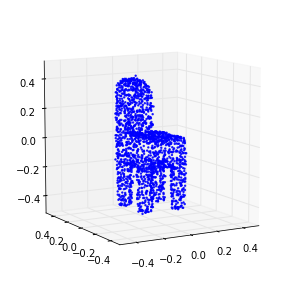

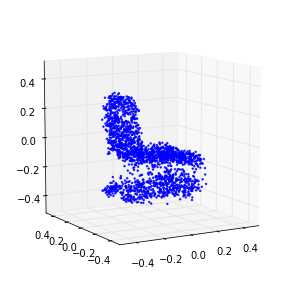

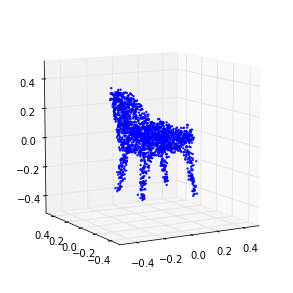

321 (0.068971633711070929, -3.4143090689623796)
322 (0.10874096036509232, -1.5796099879123546)
323 (-0.14446630128831775, 0.871725796825356)
324 (-0.15821363845909084, -0.44628364620385347)
325 (-0.017668318065504233, -0.024175413780742221)
326 (0.10143069046790953, 0.66312850128721312)
327 (0.039574368518811687, 0.05389298195088351)
328 (-0.24792323013146719, -3.129916058646308)
329 (-0.095880538473526636, -3.5299118183277272)
330 (0.030975021090772416, -2.991923305723402)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-330 is not in all_model_checkpoint_paths. Manually adding it.


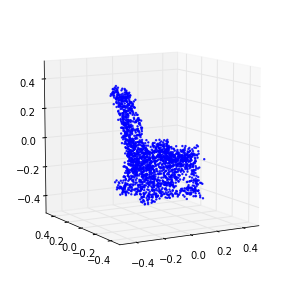

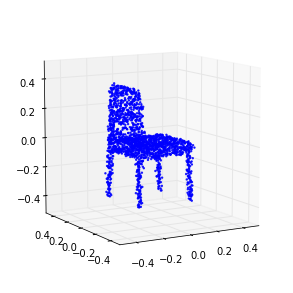

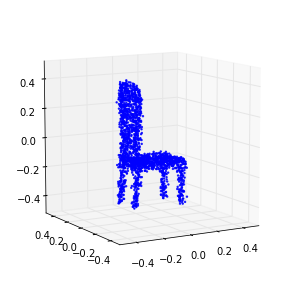

331 (0.09385698535652072, -0.60848295523060691)
332 (-0.1187809413505925, 0.36295093968510628)
333 (-0.10737377272021992, -1.444929387834337)
334 (0.033134032192605516, -0.27679255742717673)
335 (0.058629914690498955, 1.1532448397742376)
336 (-0.091594394130839238, -1.2962971550446969)
337 (-0.16433140133266097, -3.4158626044238054)
338 (-0.0019953059239519967, -3.3966313556388572)
339 (0.13644182622708656, -3.3669384585486517)
340 (0.15736792662905322, -1.7517822064735271)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-340 is not in all_model_checkpoint_paths. Manually adding it.


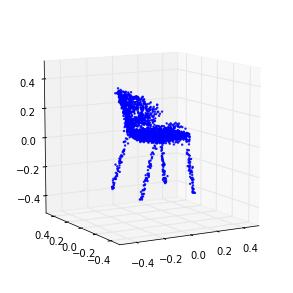

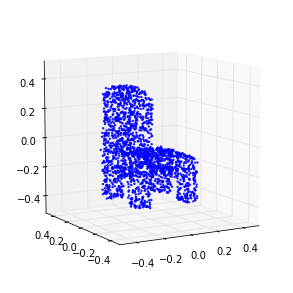

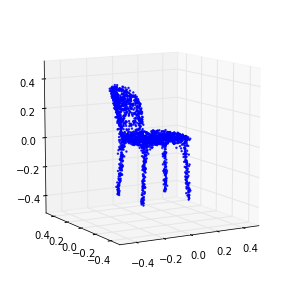

341 (-0.26428777655517616, 0.85016659964565877)
342 (-0.18681698513941633, 0.081304231727564777)
343 (-0.045827005734598192, -0.070022483735724728)
344 (0.074734563076937641, 0.50318400292760801)
345 (0.14531549809983482, 0.91278753236488064)
346 (-0.13849909385597264, -1.7879847332283303)
347 (-0.19250358137543555, -3.4058504899342856)
348 (-0.069371051058449124, -3.3919311099582248)
349 (0.071306324667400778, -2.8488066902867071)
350 (0.14463887940402384, -0.98819761095499548)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-350 is not in all_model_checkpoint_paths. Manually adding it.


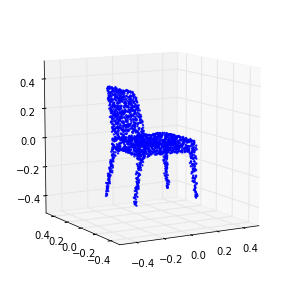

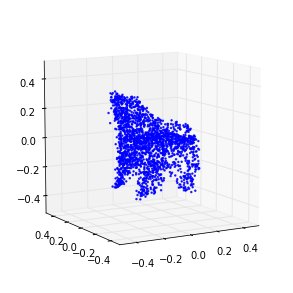

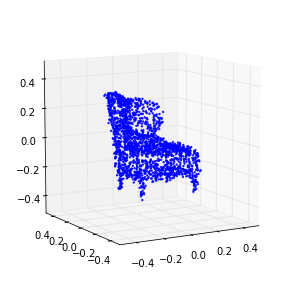

351 (-0.20345557784592663, 0.15278547008832297)
352 (-0.15557037366347182, -1.1462661204514679)
353 (-0.0086528211556099084, -0.22601017687055799)
354 (0.074963525655093011, 0.86147285721920153)
355 (0.039246833531392945, 0.094502558034879183)
356 (-0.21747830263166515, -3.4324823485480414)
357 (-0.085272011491987446, -3.7416201609152333)
358 (0.03236101039305881, -3.1244802210066052)
359 (0.039181882101628512, -0.11107931148122858)
360 (-0.13492889442929515, -0.1582453010810746)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-360 is not in all_model_checkpoint_paths. Manually adding it.


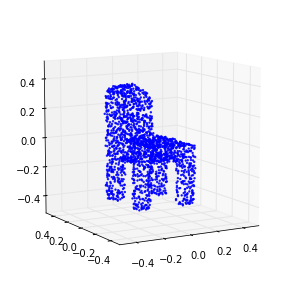

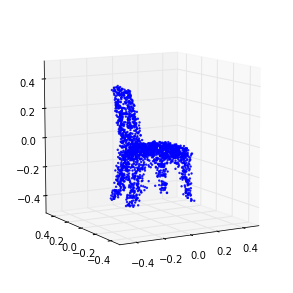

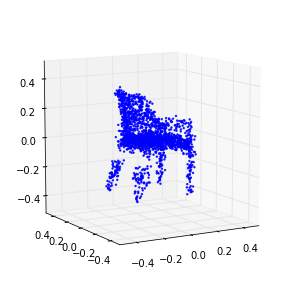

361 (-0.068691379949450487, -1.4752085915318243)
362 (0.086748051905521636, -0.47108886377127085)
363 (-0.0011838975327986259, 0.72925003176486047)
364 (-0.14491529255001634, -2.5154550119682595)
365 (-0.077273929222590396, -3.5627227624257407)
366 (0.047172211634892006, -3.6595603713282832)
367 (0.12821210599331945, -2.2917800330453448)
368 (-0.17364768814985398, 0.64300155322308894)
369 (-0.18288676809795476, -0.38377207365852817)
370 (-0.010116986799295302, -0.47889558915738706)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-370 is not in all_model_checkpoint_paths. Manually adding it.


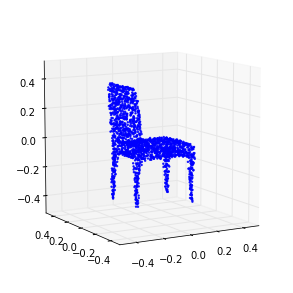

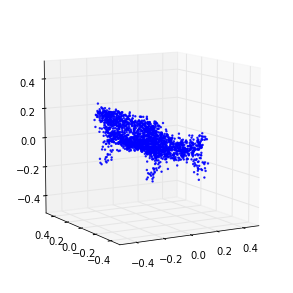

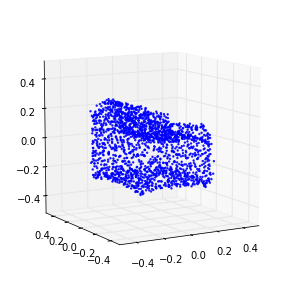

371 (0.087376208175663592, 0.38257435998982853)
372 (0.10139781874087121, 0.59332837316173093)
373 (-0.19063856625170619, -2.7745821586361639)
374 (-0.1485069142792512, -3.6999356128551342)
375 (0.00057185603374684303, -3.6182468378985368)
376 (0.081478453731095343, -2.5030422872967191)
377 (-0.031715135648846628, 0.41598314860904656)
378 (-0.18020691187293442, -0.78125852643063776)
379 (-0.0089526920475893543, -1.3297766778204176)
380 (0.082446251795799647, -0.95340699564527587)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-380 is not in all_model_checkpoint_paths. Manually adding it.


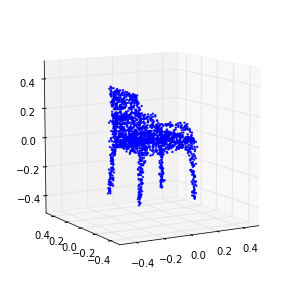

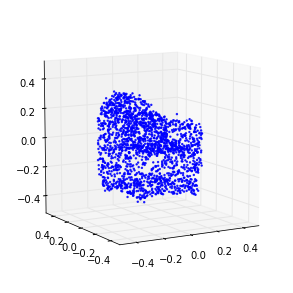

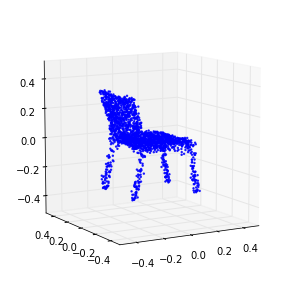

381 (-0.013814187532773725, 0.5742396499823641)
382 (-0.18924867358334638, -2.4935650339833013)
383 (-0.088462167336708974, -3.2984945774078369)
384 (0.028884053589017303, -3.4883449254212557)
385 (0.14207957464235801, -2.9895745206762245)
386 (-0.012390841060766468, -0.037078726898740838)
387 (-0.27181752217864547, -0.61725055729901346)
388 (-0.10746082488309454, -0.82081447817661146)
389 (-0.0023548313313060338, -0.088743741451590155)
390 (0.11448363925295847, 0.67728904883066809)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-390 is not in all_model_checkpoint_paths. Manually adding it.


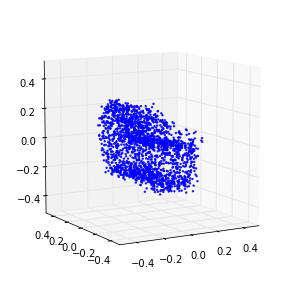

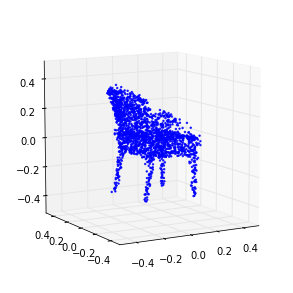

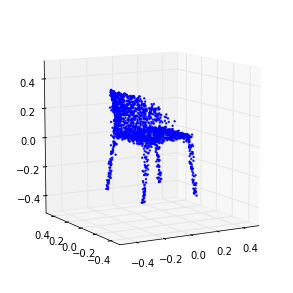

391 (-0.045911774949895012, -1.2385004756075364)
392 (-0.19414348445004886, -3.8674649485835322)
393 (-0.053823322243988517, -4.0507294072045221)
394 (0.054530791703749588, -3.0666258290961936)
395 (-0.035035887857278188, 0.17522966158058909)
396 (-0.12218827758398321, -1.0180030901122976)
397 (-0.014005222999387317, -1.9185522529813979)
398 (0.16009744449898047, -1.3337824101801272)
399 (-0.095491609501617933, -0.046383385305051449)
400 (-0.18396787190188965, -2.7639927952377885)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-400 is not in all_model_checkpoint_paths. Manually adding it.


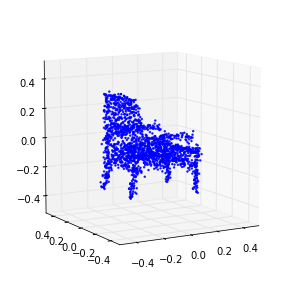

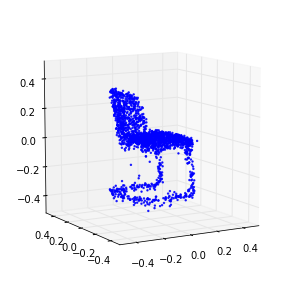

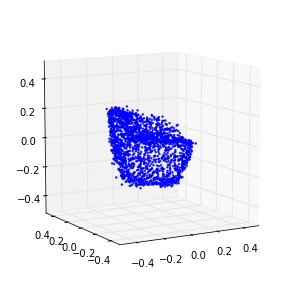

401 (-0.049355877301207295, -3.4972861078050403)
402 (0.085237603358648439, -3.7482759687635632)
403 (0.18079737736671059, -2.9858409210487649)
404 (-0.15627306284451925, 0.24452122928643669)
405 (-0.23656773329884917, -0.75241107300475796)
406 (-0.069513682772715885, -0.73020850618680322)
407 (0.061345522098795131, -0.52717192001916746)
408 (0.11136642720688272, 0.43159997007913059)
409 (-0.16179570057601841, -1.85050736553967)
410 (-0.17807505231488635, -3.6002225875854492)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-410 is not in all_model_checkpoint_paths. Manually adding it.


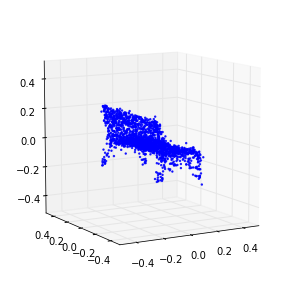

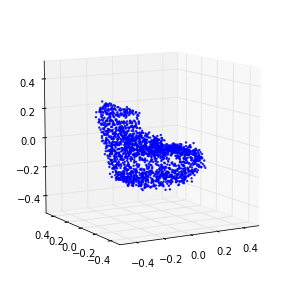

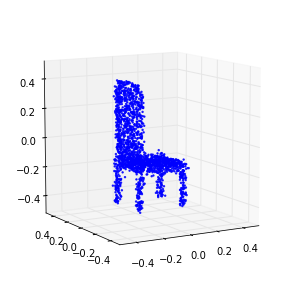

411 (-0.011024856291435382, -3.7666065163082547)
412 (0.1148551042985033, -3.412188273889047)
413 (-0.0014724405827345672, -0.4527272620686778)
414 (-0.17915239219588261, -0.62841391342657582)
415 (-0.087095232514871487, -1.4914715334221169)
416 (0.057028088235744727, -0.99113174996994158)
417 (0.031744141504168509, 0.46480916937192279)
418 (-0.16165620767407948, -2.4854326314396329)
419 (-0.092700425880374734, -3.8571954833136664)
420 (0.025733432539359287, -4.0803319613138838)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-420 is not in all_model_checkpoint_paths. Manually adding it.


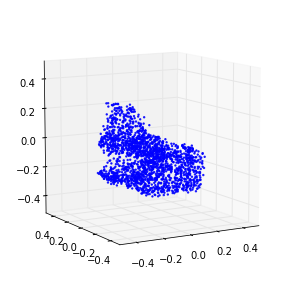

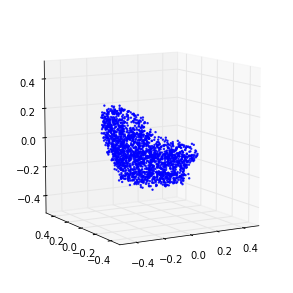

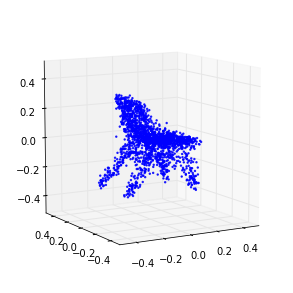

421 (0.12027260805997583, -3.0558778135864824)
422 (-0.14846372852032935, 0.15796597715881136)
423 (-0.18134329093413221, -0.8555826467496378)
424 (-0.033801632933318615, -1.0775923839321844)
425 (0.11202916349801752, -0.47406287436132077)
426 (0.051242489257344495, 0.19456693005782585)
427 (-0.22835430395272044, -3.1139617760976157)
428 (-0.11220777986778153, -3.8742627126199229)
429 (0.026885945901826577, -3.737856290958546)
430 (0.09170188088383939, -2.3435145053598614)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-430 is not in all_model_checkpoint_paths. Manually adding it.


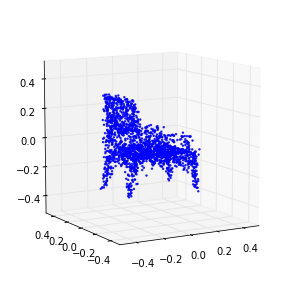

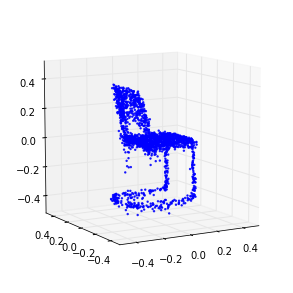

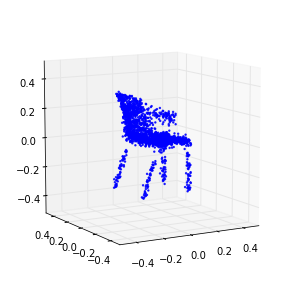

431 (-0.10615134399246287, 0.0047898624368287899)
432 (-0.1623472480310334, -1.4139352396682456)
433 (-0.010283831141337201, -1.6691980538544831)
434 (0.11042803481773093, -0.41778491389144351)
435 (-0.042095354337383199, -0.3864306750258914)
436 (-0.21156375922814563, -3.5251261040016457)
437 (-0.048416463672010988, -3.9982596856576427)
438 (0.08188216553104144, -3.8223728868696423)
439 (0.022996101749164086, -0.92659413552394621)
440 (-0.18108592302434975, -0.61534246774735279)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-440 is not in all_model_checkpoint_paths. Manually adding it.


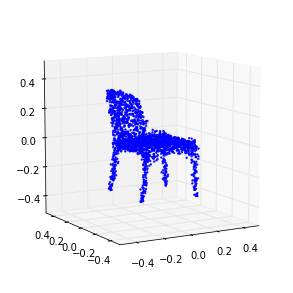

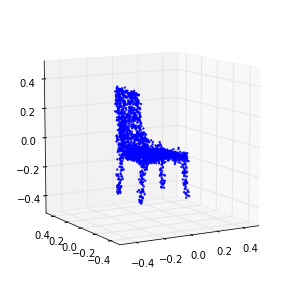

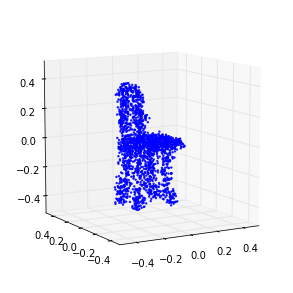

441 (-0.071835497539076545, -1.5247276800650138)
442 (0.0658330969305502, -0.99317923077830561)
443 (0.077624305103112148, 0.23012550009621513)
444 (-0.157763869377474, -2.3431178094060332)
445 (-0.13804183083551902, -3.8461517051414207)
446 (0.016596451318926283, -3.9522678498868591)
447 (0.075882648704228575, -2.5446063677469888)
448 (-0.085560736612037377, -0.10834131231186567)
449 (-0.16500040433473057, -1.6162113260339808)
450 (-0.018639237019750808, -1.76113036164531)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-450 is not in all_model_checkpoint_paths. Manually adding it.


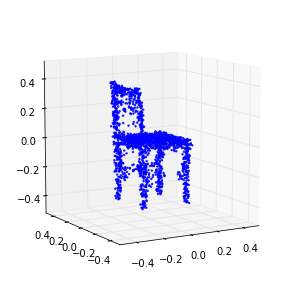

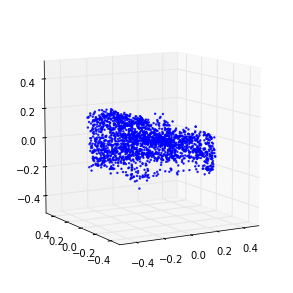

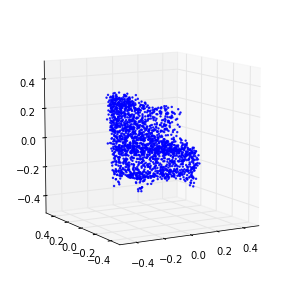

451 (0.071751164272427559, -0.10464984144049662)
452 (-0.049206051906501805, -0.78130345481137431)
453 (-0.16287520445055431, -3.8719411955939398)
454 (-0.038929375495623662, -4.1032549716808182)
455 (0.12513430191686861, -3.9501409707246005)
456 (0.027086900519552055, -1.3505114160685077)
457 (-0.18065626869599025, -0.55424564173100166)
458 (-0.1054548181179497, -1.3361214995384216)
459 (0.029786724590316966, -1.1386101880559214)
460 (0.10070303383248824, 0.13715007404486337)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-460 is not in all_model_checkpoint_paths. Manually adding it.


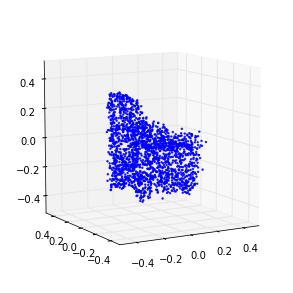

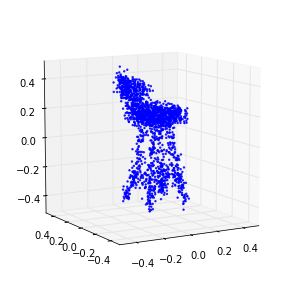

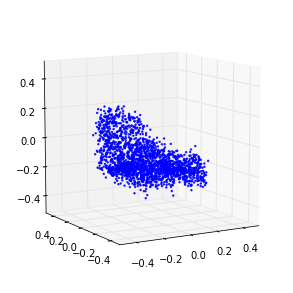

461 (-0.12215566885554129, -2.2295296399819629)
462 (-0.16388581864949731, -4.1156907346513538)
463 (-0.016186414596935112, -3.9829278698673956)
464 (0.10892266938807788, -2.814037874892906)
465 (-0.025312291320275376, -0.09531794191786537)
466 (-0.17987134596677842, -1.5785979076668069)
467 (-0.052712313272058962, -2.4052962108894631)
468 (0.097678999513111736, -1.4650999631870676)
469 (-0.047962427277255942, -0.20736851529390724)
470 (-0.16359047295732632, -3.073995342961064)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-470 is not in all_model_checkpoint_paths. Manually adding it.


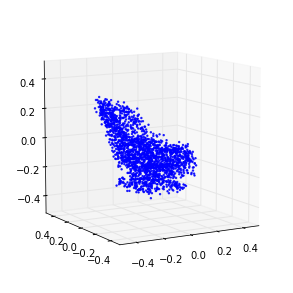

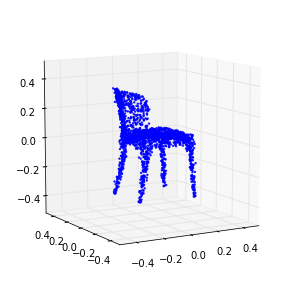

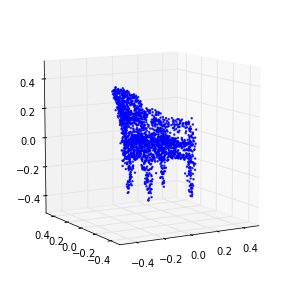

471 (-0.036314374767243862, -3.8104240982620805)
472 (0.1014714056694949, -3.9632512728373208)
473 (0.14267971523933939, -2.346145668239505)
474 (-0.20552498128403116, -0.30249507000876796)
475 (-0.15430846615108074, -1.2595535097298798)
476 (-0.038959887685875098, -1.1759700421933774)
477 (0.082199283095973505, -0.57783333405300419)
478 (0.0040232047714568947, -0.42133845499268285)
479 (-0.19524051356646749, -3.7299091021219888)
480 (-0.074777636532154343, -3.9150465417791298)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-480 is not in all_model_checkpoint_paths. Manually adding it.


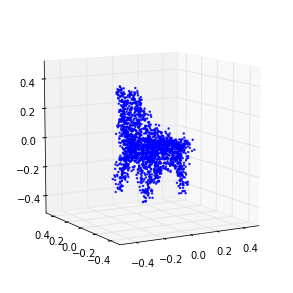

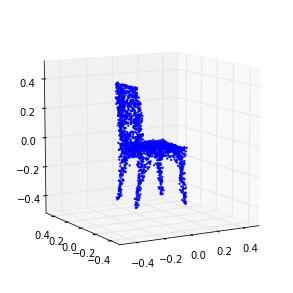

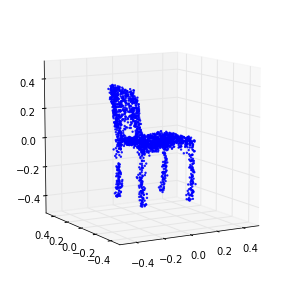

481 (0.053382728828324212, -3.883370699705901)
482 (0.082807406727914451, -1.7875202503745202)
483 (-0.15559441647319883, -0.64376966889809684)
484 (-0.1027007015215026, -1.6791462721648041)
485 (0.036207507164390001, -1.7539414057025202)
486 (0.071302608207420071, -0.19271354818785633)
487 (-0.1321331367034603, -1.9318194983320103)
488 (-0.12861088617808289, -3.9254476935775191)
489 (0.01641208345277442, -4.2153162603025081)
490 (0.066607171255681247, -2.8100777489167674)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-490 is not in all_model_checkpoint_paths. Manually adding it.


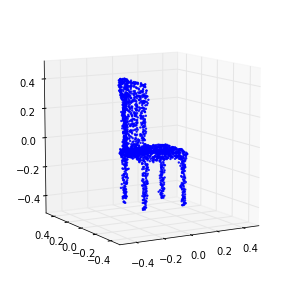

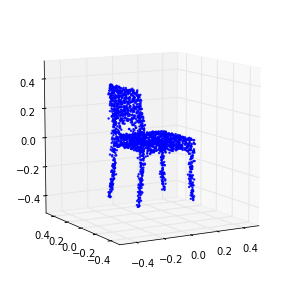

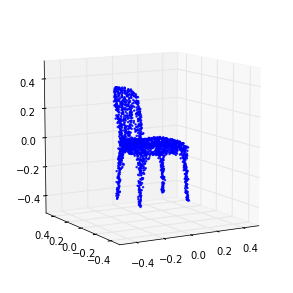

491 (-0.092161715423895257, -0.2085554534914317)
492 (-0.15780848317814095, -1.8216788327252422)
493 (-0.0038158242073323993, -1.7728979146039043)
494 (0.082847995331717855, -0.064126996392453159)
495 (-0.0031573408179812962, -1.1020193624275703)
496 (-0.16276309044548759, -4.1335453280696166)
497 (-0.025174525566399097, -4.2365114335660579)
498 (0.060193676956825787, -3.1585854159461126)
499 (-0.076621031733574693, -0.18588199052545759)
500 (-0.078528891531405631, -1.5225947510313105)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-500 is not in all_model_checkpoint_paths. Manually adding it.


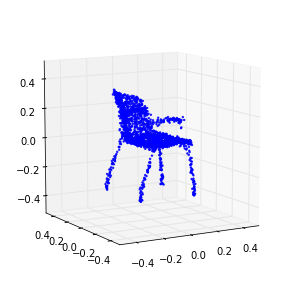

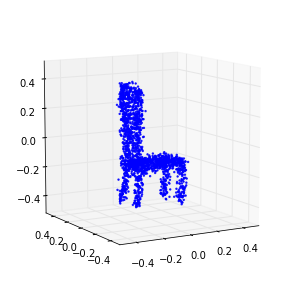

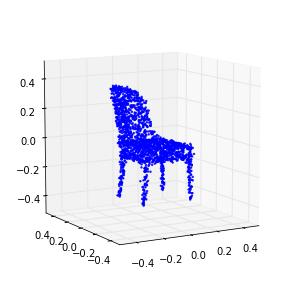

501 (0.027936798085769019, -1.3780893374372412)
502 (0.10412790731147484, -0.4712923211907899)
503 (-0.052156608703511735, -0.99987425365381766)
504 (-0.19217870007786486, -3.8704359619705766)
505 (-0.067392566262020004, -4.0872504976060657)
506 (0.10392299331034775, -4.0942454956195968)
507 (0.031022093527846867, -1.9643204979322575)
508 (-0.16976211793996671, -0.39295535824365085)
509 (-0.11906160910924275, -1.7367546116864239)
510 (0.055985920386457888, -1.5098377973945052)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-510 is not in all_model_checkpoint_paths. Manually adding it.


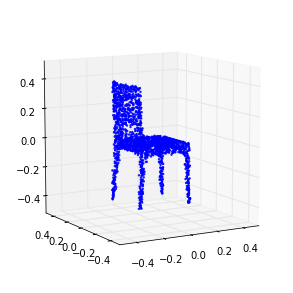

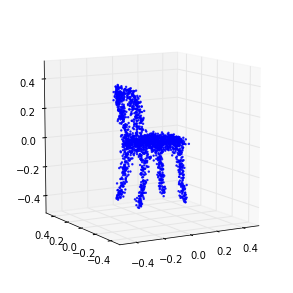

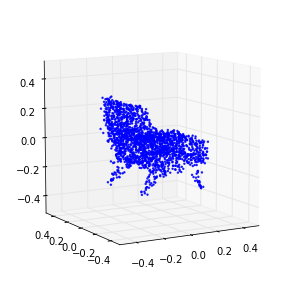

511 (0.090035206783148983, 0.088864875060540652)
512 (-0.11584801099228638, -2.0308210282000125)
513 (-0.14870398846213465, -4.0499369833204479)
514 (0.021258988969579892, -4.1709896723429365)
515 (0.13341275937855243, -3.7425348140575267)
516 (-0.074067405287038396, -0.29985906942575064)
517 (-0.14474342698576273, -0.8677885686909711)
518 (-0.028145427532770016, -1.4469276313428525)
519 (0.10349805436476513, -0.51301436071042661)
520 (0.044486444402072167, -0.2408547188948702)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-520 is not in all_model_checkpoint_paths. Manually adding it.


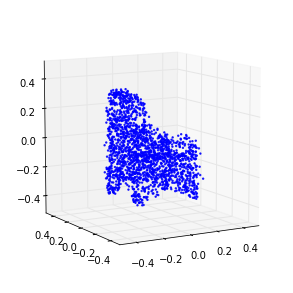

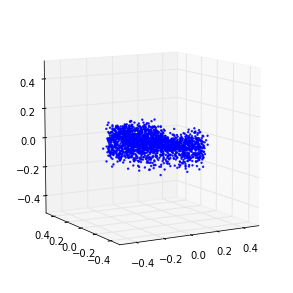

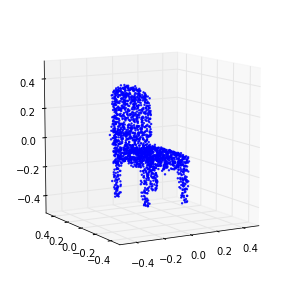

521 (-0.19838426918895155, -3.547831800248888)
522 (-0.092498549743107075, -4.1121612124972877)
523 (0.04921328871062508, -4.0092701735319913)
524 (0.064252107424868476, -1.9983553956090301)
525 (-0.16633836271034347, -0.46860927902162075)
526 (-0.095801363133445935, -1.7004254349955805)
527 (0.065390957429729127, -1.3905775944391887)
528 (0.11094651580960663, -0.026487509685534018)
529 (-0.12423862258869189, -1.8194183203633185)
530 (-0.15927355846873037, -3.814375736095287)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-530 is not in all_model_checkpoint_paths. Manually adding it.


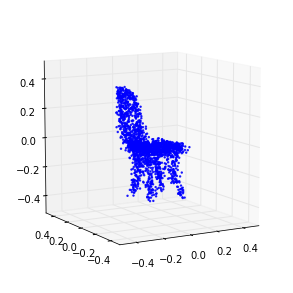

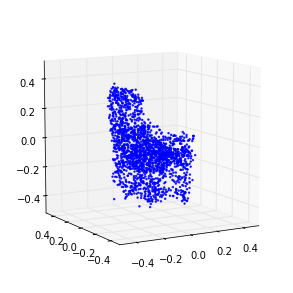

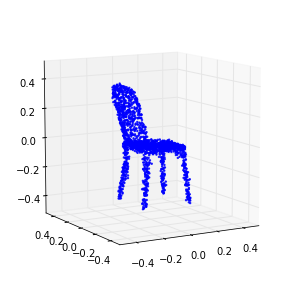

531 (-0.018536971509456636, -4.0534697815223977)
532 (0.10096693014105161, -3.8018265741842763)
533 (-0.03297458627709636, -0.68256247326455732)
534 (-0.14935647327866819, -1.1287152220805485)
535 (-0.045592889955474274, -1.7084115081363254)
536 (0.090648534031653849, -0.63823416939488165)
537 (0.067718391341191744, -0.17517596090005505)
538 (-0.19355961420331841, -3.4898730913798013)
539 (-0.092436652989299206, -4.0944966563472045)
540 (0.027678721287736185, -3.7181828022003174)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-540 is not in all_model_checkpoint_paths. Manually adding it.


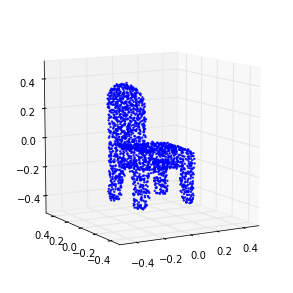

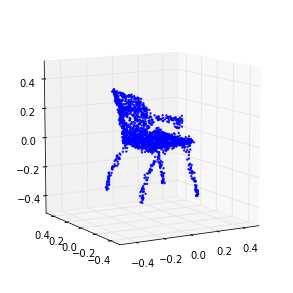

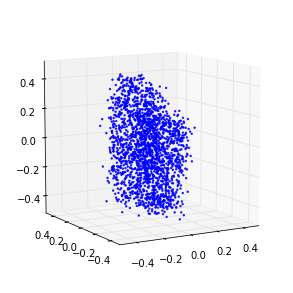

541 (0.10240852979046328, -1.9794813137915399)
542 (-0.13694796282108182, -0.57932570949196815)
543 (-0.1424373712942556, -2.0582277289143316)
544 (0.049588783837302967, -1.9201841486824884)
545 (0.073783357386235843, -0.24873956775775663)
546 (-0.077969829834721713, -1.3027288664684251)
547 (-0.11594171706173155, -3.9457152243013733)
548 (-0.033860595510513694, -3.9466354052225747)
549 (0.10001657475475911, -2.544967699933935)
550 (-0.018747519853490369, -0.49255562615063453)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-550 is not in all_model_checkpoint_paths. Manually adding it.


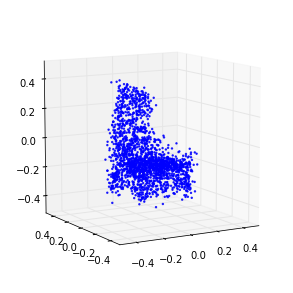

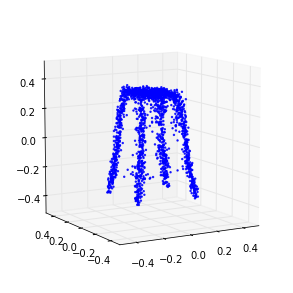

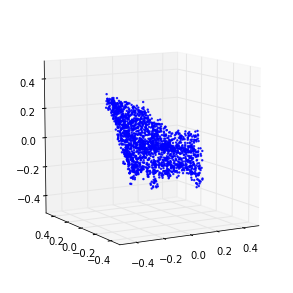

551 (-0.18034261872095089, -2.3318369123670788)
552 (-0.012230364081484301, -2.6920892309259483)
553 (0.044842991812361614, -1.014529982926669)
554 (-0.042027652160161071, -0.56428523554846088)
555 (-0.13914420375669445, -3.5245577759212918)
556 (-0.019854036691012204, -4.2879031852439597)
557 (0.10854284727463016, -3.8950974234828242)
558 (-0.031821042658002285, -0.4875394167309558)
559 (-0.17547806987056025, -1.1635822388860915)
560 (-0.061580776092078952, -2.0511293367103294)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-560 is not in all_model_checkpoint_paths. Manually adding it.


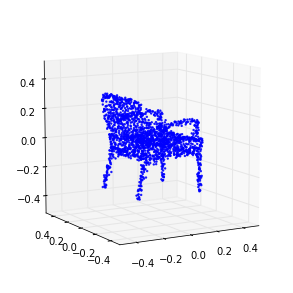

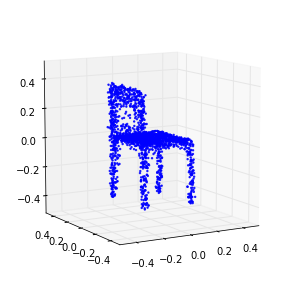

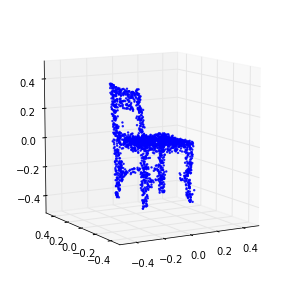

561 (0.068830831866297459, -0.628485812081231)
562 (0.040759231991789956, -0.57606872792045272)
563 (-0.14914290513843298, -3.8237989213731556)
564 (-0.023938722349703311, -4.3809470070732965)
565 (0.13845559066092528, -4.2636253039042158)
566 (-0.001180778995708183, -1.6072743547459443)
567 (-0.15455980178106715, -0.27834177879547634)
568 (-0.0556444617609183, -1.6401287538033944)
569 (0.060770382242346252, -1.1256788869698842)
570 (0.090613830234441486, 0.076457256244288549)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-570 is not in all_model_checkpoint_paths. Manually adding it.


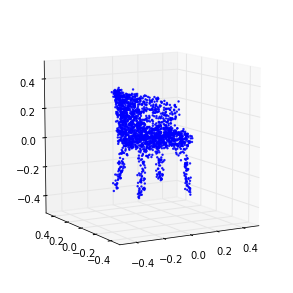

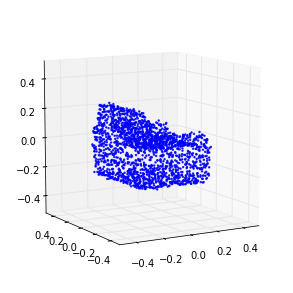

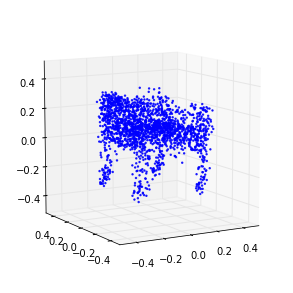

571 (-0.17180751432423239, -2.9373347207351967)
572 (-0.110863406052468, -4.2492690439577459)
573 (0.029859793945043175, -4.056001265843709)
574 (0.10884269522847953, -2.4061870177586875)
575 (-0.040834818131945748, -0.24138649732426362)
576 (-0.14899637435597402, -1.9763495016981054)
577 (-0.011100147216132394, -2.5018828003494828)
578 (0.087421296674896176, -1.0129532717444278)
579 (-0.092878383770585063, -0.60916904249676951)
580 (-0.13173263968416937, -3.3650719942869962)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-580 is not in all_model_checkpoint_paths. Manually adding it.


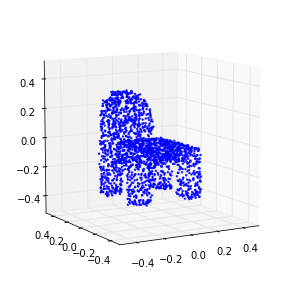

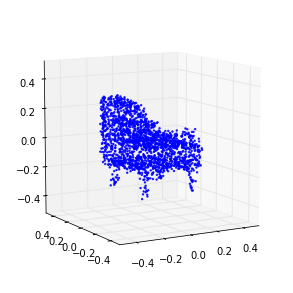

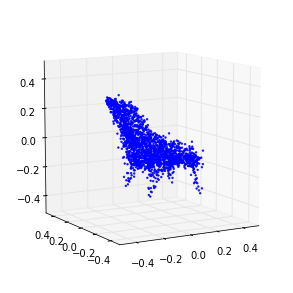

581 (0.0079575793196757626, -4.0685747817710594)
582 (0.179836624784878, -4.5465432802836103)
583 (0.27978396288774632, -4.0529033872816296)
584 (-0.29261111879238377, 0.1281166468505506)
585 (-0.18325923842688402, 0.11583549129190268)
586 (-0.027943197568809544, -0.23341254103514883)
587 (0.080094027995235392, -1.0573133031527202)
588 (0.021156164410489578, -3.7588663984228066)
589 (-0.098213168978691104, -3.0295866948586925)
590 (-0.057296682935622005, -2.2632388759542397)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-590 is not in all_model_checkpoint_paths. Manually adding it.


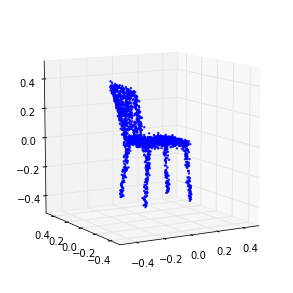

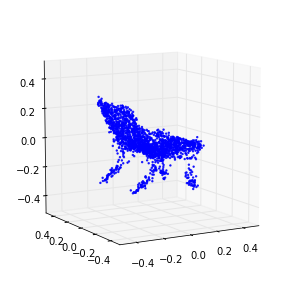

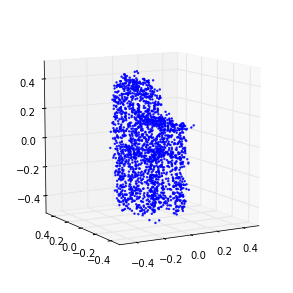

591 (0.086977974808326475, -2.7417515118916831)
592 (0.11983255760537254, -4.2940956751505537)
593 (-0.183676293299154, -1.3777258202985481)
594 (-0.096925899075965091, -0.17116825524027701)
595 (0.02499271363571838, -0.49083102577262455)
596 (0.12554415291934101, -1.0011079893619925)
597 (-0.030529960948559972, -4.0467239485846624)
598 (-0.16920612870405119, -2.9055573763670743)
599 (-0.044775746790347279, -2.5512185273347079)
600 (0.076869228944458343, -2.8822324982395879)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-600 is not in all_model_checkpoint_paths. Manually adding it.


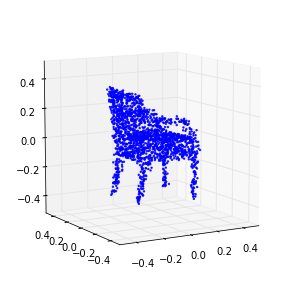

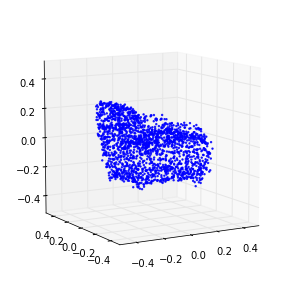

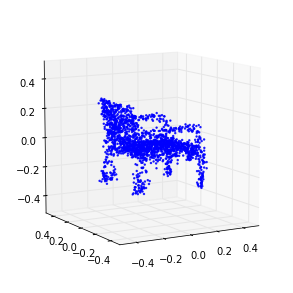

601 (0.033820736125387531, -4.3562243073074907)
602 (-0.1661172522990792, -1.4556478714501415)
603 (-0.072833369037619347, -0.66729679703712463)
604 (0.052451491645640794, -0.84889599349763656)
605 (0.14152716084348935, -2.0245805471031755)
606 (-0.091769289860018977, -3.8525213577129223)
607 (-0.17563112739611556, -2.3119522553903087)
608 (-0.048871466358778655, -2.8137969440884061)
609 (0.080124955272508985, -4.4210830794440374)
610 (0.096074078942614577, -4.6062204043070478)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-610 is not in all_model_checkpoint_paths. Manually adding it.


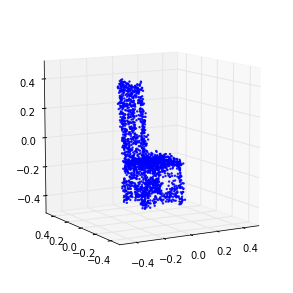

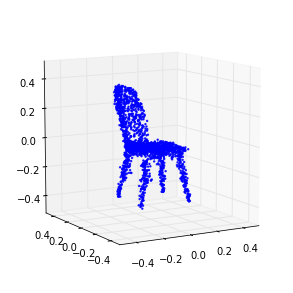

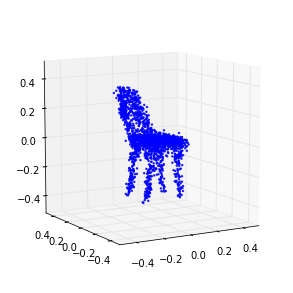

611 (-0.1886826919046817, -0.66193297091457581)
612 (-0.099711320425073302, -0.13140369192869575)
613 (0.046568667543707074, -0.35919512808322906)
614 (0.091274993956364972, -1.742789555478979)
615 (-0.087667818257102265, -4.2509635731025979)
616 (-0.13794688953569642, -2.984986737922386)
617 (-0.0063150840569977411, -3.0775758072181985)
618 (0.11532853450626135, -4.0599726041158037)
619 (0.047013956680893899, -4.2334441476398048)
620 (-0.21544189710445977, -0.39798556544162611)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-620 is not in all_model_checkpoint_paths. Manually adding it.


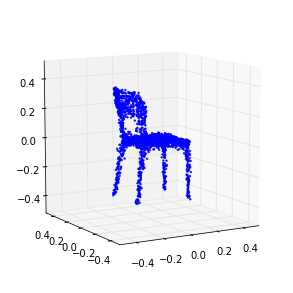

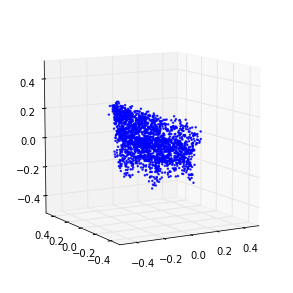

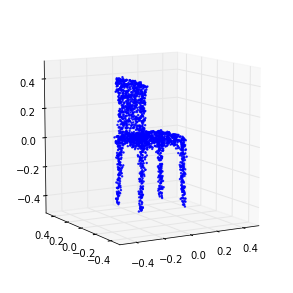

621 (-0.077935827937391067, -0.16572369566118275)
622 (0.054102438784859798, -0.97123480615792446)
623 (0.021159100256584309, -3.8106743759579129)
624 (-0.094206130283850206, -3.5681363741556802)
625 (-0.08531380539277085, -1.7792908350626628)
626 (0.10223082537866302, -2.0571098945758961)
627 (0.030497702100762615, -4.424766143163045)
628 (-0.14089605886903073, -2.4371629246958979)
629 (-0.052037512786962371, -1.0845696617055822)
630 (0.08154355824269631, -0.53155850812240879)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-630 is not in all_model_checkpoint_paths. Manually adding it.


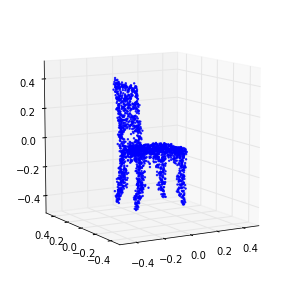

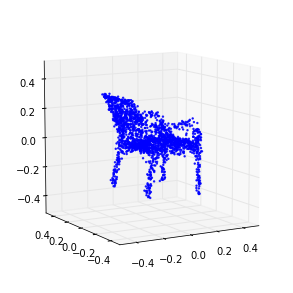

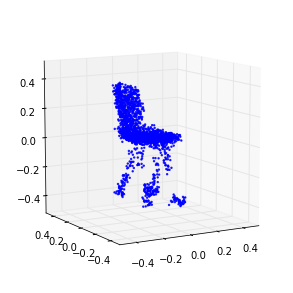

631 (0.194011982847695, -0.29065321772186842)
632 (-0.015303747424924815, -1.8951565032755886)
633 (-0.26133326058862388, -4.3912141411392778)
634 (-0.097749615681392177, -4.6221715609232588)
635 (0.050368707903005461, -4.5419171121385364)
636 (0.018703299609047395, -1.917233106162813)
637 (-0.074430973303538775, -0.42577927097402235)
638 (-0.060790638460053337, -2.152447254569442)
639 (0.08034089444964021, -3.5004016381722911)
640 (0.23212161680890453, -3.3950927875660084)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-640 is not in all_model_checkpoint_paths. Manually adding it.


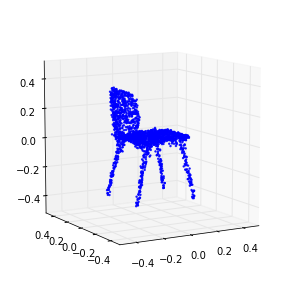

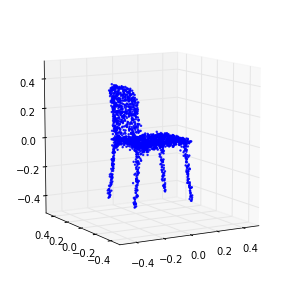

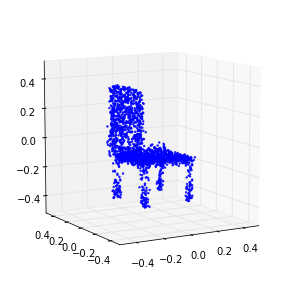

641 (-0.059058278661083291, -1.1971524661337887)
642 (-0.29818822885001145, -1.477478685202422)
643 (-0.10779522119296922, -1.8082213975765087)
644 (0.070126295917563974, -2.3054360548655191)
645 (0.024550473062252557, -4.3760190451586691)
646 (-0.092459008746125074, -3.0581192970275879)
647 (-0.076566902920603752, -0.86529944230009004)
648 (0.048701253933487114, -1.0174804153265777)
649 (0.18334780171237611, -1.2630679651542946)
650 (0.18015228804476835, -2.5572531973874129)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-650 is not in all_model_checkpoint_paths. Manually adding it.


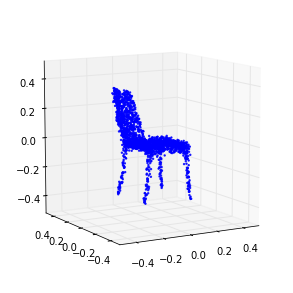

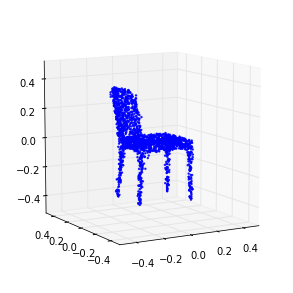

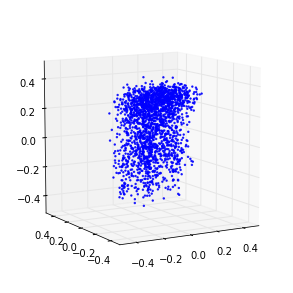

651 (-0.23512587861192447, -3.9447557572965271)
652 (-0.22044500698921857, -2.9811680228621871)
653 (-0.096332252035952276, -3.4137736426459417)
654 (0.050171968230494746, -3.7933650899816445)
655 (0.13474725552455144, -4.7708660584908946)
656 (-0.11474440268896244, -2.4089738439630577)
657 (-0.15949694250744803, -0.59958235753907096)
658 (0.0081961266558479382, -0.64230096781695334)
659 (0.068060458299738391, -1.7342039479149713)
660 (-0.034691584793229896, -4.4881571663750544)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-660 is not in all_model_checkpoint_paths. Manually adding it.


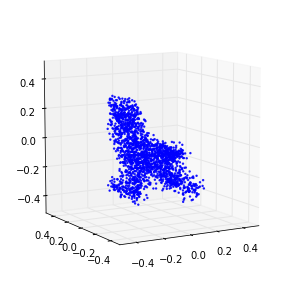

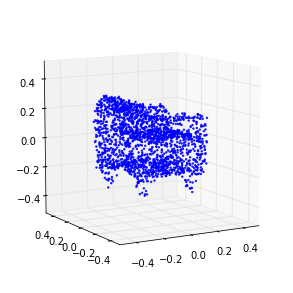

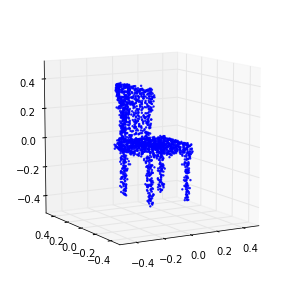

661 (-0.12322374215280568, -3.1706291304694281)
662 (0.0026416667737066747, -2.862470414903429)
663 (0.13772450731722294, -1.754113206156978)
664 (-0.0067705156764498462, -0.99967465632491637)
665 (-0.18390952906812782, -3.5015139579772949)
666 (-0.012896010700475287, -3.8049529746726707)
667 (0.15645674139399218, -4.1396657890743676)
668 (0.066367344144317844, -1.8060629294702299)
669 (-0.24462141244223826, -0.87060254149966765)
670 (-0.078724081648720634, -1.44358730757678)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-670 is not in all_model_checkpoint_paths. Manually adding it.


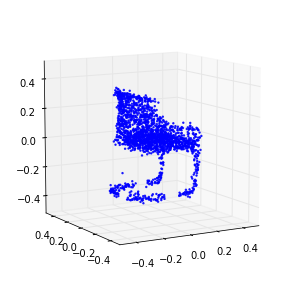

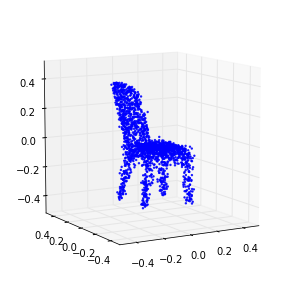

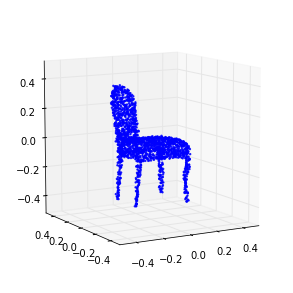

671 (0.054287006174800576, -1.8092272634859439)
672 (0.087589942939855434, -3.5683877114896423)
673 (-0.12211584414320964, -3.0674949133837663)
674 (-0.079807358276512891, -1.8855344277841073)
675 (0.040052174190404237, -1.7200631124001962)
676 (0.19775422481751001, -1.9128001751723114)
677 (0.14186949194581419, -0.80328012920088243)
678 (-0.25448345838597525, -2.8454361756642661)
679 (-0.17946175358223695, -3.6716452439626059)
680 (-0.026945268980192918, -3.5014450903292054)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-680 is not in all_model_checkpoint_paths. Manually adding it.


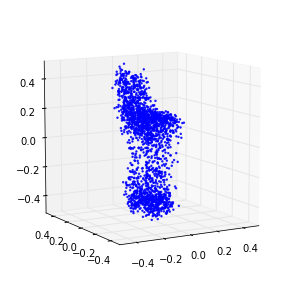

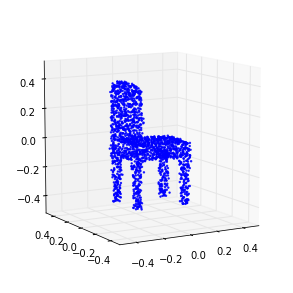

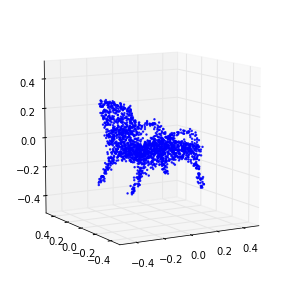

681 (0.080395685846882836, -3.8227250222806579)
682 (0.21964853359041392, -4.0172241528828936)
683 (0.026602789925204384, -1.3818821749753423)
684 (-0.29963129245572617, -1.4747066541954323)
685 (-0.14328750101504503, -1.7501183615790472)
686 (-0.021924542325238387, -1.8438285809976083)
687 (0.088871982686773501, -0.88196737760746924)
688 (0.028756041300517541, -1.1836645708729823)
689 (-0.16892791375241897, -4.2189022876598221)
690 (-0.039599132424013479, -4.3344440813417791)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-690 is not in all_model_checkpoint_paths. Manually adding it.


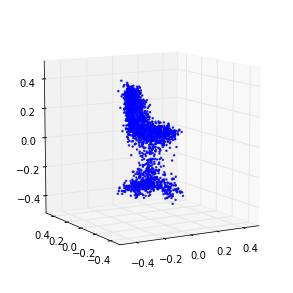

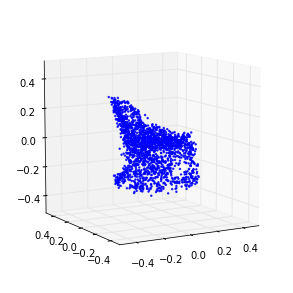

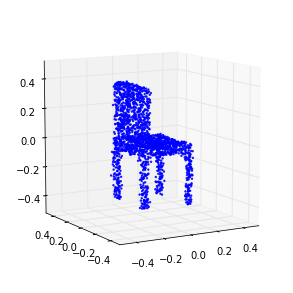

691 (0.097935342002246115, -4.5566453580503108)
692 (0.27572072255942559, -4.9794090412281173)
693 (-0.10203965885771646, -2.0916871188415422)
694 (-0.26527726054191592, -0.040994137180624182)
695 (-0.11002585968623559, -0.25588114007755564)
696 (0.057485471044977504, -0.39203974052711771)
697 (0.061743182702748867, -2.4406669537226358)
698 (-0.060189066896284067, -4.4626424224288375)
699 (-0.051562667362116003, -3.344519023542051)
700 (0.022244614021231731, -1.5813009915528473)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-700 is not in all_model_checkpoint_paths. Manually adding it.


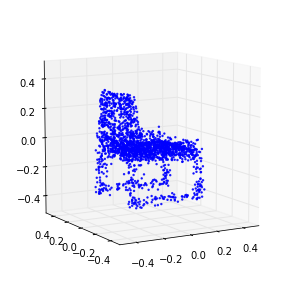

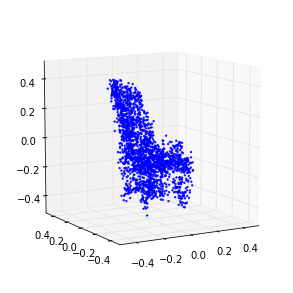

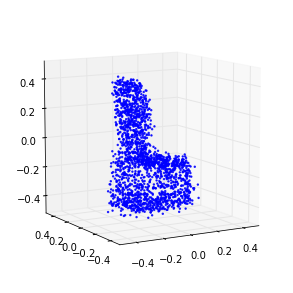

701 (0.15757878625558483, -0.86318897759472879)
702 (-0.037488595244509204, -1.6369142593057067)
703 (-0.1720353886416113, -3.9198308167634188)
704 (-0.024198711932533316, -4.3844025223343461)
705 (0.13760453083172994, -4.783738666110569)
706 (0.011757287065739985, -3.1672631171014576)
707 (-0.20837557827708897, -0.22552913813679307)
708 (-0.043999099262334682, -0.34460335362840583)
709 (0.11238842806606381, -0.37169667968043574)
710 (0.23188721725234279, -0.73701395480721088)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-710 is not in all_model_checkpoint_paths. Manually adding it.


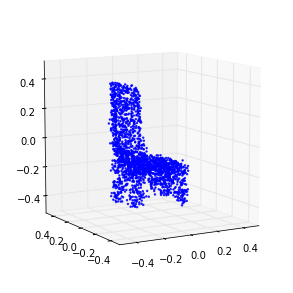

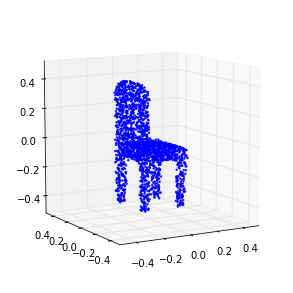

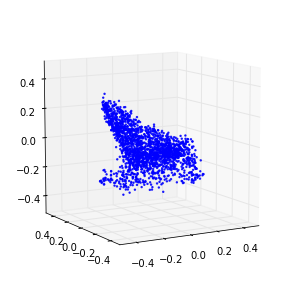

711 (-0.11363104861919526, -3.3368382453918457)
712 (-0.2293211242666951, -4.4014354458561646)
713 (-0.062572756299266105, -4.7264127554716886)
714 (0.087302172266774711, -4.6283675476356789)
715 (0.051723804552521971, -2.5808568883825234)
716 (-0.11467665871260342, -0.4872492653904138)
717 (-0.053246651576073084, -1.4026732886279072)
718 (0.027644933622192454, -3.1917965677049427)
719 (0.13876172995401753, -4.4854504797193737)
720 (-0.1204544047790545, -2.5466726841749967)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-720 is not in all_model_checkpoint_paths. Manually adding it.


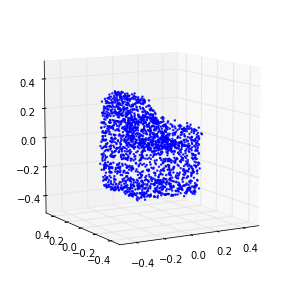

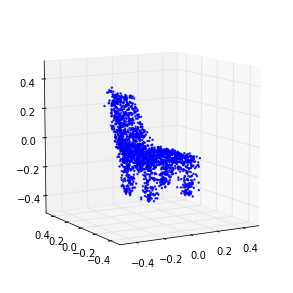

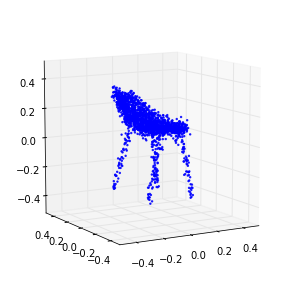

721 (-0.10919012718454556, -0.79409123350072786)
722 (0.041441686879153602, -0.83163327530578335)
723 (0.17253478326731259, -0.33835265261155589)
724 (-0.026747955947562501, -2.0744118712566517)
725 (-0.19665872364960335, -4.0567485403131558)
726 (-0.061500428113396524, -4.5442943043178978)
727 (0.10738509852715113, -4.7519398265414772)
728 (0.057717709312284433, -3.8588949883425676)
729 (-0.20562001314980013, -0.29493744754128987)
730 (-0.074728285790317595, -0.35503586174713242)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-730 is not in all_model_checkpoint_paths. Manually adding it.


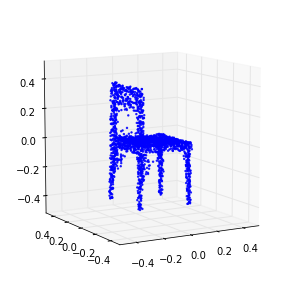

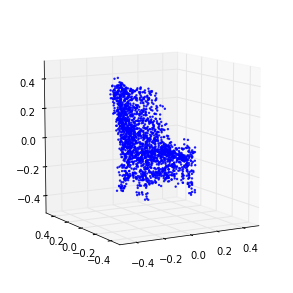

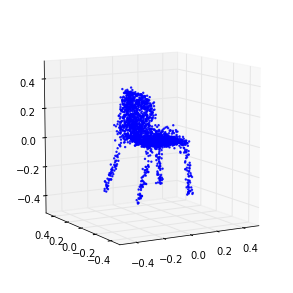

731 (0.07473487961623404, -0.58029774935157208)
732 (0.068887695394180437, -2.7450029011125916)
733 (-0.066143668525748781, -4.4029599648934825)
734 (-0.042645825431854634, -3.3525810948124639)
735 (0.010699491106249667, -1.7096743936891909)
736 (0.086795226946749071, -0.59048226089389233)
737 (0.092063795940743556, -0.70529360434523336)
738 (-0.13819539697357902, -3.3804568626262523)
739 (-0.019489449993879707, -4.0239824277383311)
740 (0.098239826762841806, -4.5656140998557762)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-740 is not in all_model_checkpoint_paths. Manually adding it.


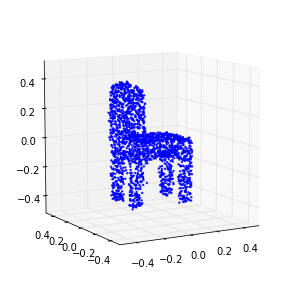

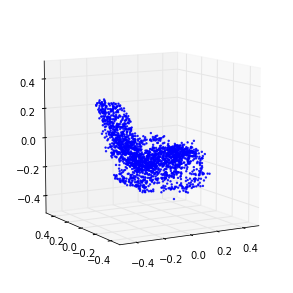

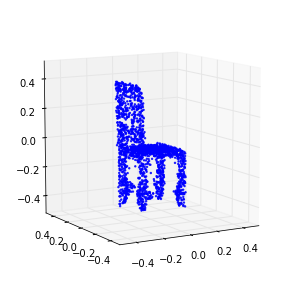

741 (0.02654370629677066, -3.1823567483160229)
742 (-0.13686993530503025, -0.38677340745925903)
743 (-0.02997826542015429, -0.32309543355195608)
744 (0.084104879669569158, -0.54045208405565337)
745 (0.0079670701727822969, -2.845216185958297)
746 (-0.10721242590634911, -4.4185329543219671)
747 (-0.030460351705551149, -3.8317420747545032)
748 (0.04319347115578475, -2.8385380020848028)
749 (0.025675819593447224, -0.75535040983447321)
750 (0.00060633483032385507, -0.60893948210610283)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-750 is not in all_model_checkpoint_paths. Manually adding it.


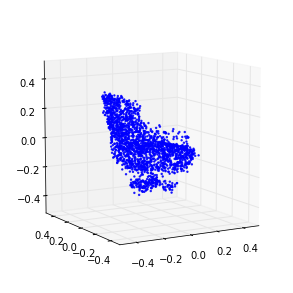

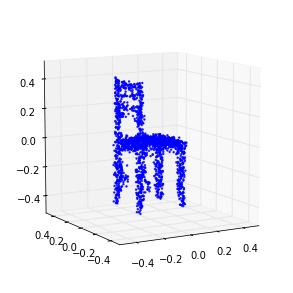

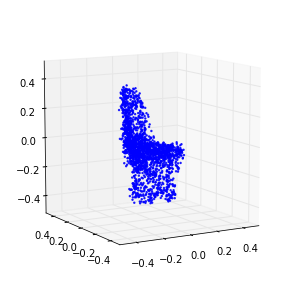

751 (-0.088472336985998684, -2.8933078138916581)
752 (0.011557393866004767, -3.7765012493839971)
753 (0.12528587511430184, -4.250792044180411)
754 (-0.036504421969530756, -2.0519517759482064)
755 (-0.10235818603800403, -0.45972580103962507)
756 (0.0026957858077905797, -0.38770282806621659)
757 (0.14945689114155591, -0.59389805462625289)
758 (0.12905497763443877, -2.052368457670565)
759 (-0.14822284042559289, -3.9136518107520208)
760 (-0.12170295684977814, -3.7653290607311107)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-760 is not in all_model_checkpoint_paths. Manually adding it.


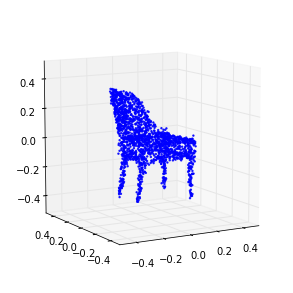

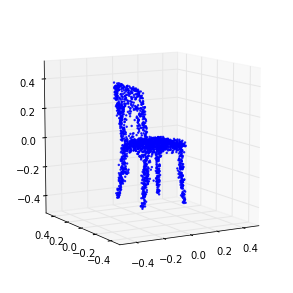

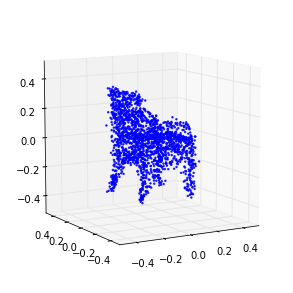

761 (0.021725162118673324, -3.4398178701047546)
762 (0.095711309987085838, -2.2916164398193359)
763 (-0.014393081874759109, -0.52353469447957146)
764 (-0.094134685341958652, -1.6500387478757788)
765 (-0.016095133801853217, -3.0112369325425892)
766 (0.12987139855545979, -3.5987936832286693)
767 (0.15066139242715307, -3.847598429079409)
768 (-0.17519650577946946, -1.0720306060932301)
769 (-0.12307971318562826, -0.56296886448506955)
770 (0.052544337248912561, -0.36765996201170814)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-770 is not in all_model_checkpoint_paths. Manually adding it.


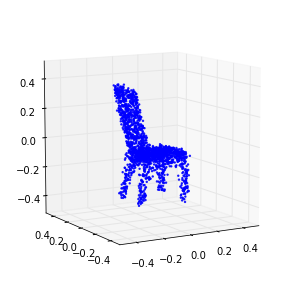

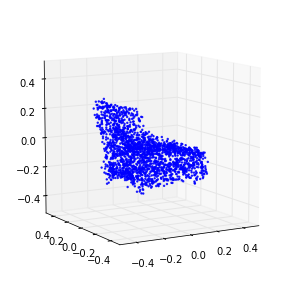

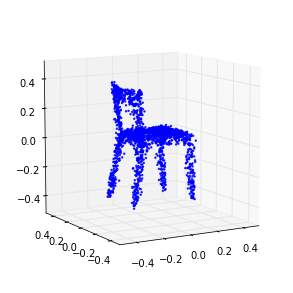

771 (0.17375619679137513, -0.56454591066749005)
772 (0.11952896316846212, -1.6103169752491846)
773 (-0.19803925662956856, -3.7136029579021312)
774 (-0.093179342785367256, -4.1417719788021508)
775 (0.0096169184410461669, -4.3217740235505282)
776 (0.1380998015679695, -3.9295335345798068)
777 (-0.032139819405145112, -1.4892941876142114)
778 (-0.12282029032983162, -0.36236082610708698)
779 (-0.009509421615964837, -0.40091508019853522)
780 (0.10879401356947643, -0.66373282450216786)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-780 is not in all_model_checkpoint_paths. Manually adding it.


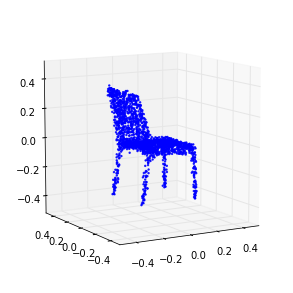

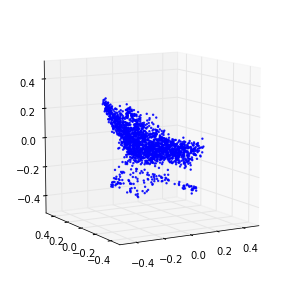

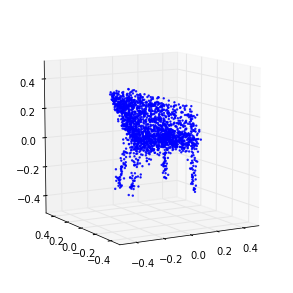

781 (0.1206734849622956, -2.2370701785440796)
782 (-0.1623625967927553, -3.6809743686958596)
783 (-0.08934200487479016, -3.3064827124277749)
784 (0.034381979634916342, -2.6004631342711271)
785 (0.10305769156526637, -1.6929223515369274)
786 (0.010352404332823223, -0.24780428575144875)
787 (-0.099827387308080995, -1.7074618692751284)
788 (-0.017397151128561408, -2.6063062173348888)
789 (0.060350456419918271, -3.4362317544442638)
790 (0.059779316407662854, -3.127868091618573)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-790 is not in all_model_checkpoint_paths. Manually adding it.


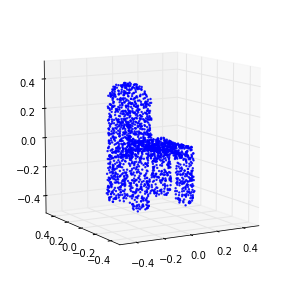

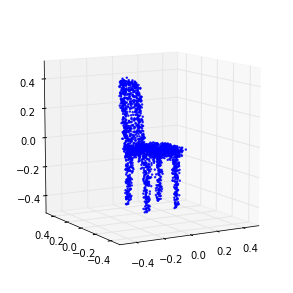

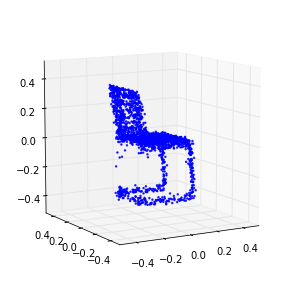

791 (-0.11272307757150243, -0.7300953015133187)
792 (-0.021966641686028906, -0.28975250934147173)
793 (0.074060087444053763, -0.5571644769774543)
794 (0.037359014760564878, -2.1300425838541099)
795 (-0.058836657112395323, -3.5290830135345459)
796 (-0.041664931523027242, -3.3799240412535489)
797 (0.0048666743561625479, -2.3770154979493885)
798 (0.021080450741229235, -0.90467667910787797)
799 (0.067874659073573568, -0.31378154801549735)
800 (-0.020775523919750145, -1.6711945997344122)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-800 is not in all_model_checkpoint_paths. Manually adding it.


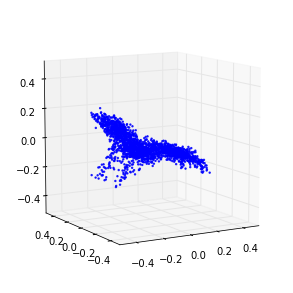

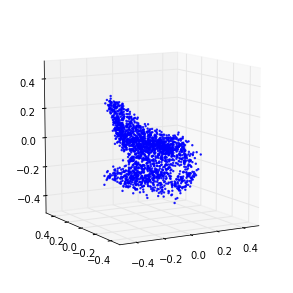

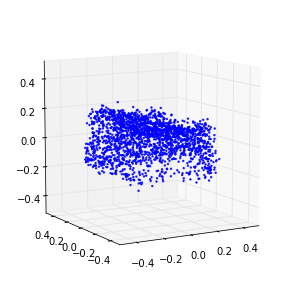

801 (-0.042169373537655229, -3.03944460550944)
802 (0.050449142887912413, -3.5723634119387024)
803 (0.099076239074821826, -3.0415911674499512)
804 (-0.089066025987267497, -0.86120635160693415)
805 (-0.054738694995089814, -0.31715172749978526)
806 (0.042229468637594469, -0.13666556844556774)
807 (0.06778980579089236, -1.3419574988936935)
808 (-0.0136569794267416, -3.0906394852532282)
809 (0.012620455619913561, -3.3194043989534729)
810 (-0.015025778956435344, -2.1832969895115606)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-810 is not in all_model_checkpoint_paths. Manually adding it.


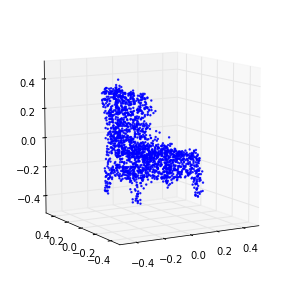

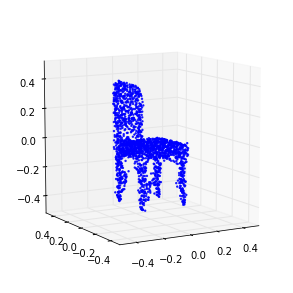

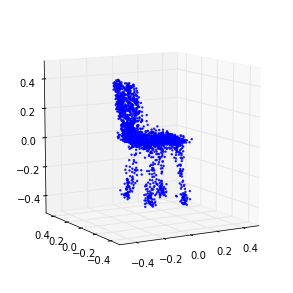

811 (-0.028236219176539668, -1.1669512920909457)
812 (0.083504246244276006, -0.59630652103159165)
813 (0.14108817582881009, -0.9396412229096448)
814 (-0.096149504557251936, -2.6955962225242898)
815 (-0.069803329405409315, -3.3893688166583025)
816 (0.035414165968972226, -3.5933605741571495)
817 (0.11200071420106623, -3.3436430383611611)
818 (-0.027723550589548215, -0.79480064632716008)
819 (-0.023782341154637159, -0.48386326377038602)
820 (-0.0055340539802003789, -0.99774252595724888)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-820 is not in all_model_checkpoint_paths. Manually adding it.


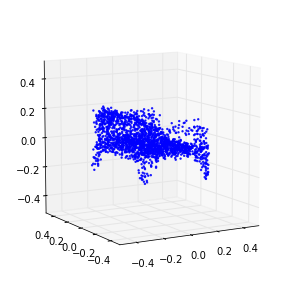

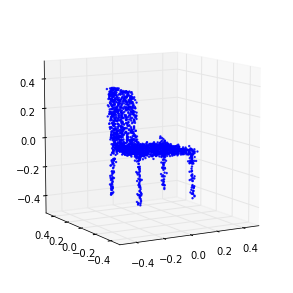

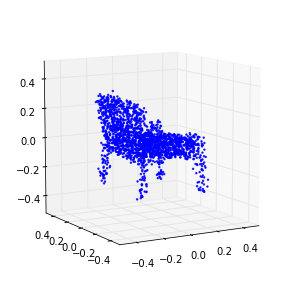

821 (-0.021940273888133192, -2.4430448744032116)
822 (0.063020093159543142, -2.9975474852102773)
823 (0.095093311534987554, -2.9175982122068054)
824 (-0.10197850340218456, -1.2298529556504003)
825 (-0.081716278788668134, -0.48618432658689992)
826 (0.046640907303878557, -0.22264078804464252)
827 (0.12571343310453273, -0.65427712958168105)
828 (0.015911617516367525, -2.3724692088586314)
829 (-0.12382037394714576, -2.6622282752284296)
830 (-0.013373420808326314, -2.5540976082837141)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-830 is not in all_model_checkpoint_paths. Manually adding it.


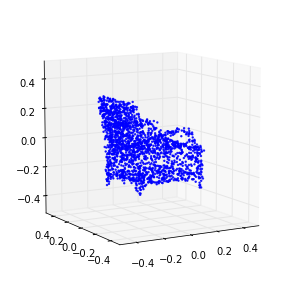

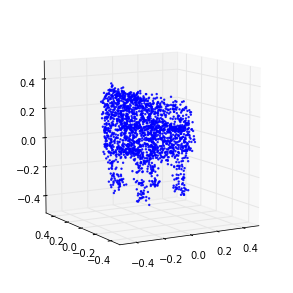

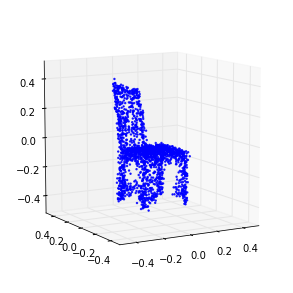

831 (0.11725662803208386, -2.516011388213546)
832 (0.13247505311888677, -1.5550752850594345)
833 (-0.10397964644211311, -0.59286987615956199)
834 (-0.12464229227216156, -1.0936371375013281)
835 (0.01777915845590609, -1.6012653907140095)
836 (0.16208253927804805, -2.1880559170687639)
837 (0.0077249419358041554, -2.4274203335797346)
838 (-0.18770976862697689, -0.3654804527759552)
839 (-0.0091916851630365407, -0.22601233671108881)
840 (0.12747671789041273, -0.64251773749236707)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-840 is not in all_model_checkpoint_paths. Manually adding it.


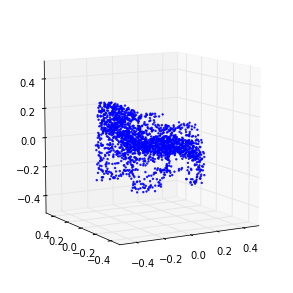

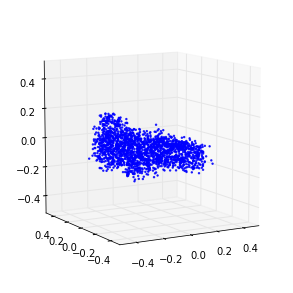

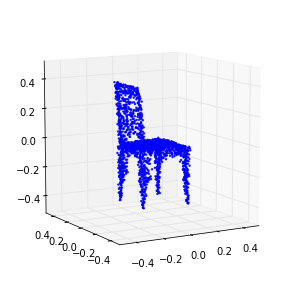

841 (0.21158734277166702, -0.065750924042529524)
842 (0.20332139956730383, -0.93163695903839894)
843 (-0.19484675407961563, -2.9420069058736167)
844 (-0.16519239092314686, -2.6214307060948125)
845 (-0.037103826676805812, -2.7274819568351463)
846 (0.069675650985704524, -2.8751166926489935)
847 (0.1867344282567501, -2.5131693416171603)
848 (-0.046917395666241646, -0.48286391739492063)
849 (-0.15262736809198504, -0.43241765598456067)
850 (-0.045867738107012376, -0.36565842010356764)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-850 is not in all_model_checkpoint_paths. Manually adding it.


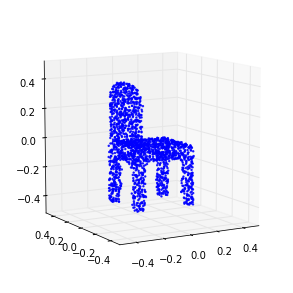

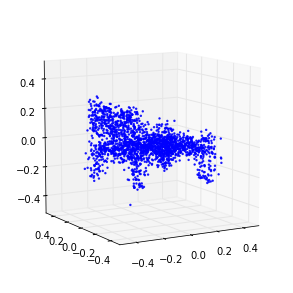

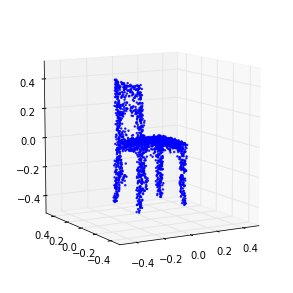

851 (0.071512405919256034, -0.98001732428868615)
852 (0.1699454241466743, -2.2313915358649359)
853 (-0.080996911724408469, -2.335910510133814)
854 (-0.13122848379253238, -1.5677165852652655)
855 (0.0091375453949526508, -1.7680768701765273)
856 (0.13452043253238555, -1.6948731828618933)
857 (0.15292869993933925, -0.64659697645240355)
858 (-0.17487505768184308, -1.7217276449556704)
859 (-0.14487298082698274, -1.9781822363535564)
860 (0.014015952387341747, -2.1355743673112659)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-860 is not in all_model_checkpoint_paths. Manually adding it.


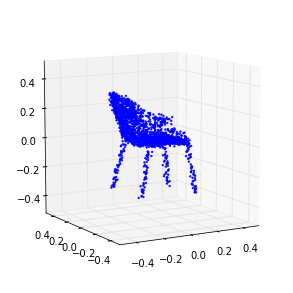

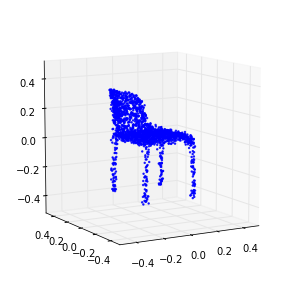

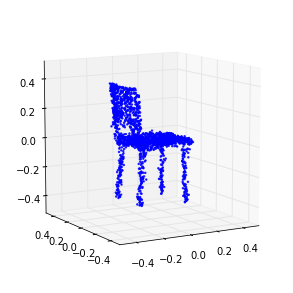

861 (0.16738797692513024, -2.6952734523349338)
862 (0.19649931843634005, -2.3940406640370688)
863 (-0.22509400121591711, -0.34616208959508826)
864 (-0.12405630977893317, -0.35512069129833468)
865 (0.010511328597311621, -0.39738438347423516)
866 (0.15361688815885119, -0.15337702562963521)
867 (0.22309417915013102, -0.90505060305198037)
868 (-0.060963926809253513, -2.929326790350455)
869 (-0.18337136771943835, -2.45238697970355)
870 (-0.06177610052680528, -2.6926587510991982)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-870 is not in all_model_checkpoint_paths. Manually adding it.


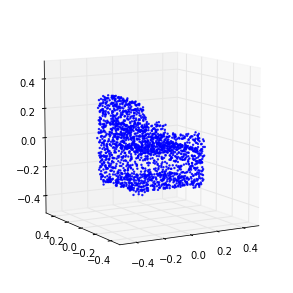

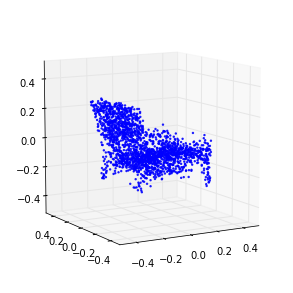

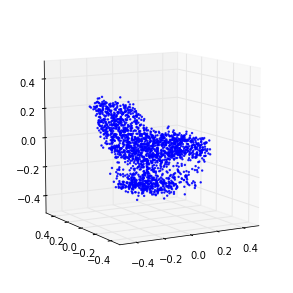

871 (0.039322482994585128, -2.9451202463220665)
872 (0.15280920329193273, -2.8720415477399475)
873 (0.010148725700047281, -0.26312851112473895)
874 (-0.097392707083512234, -1.0866469768462357)
875 (-0.058043726243906552, -1.4625675678253174)
876 (0.055912914968751094, -1.8370911236162539)
877 (0.053550175480820514, -2.6803522993017128)
878 (-0.043838400780050843, -1.7713208684214838)
879 (-0.061576283019449979, -1.1768412347193118)
880 (0.075427786343627512, -0.93602300131762473)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-880 is not in all_model_checkpoint_paths. Manually adding it.


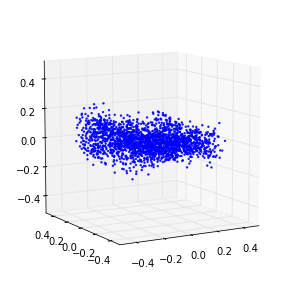

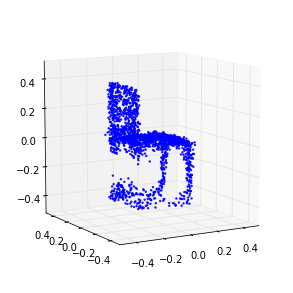

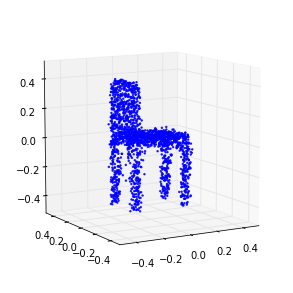

881 (0.13596831429059858, -0.56471578997594341)
882 (0.032035134139436261, -1.1617300473153591)
883 (-0.11978443776843724, -2.7535045676761203)
884 (-0.062128129560086461, -2.5994810439922191)
885 (0.055919674963310913, -2.2180074497505471)
886 (0.11780490651726723, -2.0505550040139093)
887 (-0.085632908744392569, -0.45254275409711731)
888 (-0.036454110854753745, -0.57884194784694243)
889 (0.026612491326199639, -0.68965928615243344)
890 (0.11652197094151268, -1.6903467443254259)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-890 is not in all_model_checkpoint_paths. Manually adding it.


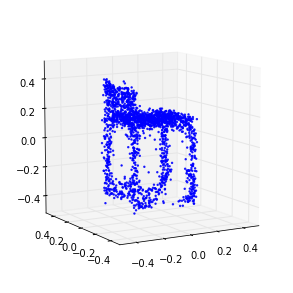

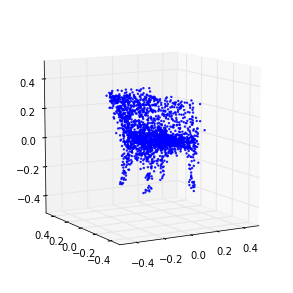

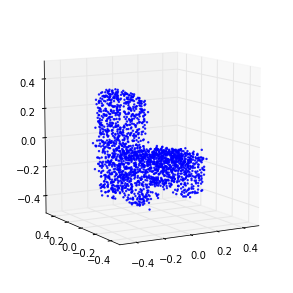

891 (-0.047643862140399437, -2.5366007486979165)
892 (-0.077922733376423511, -1.6120734656298603)
893 (0.014915702892122445, -1.6451417825840138)
894 (0.12686984739783738, -0.99199771770724543)
895 (0.097096905388213972, -0.55865355691424123)
896 (-0.16344296228554514, -1.6788453658421834)
897 (-0.080430902319925807, -1.9100143821151168)
898 (0.072870416842676977, -1.9785932390778154)
899 (0.15460083141095107, -2.3274964314919933)
900 (-0.03590997778983028, -1.1240310485440272)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-900 is not in all_model_checkpoint_paths. Manually adding it.


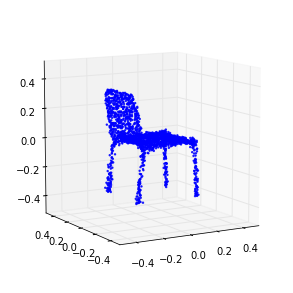

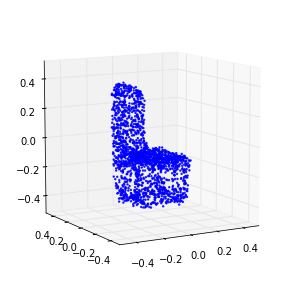

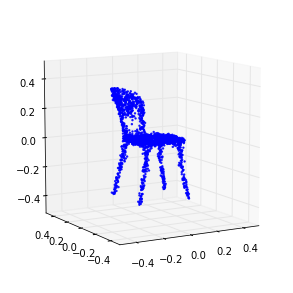

901 (-0.11277537633561426, -0.02877373648462472)
902 (-9.6958827365327768e-05, -0.33575610816478729)
903 (0.076088631649812069, -0.36140974162629358)
904 (0.054533996267451181, -1.7569038382282964)
905 (-0.075000404497539558, -2.1208972489392317)
906 (-0.050089402220867295, -1.7549730936686199)
907 (0.043925445623419899, -1.9062661329905193)
908 (0.04646555174280096, -0.84813977605490776)
909 (-0.038699453972555975, -0.29643168700514017)
910 (-0.066879157708198939, -1.1794099498678137)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-910 is not in all_model_checkpoint_paths. Manually adding it.


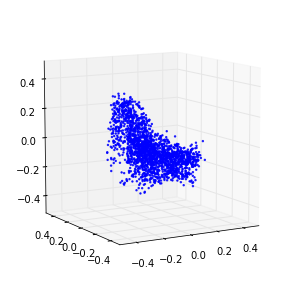

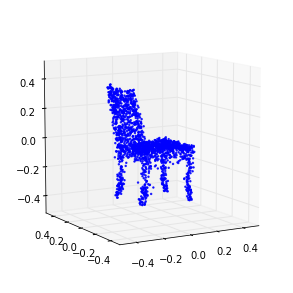

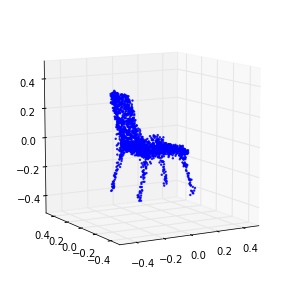

911 (0.0049601127497024009, -1.737969442650124)
912 (0.074540347026454082, -1.734752063398008)
913 (0.03413863350395803, -0.89884923343305234)
914 (-0.079748876986128314, -0.32275829326223443)
915 (-0.050720711273175699, -0.36609323605619093)
916 (0.036314518984269212, -0.57671678121443148)
917 (0.078173698484897608, -1.339776387921086)
918 (-0.015093999107678731, -1.580772947382044)
919 (-0.045397249995558352, -1.0462862209037498)
920 (-0.018584846132607372, -0.605681363079283)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-920 is not in all_model_checkpoint_paths. Manually adding it.


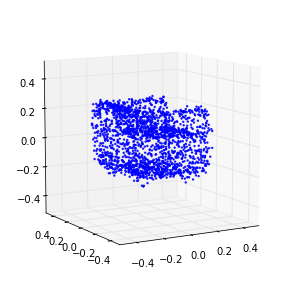

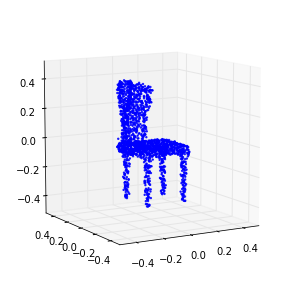

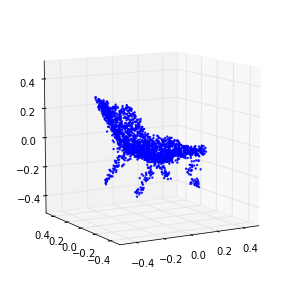

921 (0.047515542432665828, -0.50319271286328637)
922 (0.036822101639376749, -0.28914571360305502)
923 (-0.035026988490588135, -1.2112466383863378)
924 (-0.066756783563781674, -1.5070221137117457)
925 (0.023618868710818114, -1.3422584489539817)
926 (0.10258559112057641, -1.0764125431025471)
927 (-0.03120768337889954, -0.20848910262187323)
928 (-0.11698617052148889, -0.57499411481398122)
929 (-0.0099913322815188658, -0.6745679014258914)
930 (0.074150189543487843, -1.1491837148313169)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-930 is not in all_model_checkpoint_paths. Manually adding it.


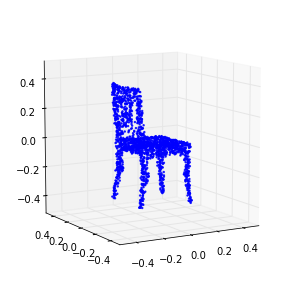

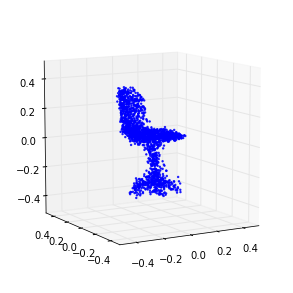

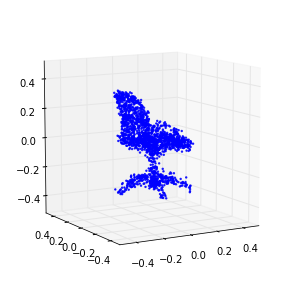

931 (-0.0085320971768211434, -1.3057638649587278)
932 (-0.091092120207570224, -0.29223958016545687)
933 (-0.0046816160557446654, 0.029997852389459258)
934 (0.11764943705940688, 0.2916629794571135)
935 (0.047771904272613699, -0.29647614006642942)
936 (-0.11842779283998189, -1.5652186848499157)
937 (-0.051912250073143727, -1.3445629013909235)
938 (0.064982610678783165, -1.1327445308367412)
939 (0.12447109648750888, -0.67879479985546187)
940 (-0.10269335821546891, 0.68940458336362131)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-940 is not in all_model_checkpoint_paths. Manually adding it.


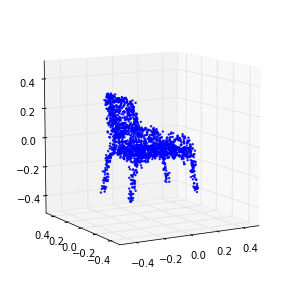

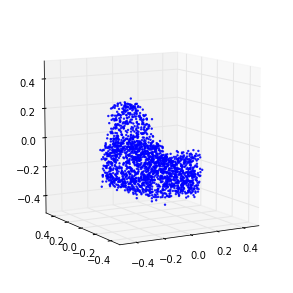

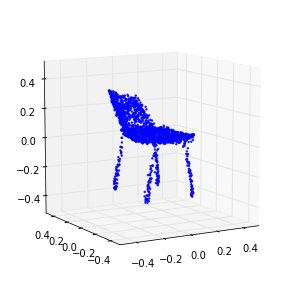

941 (-0.10229134951476697, -0.073528297659423619)
942 (0.0042492163953957735, -0.34337613635041098)
943 (0.11804639717770947, -1.1925501459174686)
944 (0.0097234829570408219, -1.5576744808091059)
945 (-0.098967957924361583, -0.18212236533010448)
946 (-0.0076228039546145333, -0.14299130436308957)
947 (0.077964190545457376, 0.52931272238492966)
948 (0.057309080384395743, -0.057797461610149453)
949 (-0.085071018227824452, -1.2473028964466519)
950 (-0.07566283924022206, -1.2854442596435547)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-950 is not in all_model_checkpoint_paths. Manually adding it.


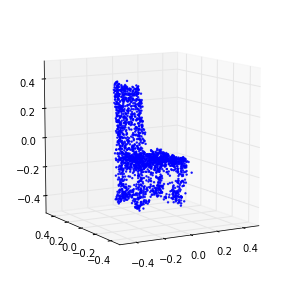

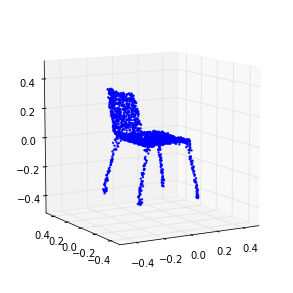

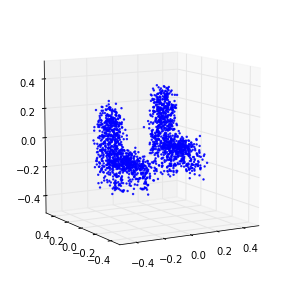

951 (0.082058202461512006, -0.94958995889734343)
952 (0.11275121777283925, -0.30336293674729486)
953 (-0.021972769057309185, 0.57543375370679073)
954 (-0.12534077873936406, 0.026458392816561239)
955 (-0.01971391593278558, -0.33456983155122511)
956 (0.084753802680858858, -0.67746650510364104)
957 (0.036300076157958418, -1.4144592814975314)
958 (-0.097913077418450956, -0.073083236261650364)
959 (-0.026033510805832015, 0.53996965178736933)
960 (0.093352308138101192, 0.77753675729036331)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-960 is not in all_model_checkpoint_paths. Manually adding it.


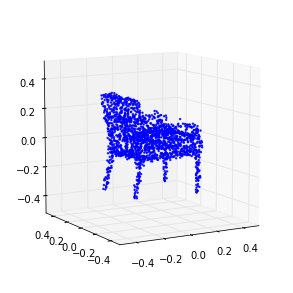

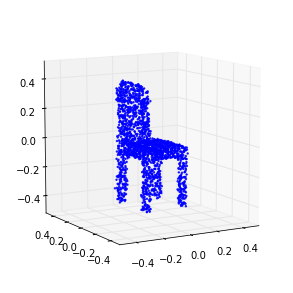

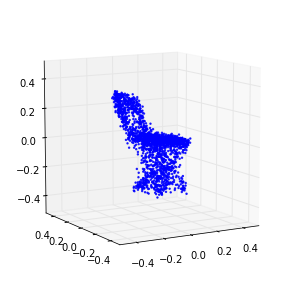

961 (0.078133298911982119, -0.19262714104519951)
962 (-0.10364584799993921, -1.1355518676616527)
963 (-0.10680783818027488, -1.0577296195206818)
964 (0.032347449439543263, -1.2511266028439556)
965 (0.16095882310635515, -0.6924003075670313)
966 (-0.0055928540174607876, 0.78055351862200983)
967 (-0.16529068166597022, 0.46390410705848978)
968 (-0.039106362016388667, 0.02136370857004766)
969 (0.10398657602016573, 0.0090249202869556577)
970 (0.15906910096053725, -1.3433212339878082)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-970 is not in all_model_checkpoint_paths. Manually adding it.


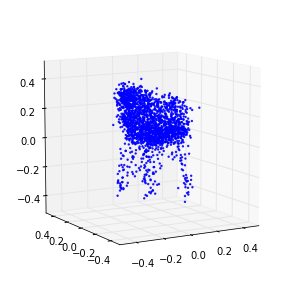

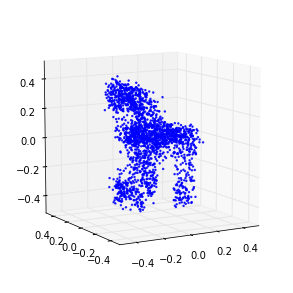

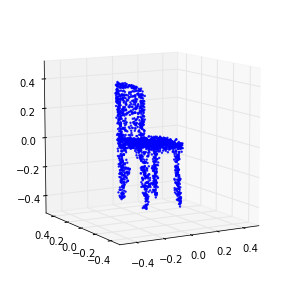

971 (-0.10751541139626944, -0.78683623892289623)
972 (-0.12486645285454061, 0.2935020233745928)
973 (0.018238752901002214, 0.62165499506173305)
974 (0.093400458612099849, 0.4981578533296232)
975 (0.031315301551862997, -0.25144667468137211)
976 (-0.10667722545288227, -1.1833240102838587)
977 (-0.038121212053078189, -0.99971774993119411)
978 (0.067793614955412015, -0.83951750618440135)
979 (0.11733042732984932, 0.23001994151208136)
980 (-0.031380486943655542, 0.89087566402223373)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-980 is not in all_model_checkpoint_paths. Manually adding it.


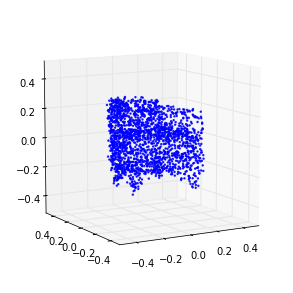

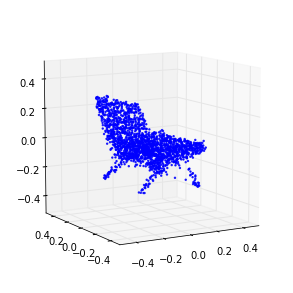

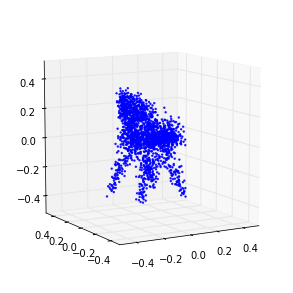

981 (-0.13442447300034541, -0.11738519032520277)
982 (-0.021374333746455334, -0.6213373900563629)
983 (0.094072232078071, -0.86589828381935752)
984 (0.11737389517603097, -1.5512690588280007)
985 (-0.097555174202554759, 0.46372696370990191)
986 (-0.064733498433121928, 1.1192444540836193)
987 (0.025499354854778007, 0.79383202449039181)
988 (0.11249978900369671, 0.36091152088785611)
989 (0.023519550332868542, -0.78960227262642646)
990 (-0.090739517010472434, -1.384892671196549)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-990 is not in all_model_checkpoint_paths. Manually adding it.


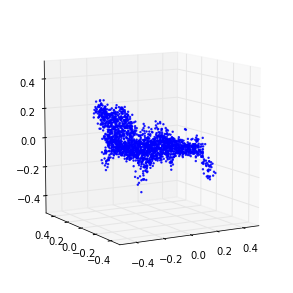

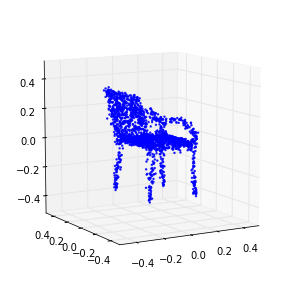

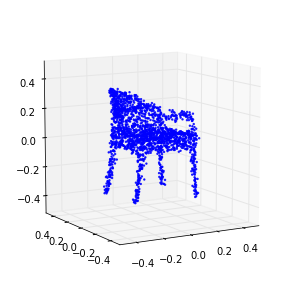

991 (-0.051610230002552271, -0.65446761057332714)
992 (0.059676409733516199, -0.29961714341684625)
993 (0.10705285019896649, 0.1637681888209449)
994 (-0.0546063839285462, 0.8120061131539168)
995 (-0.085309853660011731, -0.40252085085268374)
996 (-0.019159812345686887, -1.0806014272901747)
997 (0.10606254893872473, -1.5221098528967962)
998 (0.042015657987859514, -0.60233614097038901)
999 (-0.12087014438239513, 1.1805815078594066)
1000 (-0.044840308313292485, 1.3406393527984619)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-1000 is not in all_model_checkpoint_paths. Manually adding it.


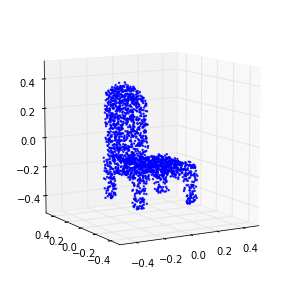

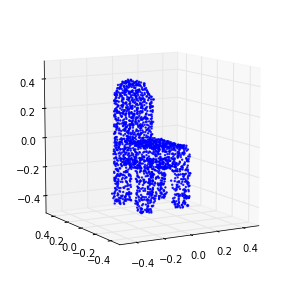

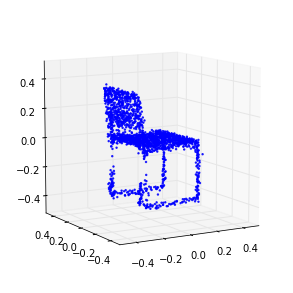

1001 (0.091633718833327299, 1.0086156764516123)
1002 (0.12513597080553018, 0.13393403051628006)
1003 (-0.064546567194715701, -1.3339737962793421)
1004 (-0.11911168893868172, -1.1548103094100952)
1005 (-0.023561253798780619, -0.43619293140040505)
1006 (0.070498338790127527, 0.11229065709092)
1007 (0.037967347001863848, 1.5039822746206213)
1008 (-0.088552727564065542, 0.45639432318232676)
1009 (-0.051351852687420665, -0.94433434638712144)
1010 (0.04096718569872556, -1.579848673608568)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-1010 is not in all_model_checkpoint_paths. Manually adding it.


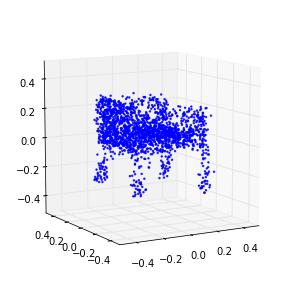

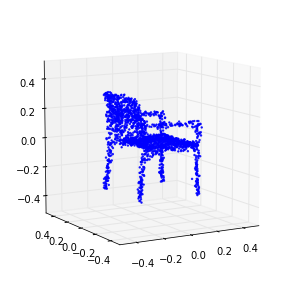

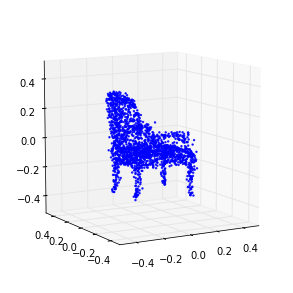

1011 (0.11517412330679319, -1.7368868158923254)
1012 (-0.072221180844914024, 0.620483982756182)
1013 (-0.077467955483330617, 1.7525733665183738)
1014 (0.0051200261960426966, 1.6763330962922838)
1015 (0.078377975357903376, 0.19985854404943962)
1016 (0.036177248942355314, -1.427857052396845)
1017 (-0.090301709035756406, -1.3751518660121493)
1018 (-0.042596876207325191, -0.51870933878752923)
1019 (0.039735798979247061, 0.87312994041928538)
1020 (0.037636054565923081, 1.5645898293565821)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-1020 is not in all_model_checkpoint_paths. Manually adding it.


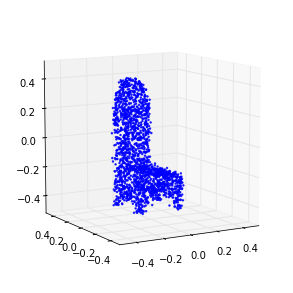

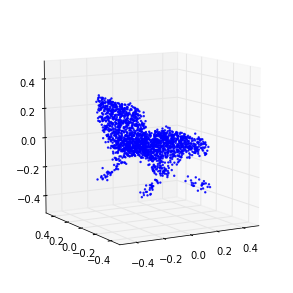

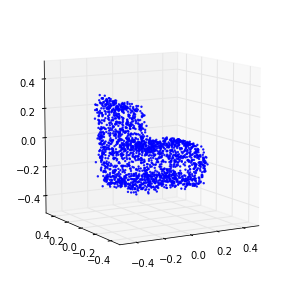

1021 (-0.022696705831697694, 0.22702906943029827)
1022 (-0.041613831626320326, -1.1567925479676988)
1023 (0.030120694023315554, -2.0074709433096425)
1024 (0.057100297745179246, -1.567057751946979)
1025 (-0.02084608404310765, 0.57133172976749913)
1026 (-0.035789306316938663, 1.7316829672566167)
1027 (0.026850981589544704, 1.3003043333689372)
1028 (0.059527813429357826, -0.30387781243081446)
1029 (-0.035707760526350253, -1.8736100594202678)
1030 (-0.05403491753256983, -1.0485876290886491)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-1030 is not in all_model_checkpoint_paths. Manually adding it.


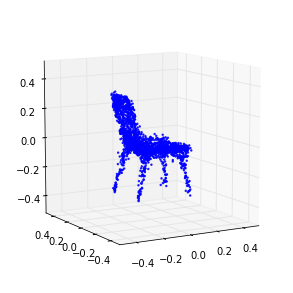

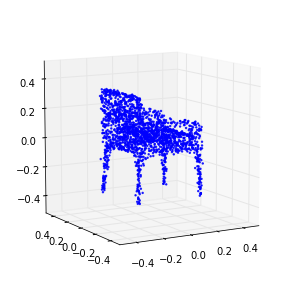

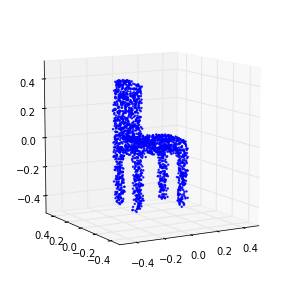

1031 (0.023661296876768271, -0.14243158215173968)
1032 (0.08128680358468382, 1.0351969090600808)
1033 (0.029303078443087913, 1.4528456043314051)
1034 (-0.069720570970740581, -0.27765746400864039)
1035 (-0.020809203607064706, -1.6295503510369196)
1036 (0.033222038188466321, -1.6959031334629766)
1037 (0.067850299483096163, -0.96482481614307125)
1038 (-0.044021976525308912, 1.2593254645665486)
1039 (-0.056108039362287081, 1.3497750979882699)
1040 (0.053847722378042008, 0.69408232359974475)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-1040 is not in all_model_checkpoint_paths. Manually adding it.


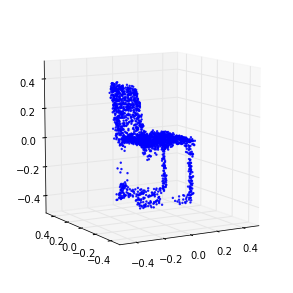

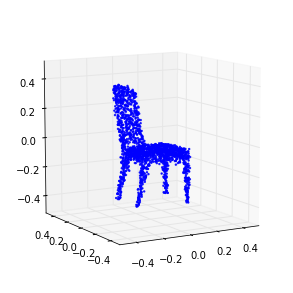

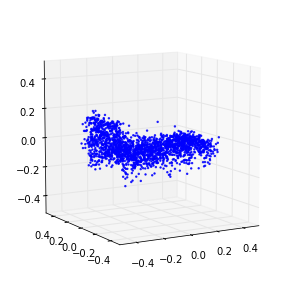

1041 (0.13064140981684128, 0.035864382430359172)
1042 (-0.012105428220497236, -1.7983313975510773)
1043 (-0.14876404579866814, -0.88534707934768109)
1044 (-0.064709593652299155, -0.13981367647647858)
1045 (0.086527548475122007, 0.15260508746184684)
1046 (0.17860014944992683, 0.68721101571012422)
1047 (0.02100386487113105, 1.3122666434005454)
1048 (-0.19421453031676786, -0.74262279106511009)
1049 (-0.090708459851642456, -1.1216580558706213)
1050 (0.062031673888365425, -1.4082272439091295)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-1050 is not in all_model_checkpoint_paths. Manually adding it.


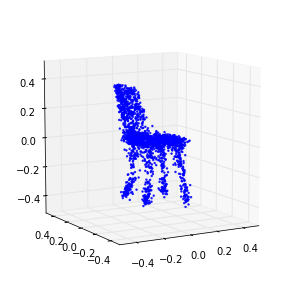

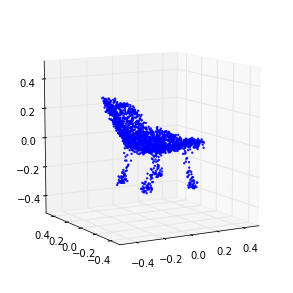

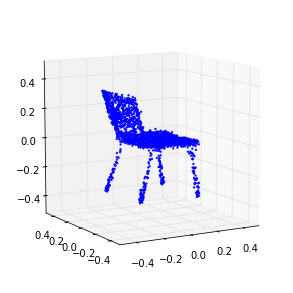

1051 (0.22228963438559463, -2.2675816482967801)
1052 (0.058697862674792607, -0.95287578194229694)
1053 (-0.23699587164101776, 2.036209057878565)
1054 (-0.087433155570869087, 1.7300225893656414)
1055 (0.059505319919575146, 1.1715760363472834)
1056 (0.17739970101802438, 1.7008153884499162)
1057 (0.055933352614994401, -0.057177859323996084)
1058 (-0.19032979846276618, -2.4353651470608182)
1059 (-0.068978170402072089, -2.0436454437397145)
1060 (0.044389685802161696, -1.4819747386155304)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-1060 is not in all_model_checkpoint_paths. Manually adding it.


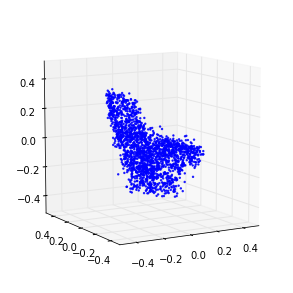

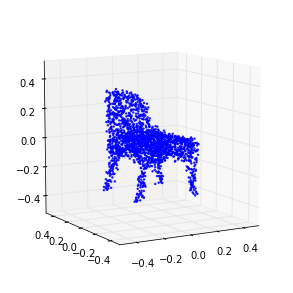

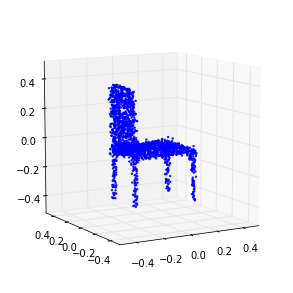

1061 (0.083885255193820701, -0.31742715173297459)
1062 (-0.009380725660809764, 1.2862913917612147)
1063 (-0.076258003822079409, 0.35472209254900616)
1064 (-0.026222737174895074, -0.46441918542539634)
1065 (0.032338021295490085, -1.20341866546207)
1066 (0.093327070855432084, -2.1492352662263094)
1067 (0.0066396132939391663, -0.47447808521489304)
1068 (-0.070776987227576749, 0.93888219639107029)
1069 (0.0060796783202224309, 1.0735549772227253)
1070 (0.088718568237015488, 0.66298521392875243)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-1070 is not in all_model_checkpoint_paths. Manually adding it.


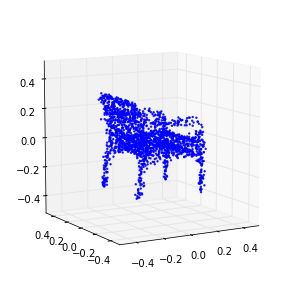

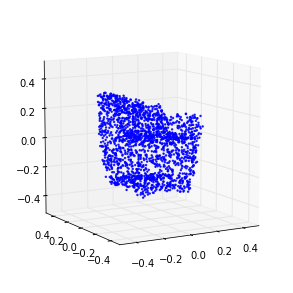

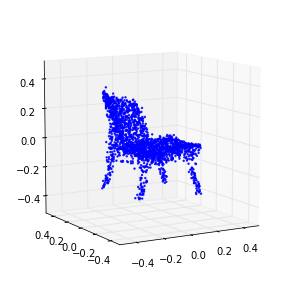

1071 (0.065597134207685787, -0.841623741167563)
1072 (-0.11697105446623432, -1.6595513423283894)
1073 (-0.073831673794322539, -1.0750881058198434)
1074 (0.031400811568730411, -0.77559484320658223)
1075 (0.093491422184915449, 0.076901494766826978)
1076 (-0.019400759886398361, 1.1573076491002683)
1077 (-0.075705301878904854, -0.21418765863334691)
1078 (-0.035879442889105391, -1.269551776073597)
1079 (0.047281779531665423, -1.7948905980145489)
1080 (0.050033515222646575, -1.3802700108951993)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-1080 is not in all_model_checkpoint_paths. Manually adding it.


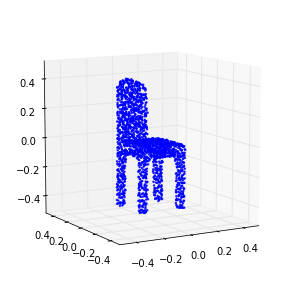

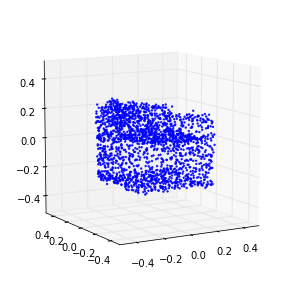

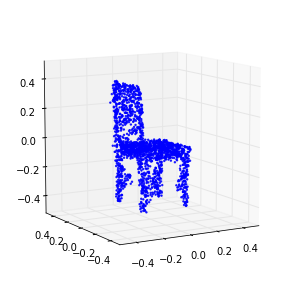

1081 (-0.034923598035756086, 0.51304924798508489)
1082 (-0.042353575862944123, 1.4177243268048321)
1083 (0.028913749047313576, 0.93675375619420298)
1084 (0.065201470117878024, -0.28584193341709951)
1085 (-0.021497105889850193, -1.6160872468241938)
1086 (-0.047614434251078856, -1.5126379220573991)
1087 (-0.0097794996712494784, -0.29512622621324325)
1088 (0.051033219964139995, 0.63818611204624176)
1089 (0.033769123576995401, 1.3383240479010123)
1090 (-0.04256172169827753, -0.12017147988080978)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-1090 is not in all_model_checkpoint_paths. Manually adding it.


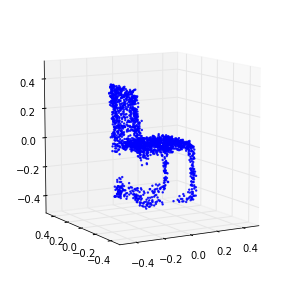

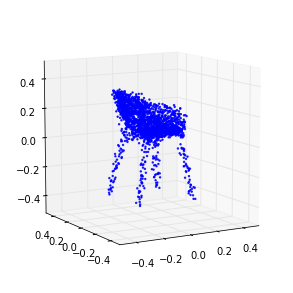

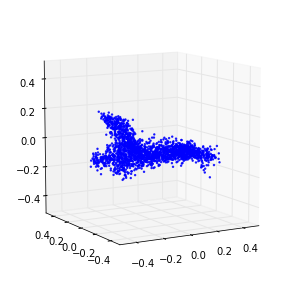

1091 (-0.073529356480058691, -1.454679133715453)
1092 (0.033304480647806216, -2.0554105352472374)
1093 (0.045291782984579053, -1.4233825866270948)
1094 (-0.037378661244831704, 0.85318841371271348)
1095 (-0.050716224685311319, 1.3157097895940144)
1096 (0.0084159563468010345, 0.94536818860581628)
1097 (0.082675491280301855, -0.47022174429838304)
1098 (0.0044498153030872343, -1.6799016749417339)
1099 (-0.074497733941232713, -0.99318991325519701)
1100 (-0.016511173704984013, 0.17440923717286852)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-1100 is not in all_model_checkpoint_paths. Manually adding it.


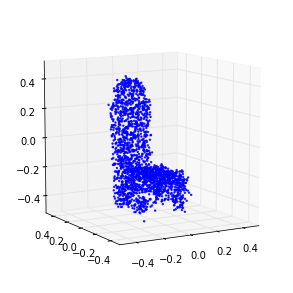

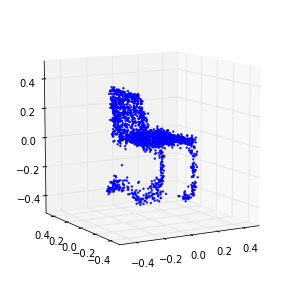

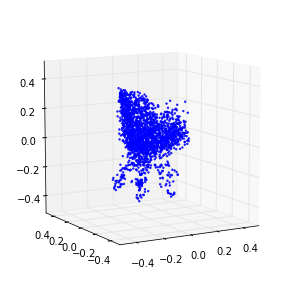

1101 (0.029843627316532312, 0.8203152500920825)
1102 (0.015961654774016804, 1.3409292499224346)
1103 (-0.025208665978991324, -0.33054004692369038)
1104 (-0.057951086511214576, -1.5952932834625244)
1105 (0.022250629319912858, -1.557508150736491)
1106 (0.053861353946504771, -0.44030794584088856)
1107 (-0.021319109104849673, 1.4737293355994754)
1108 (-0.049059522565868166, 1.2232061900474407)
1109 (0.018876400638233731, -0.13037210827072462)
1110 (0.030370828064365519, -1.5267845083166052)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-1110 is not in all_model_checkpoint_paths. Manually adding it.


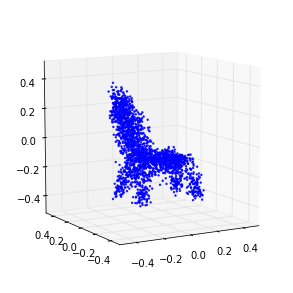

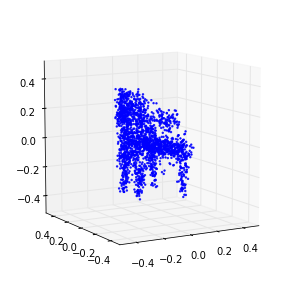

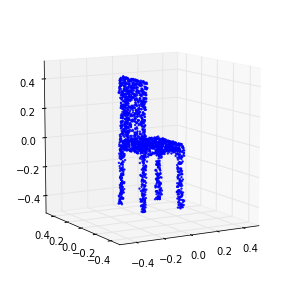

1111 (-0.017431401257851611, -1.2553090607678448)
1112 (-0.035130853744016755, -0.27031285253663856)
1113 (-0.013752156351175573, 1.3104923861446205)
1114 (0.038046018006625, 1.635074986351861)
1115 (0.019006316832922122, -0.23597191439734566)
1116 (-0.052922212594637162, -1.6432287604720504)
1117 (-0.057796495566489518, -1.3421682384279039)
1118 (0.03169945444635771, -0.82511581342529372)
1119 (0.074657181408946158, 1.1514523967548653)
1120 (-0.057575164873290945, 0.9914636213194441)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-1120 is not in all_model_checkpoint_paths. Manually adding it.


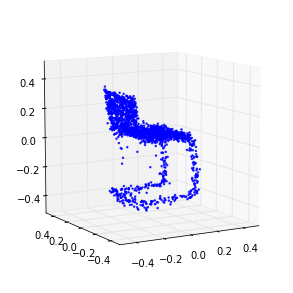

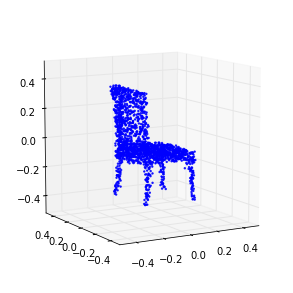

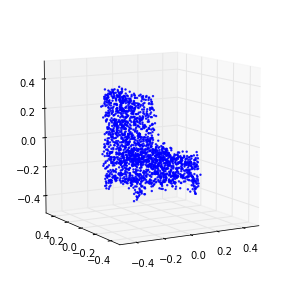

1121 (-0.048678511636400662, -0.24514839422233678)
1122 (0.03057218618966915, -1.0937142140335507)
1123 (0.060293359399117806, -2.066316498650445)
1124 (-0.041928632488405261, -0.013244810134724335)
1125 (-0.078950002948167147, 1.1690941519207425)
1126 (0.0294871484791791, 1.1930013155495678)
1127 (0.053869719410108194, 0.59937542180220282)
1128 (0.024646449420187209, -1.536260916127099)
1129 (-0.098994957862628824, -1.2521117594507005)
1130 (-0.042225562794892875, -1.023554473011582)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-1130 is not in all_model_checkpoint_paths. Manually adding it.


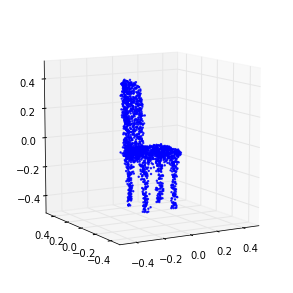

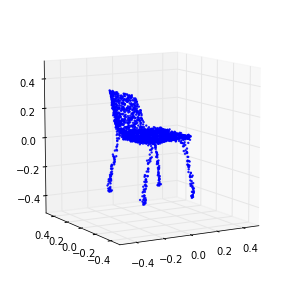

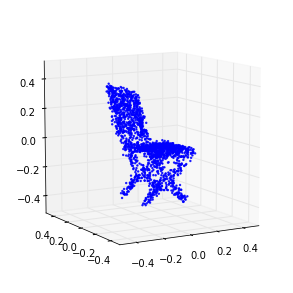

1131 (0.040722797452299682, 0.027474626070923276)
1132 (0.028650113954036324, 1.4380630585882399)
1133 (-0.054870188160351031, -0.010693947612135499)
1134 (-0.066794138929496205, -1.2460064623090956)
1135 (0.0085733875701272926, -1.8375408252080281)
1136 (0.030212584800190397, -1.2847138497012633)
1137 (-0.05010967249119723, 0.78352685383072607)
1138 (-0.031733075612121159, 1.4711530517648768)
1139 (0.026288606060875786, 0.25621281812588376)
1140 (0.008559093789921866, -0.93873115766931459)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-1140 is not in all_model_checkpoint_paths. Manually adding it.


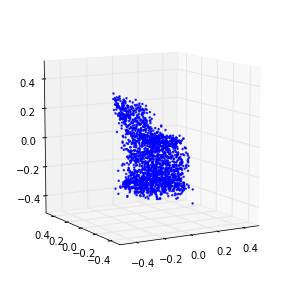

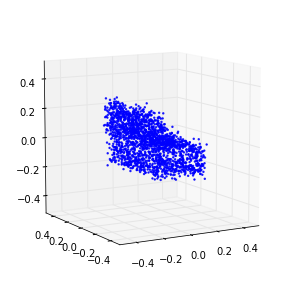

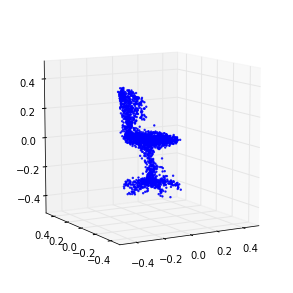

1141 (-0.030123715351025263, -1.8356094051290441)
1142 (-0.0070042358400921028, -0.72671364220204182)
1143 (0.052768912311229439, 0.36763597265989695)
1144 (0.073805449068270343, 1.293410767007757)
1145 (-0.097450546713338956, 0.41223680641916061)
1146 (-0.090127735288330804, -1.0339422446710091)
1147 (0.012660964133424891, -1.7208126143172935)
1148 (0.077060662506631128, -1.8969877671312403)
1149 (-0.0096951144368008328, 0.21513569906905847)
1150 (-0.12148720739340341, 1.6313055974465829)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-1150 is not in all_model_checkpoint_paths. Manually adding it.


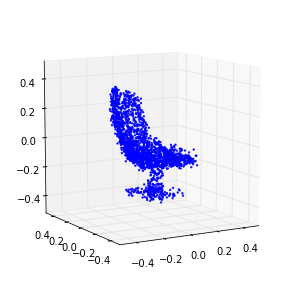

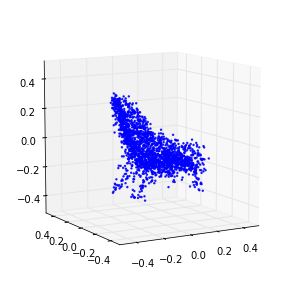

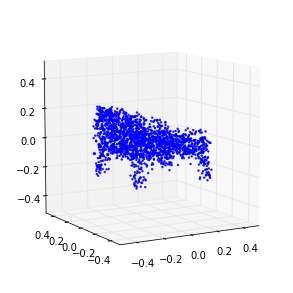

1151 (-0.016269058661742344, 1.1799865022853568)
1152 (0.10014086856196323, 0.67528202288128714)
1153 (0.021274844281099461, -1.489627136124505)
1154 (-0.10158253922644589, -1.1789407266510858)
1155 (-0.044439651634268183, -0.49103660995347631)
1156 (0.063328861100254236, 0.59505367141079024)
1157 (0.10712999395543227, 0.76193644879040889)
1158 (-0.041553563459051979, 1.0310387909412384)
1159 (-0.13093543390708942, -1.2680334481928084)
1160 (-0.051603298979224985, -1.9173350863986545)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-1160 is not in all_model_checkpoint_paths. Manually adding it.


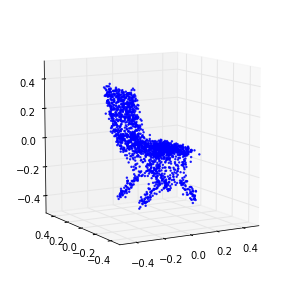

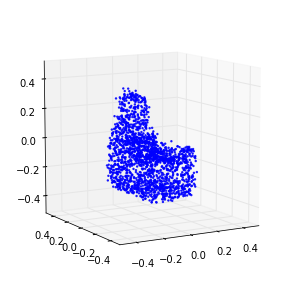

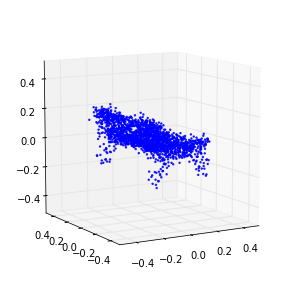

1161 (0.10418551837749503, -2.1118949828324496)
1162 (0.076489139065422387, -1.2817045811701704)
1163 (-0.12233926059195289, 1.6123226439511333)
1164 (-0.075526234117784988, 1.5717587603463068)
1165 (0.037359114408631017, 1.0892337876613494)
1166 (0.11883436086484128, 0.029304268528465873)
1167 (-0.043026937896178827, -1.3166047224292048)
1168 (-0.14537979865239725, -0.77412838130085559)
1169 (-0.048169773799815664, 0.12557914928981551)
1170 (0.10475924204069155, 0.55187888967770116)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-1170 is not in all_model_checkpoint_paths. Manually adding it.


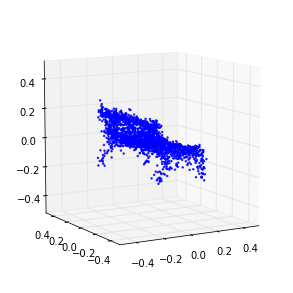

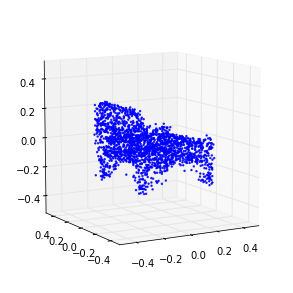

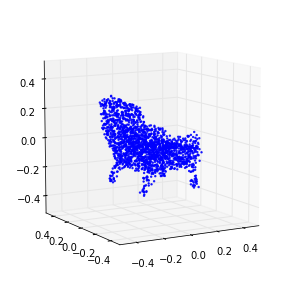

1171 (0.19495377634410505, 2.2419927473421448)
1172 (-0.15871380933181004, -0.34646496645830294)
1173 (-0.14354257122785957, -1.0997777448760138)
1174 (-0.019822871491864874, -1.5418019868709423)
1175 (0.16695496895936904, -2.6367395674740828)
1176 (0.088731516697616489, -0.23355232896628203)
1177 (-0.2025288430042565, 2.0173405938678317)
1178 (-0.087156497480140788, 1.7487778354574133)
1179 (0.082853686071380425, 2.1575569797445229)
1180 (0.12979983494237618, -1.4347863241478249)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-1180 is not in all_model_checkpoint_paths. Manually adding it.


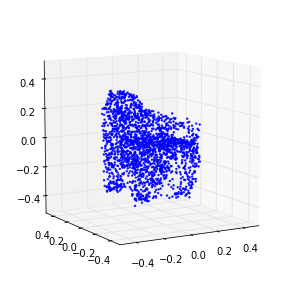

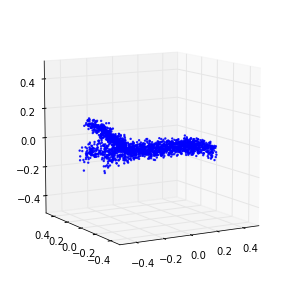

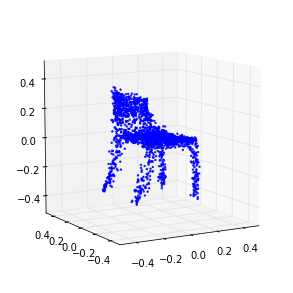

1181 (-0.15522125648265636, -0.56642360778318512)
1182 (-0.064770980876077106, -0.079762072750815635)
1183 (0.059255750746362738, -2.4167544378174677)
1184 (0.12936546343068281, -2.8747934721134327)
1185 (-0.1513197592701073, 2.2520368496576944)
1186 (-0.039928431194965489, 2.5556504373197204)
1187 (0.13141505893457819, 0.9170875049851559)
1188 (0.087127133962456832, -2.3269077009624906)
1189 (-0.16888375156041649, -0.58391500002256147)
1190 (-0.042385607166215776, -0.43704684209768419)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-1190 is not in all_model_checkpoint_paths. Manually adding it.


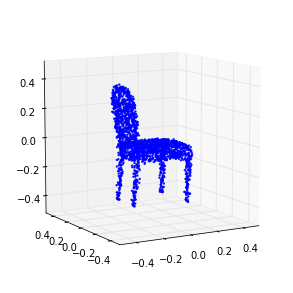

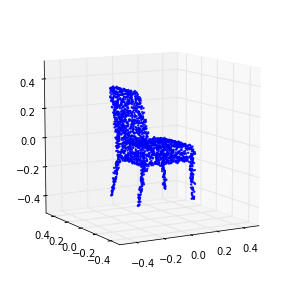

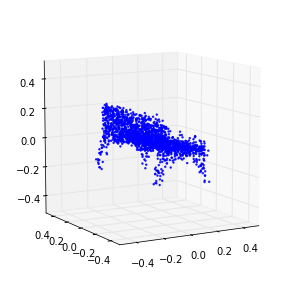

1191 (0.058097406649203209, -2.1314349792621754)
1192 (0.15196935401677533, -0.73066001371652989)
1193 (-0.071886261607761737, 2.0106755141858703)
1194 (-0.14309278647932741, -0.17700136956517343)
1195 (-0.027538008260092249, -0.4161066290129114)
1196 (0.13786068638372753, -0.43803083275755245)
1197 (0.24137702356610033, -2.3824059742468373)
1198 (-0.16717352102752084, -0.48264743553267586)
1199 (-0.1984721946840485, 0.97484751100893374)
1200 (-0.0055364313535392288, -0.032500322908163071)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-1200 is not in all_model_checkpoint_paths. Manually adding it.


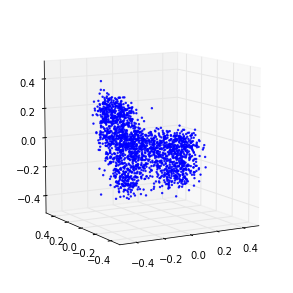

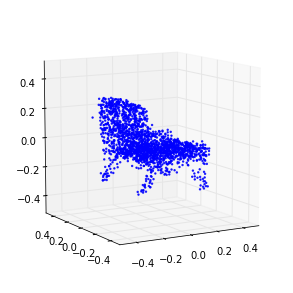

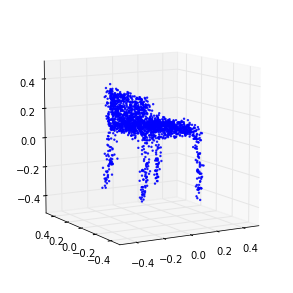

1201 (0.11610228265118268, -1.9311492398933128)
1202 (0.17169320845493563, -3.5155975200511791)
1203 (-0.20777949514212432, 0.98190304636955261)
1204 (-0.091998688345430069, 2.1832518930788392)
1205 (0.047966259814522884, 1.6242347298948854)
1206 (0.034707176685333255, -2.0380248427391052)
1207 (-0.033531150684036594, -2.5958421848438404)
1208 (-0.078565128913356194, 0.6889279341256177)
1209 (0.10994886315117279, 0.88863501587399729)
1210 (0.0092760564966334232, -2.5149411713635481)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-1210 is not in all_model_checkpoint_paths. Manually adding it.


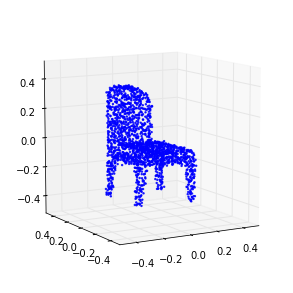

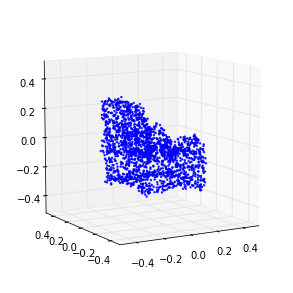

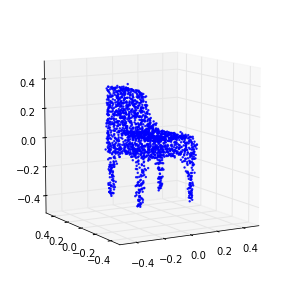

1211 (-0.086526405895818712, -1.2553424669636621)
1212 (-0.052420007830692665, 1.3266802452228688)
1213 (0.10403714909528693, 0.82942177244910487)
1214 (0.053407918372088012, -2.1922504140271082)
1215 (-0.11980529628280136, -0.67498534255557585)
1216 (-0.069884324097936906, 0.80305672906063219)
1217 (0.057921568193921337, -0.54886625113862531)
1218 (0.10634049358950169, -3.1801075582151062)
1219 (-0.088372056448349251, -0.70299296191445104)
1220 (-0.1169431606048925, 2.5666274759504528)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-1220 is not in all_model_checkpoint_paths. Manually adding it.


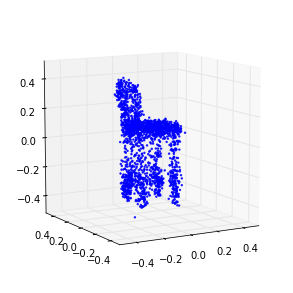

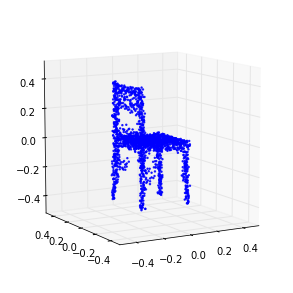

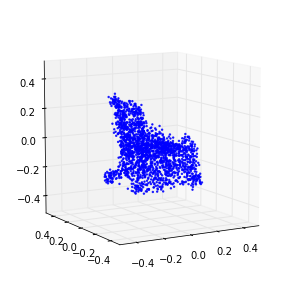

1221 (0.056044045742601155, 1.9546306972150449)
1222 (0.085276137720103617, -1.595179253982173)
1223 (-0.0058283510514431525, -2.4319995299533561)
1224 (-0.12996583744814549, 1.124802389630565)
1225 (0.045990644088359893, 1.4088488000410575)
1226 (0.21558233914482924, 1.3561572498745389)
1227 (0.00020779939023432908, -1.5487457326164953)
1228 (-0.22813795751857538, -1.5210081559640389)
1229 (-0.070819602244430124, -0.31414933930392619)
1230 (0.060669037577247731, -0.33168390696799316)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-1230 is not in all_model_checkpoint_paths. Manually adding it.


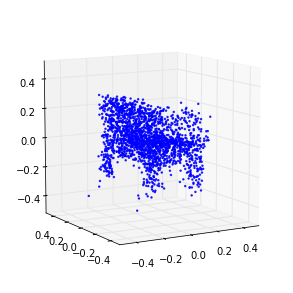

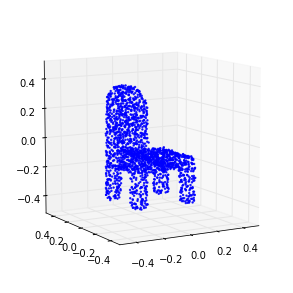

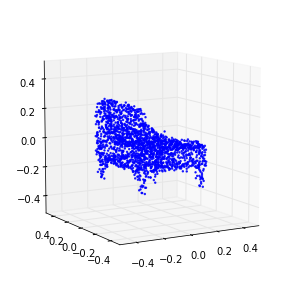

1231 (0.16217845010881624, 1.1978661227557394)
1232 (-0.097219933165858183, 1.6767105954112831)
1233 (-0.14672664690210863, -1.6700024958010073)
1234 (0.0209230395068449, -1.8530663737544306)
1235 (0.095397751343746978, 0.81668561807385198)
1236 (0.023558578867879178, 2.7473983676345259)
1237 (-0.13796798975931274, -0.99625279726805516)
1238 (0.025114846063984765, -1.9729221794340346)
1239 (0.19998117062539139, -2.0657537866521767)
1240 (0.017751949318443185, 1.4477755663295586)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-1240 is not in all_model_checkpoint_paths. Manually adding it.


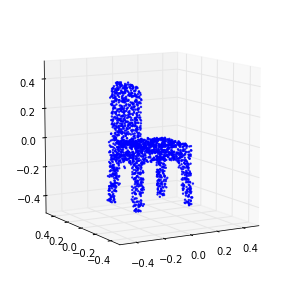

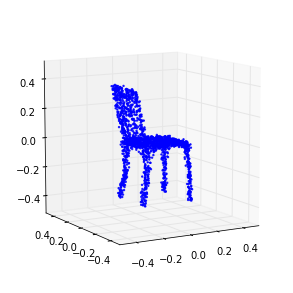

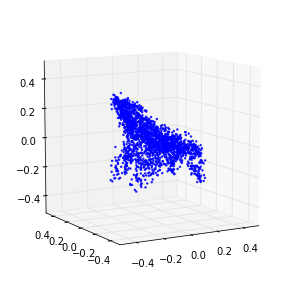

1241 (-0.20125637758799172, 2.3286425714139587)
1242 (-0.048625732837589801, 0.74719355738273374)
1243 (0.092847224573294321, -0.60027078511538334)
1244 (0.082323208182222316, -3.0295535723368325)
1245 (-0.13220542093256005, 0.68529434129595757)
1246 (-0.10097546124899828, 2.3258219295077853)
1247 (0.086165179426057475, 2.0054312679502697)
1248 (0.16212977573137594, 0.25782861905517401)
1249 (-0.11356785412946785, -2.5931394983220986)
1250 (-0.15528319047901917, -0.27699251969655353)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-1250 is not in all_model_checkpoint_paths. Manually adding it.


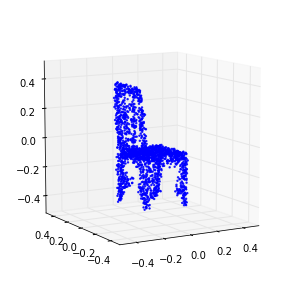

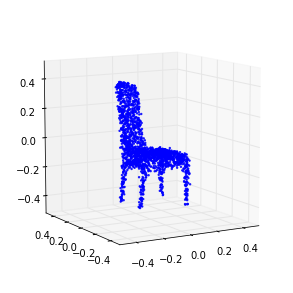

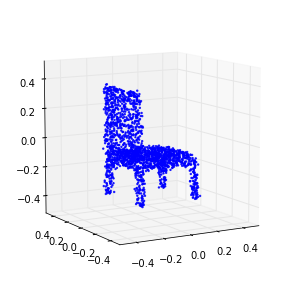

1251 (-0.0061286371373743924, -0.73582229901243135)
1252 (0.12186108716522102, -0.42824366150630844)
1253 (0.17319787548234064, 1.3561899777915742)
1254 (-0.2166718318230576, 0.089924734223771979)
1255 (-0.14023420921768304, -1.210705041885376)
1256 (0.0087195190635544276, -0.45265421423095242)
1257 (0.094335643057194024, 2.1223019604329711)
1258 (0.052280602024661171, 1.6507703282490924)
1259 (-0.13453620879876393, -2.3737683848098472)
1260 (0.012604705327086978, -2.9053584822901972)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-1260 is not in all_model_checkpoint_paths. Manually adding it.


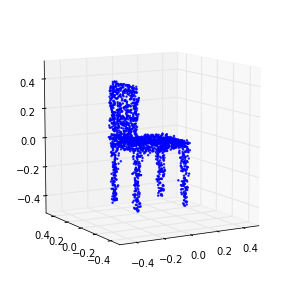

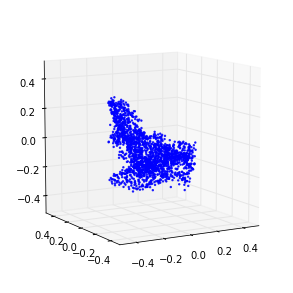

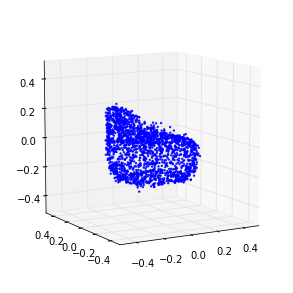

1261 (0.18994308621795089, -2.8204502794477673)
1262 (-0.063809017305848773, 1.6488667327772688)
1263 (-0.1676712564503153, 2.3614558378855386)
1264 (-0.017731478644741908, 0.79140556134559492)
1265 (0.10818120849629244, -1.2656952617345032)
1266 (0.14263488709650657, -1.458379645038534)
1267 (-0.17760157245728705, 2.0497724524250738)
1268 (-0.038473595596022078, 1.0815927115855393)
1269 (0.04670983723330277, -1.2149570729169581)
1270 (0.050984372681489698, -2.95782181068703)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-1270 is not in all_model_checkpoint_paths. Manually adding it.


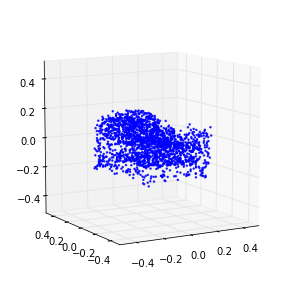

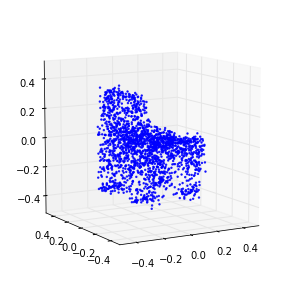

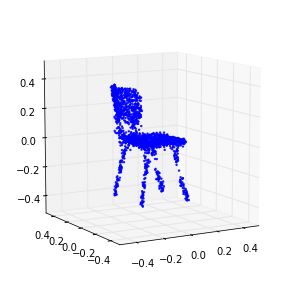

1271 (-0.094712898148982608, 1.2919409644824487)
1272 (-0.006020725646090728, 2.8698874314626059)
1273 (0.15630807534757035, 2.6688749701888472)
1274 (0.027923000576319516, -0.43067314503369508)
1275 (-0.16367100604154444, -2.9421603149837918)
1276 (-0.0052533208116613056, -2.7924240695105658)
1277 (0.15962276732962993, -2.1924627621968589)
1278 (-0.070978374889603374, 2.0872839082170418)
1279 (-0.11581503173543348, 2.1864538899174444)
1280 (0.0085037763540943469, 0.69603281523342486)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-1280 is not in all_model_checkpoint_paths. Manually adding it.


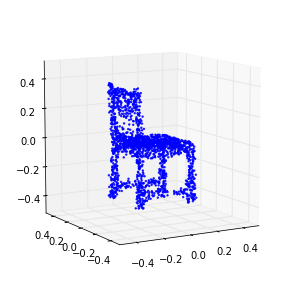

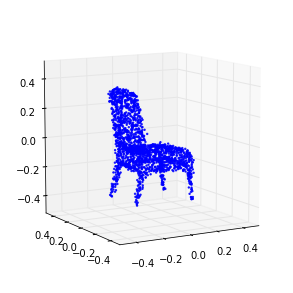

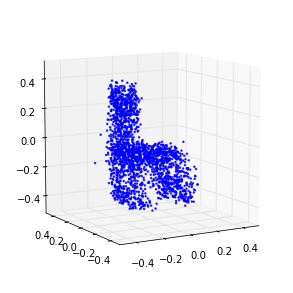

1281 (0.053368142167865125, -2.5980993994960078)
1282 (0.060815833964281613, -2.5321251330552279)
1283 (-0.11261809339263924, 1.6035739856737632)
1284 (-0.03944903251335577, 2.6994170965971769)
1285 (0.11223945406575998, 2.2420268411989563)
1286 (0.23022715786678924, 1.4259847093511511)
1287 (-0.1259816185053852, -2.1584955503543219)
1288 (-0.16705088752011457, -2.3501587002365678)
1289 (-0.020509885458482636, -1.897878814626623)
1290 (0.13938613862351135, -0.99262014638494567)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-1290 is not in all_model_checkpoint_paths. Manually adding it.


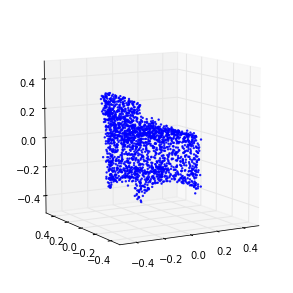

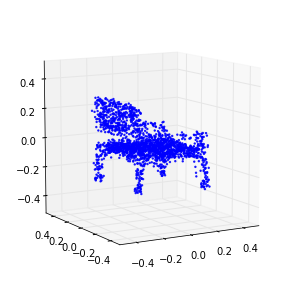

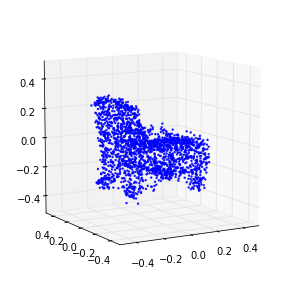

1291 (-0.028457896804644001, 2.4432111227953874)
1292 (-0.0085077311567686217, 2.4507309110076338)
1293 (0.057663753049241172, 1.0228803028111104)
1294 (-0.054764483061929541, -2.3377653007154113)
1295 (0.039406998386537585, -2.7278975292488381)
1296 (0.15506974635300813, -1.9147544889538377)
1297 (-0.10228056762781408, 2.21236491644824)
1298 (-0.057345353642961491, 2.4894228069870561)
1299 (0.098099711275211082, 2.0695572605839483)
1300 (0.20905598537237555, 1.518262995613946)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-1300 is not in all_model_checkpoint_paths. Manually adding it.


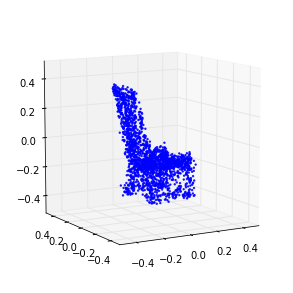

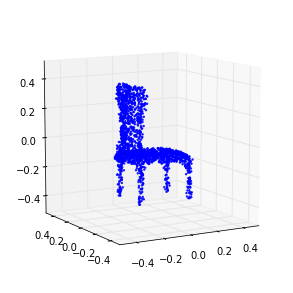

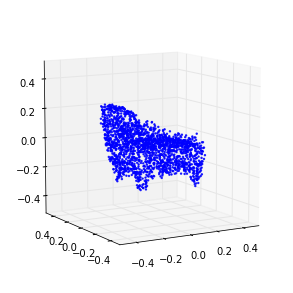

1301 (-0.053105257879252785, -1.6170275158904217)
1302 (-0.16573662080422596, -2.6763213210635715)
1303 (-0.012957971567219053, -2.4244483047061496)
1304 (0.10157275287503445, -1.9487127639629223)
1305 (0.18087046339556023, -0.061467685633235507)
1306 (-0.15591277809882606, 2.9998835545999034)
1307 (-0.024839926511049271, 2.6994873770961054)
1308 (0.093222551696278425, 2.2708448657283076)
1309 (0.18720109749723363, 1.3742205147390012)
1310 (-0.074361512561639156, -1.6387142141660054)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-1310 is not in all_model_checkpoint_paths. Manually adding it.


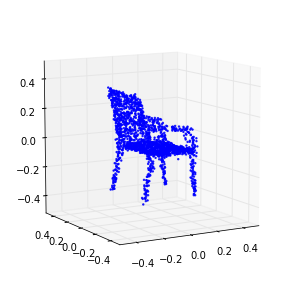

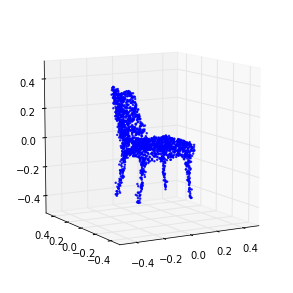

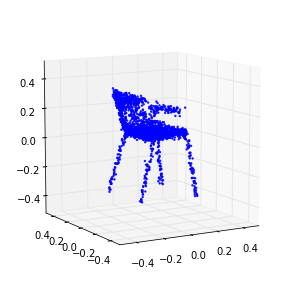

1311 (-0.10053724281627822, -1.6261112071849682)
1312 (0.013093456239612014, -0.44419119686440184)
1313 (0.065093967925619195, 2.0213292119679629)
1314 (0.050680266472476497, 3.0895011425018311)
1315 (0.0047654794046172386, 0.87111890164238437)
1316 (-0.080360770791217132, -1.2809658425825614)
1317 (0.041811934306665702, -1.377034686229847)
1318 (0.25719447202842544, -2.0482136408487954)
1319 (0.18743042356714054, -1.6909924436498571)
1320 (-0.27858052947730932, 1.7911682349664193)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-1320 is not in all_model_checkpoint_paths. Manually adding it.


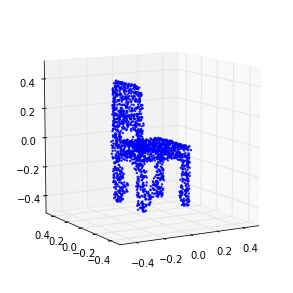

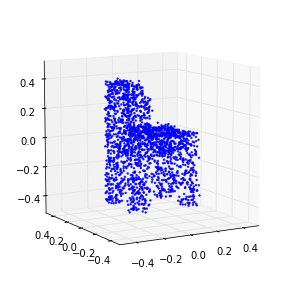

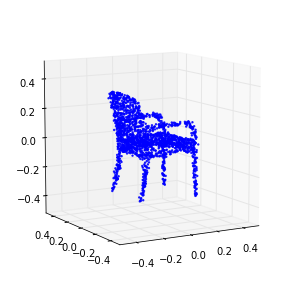

1321 (-0.11627361378460019, 1.7835540683181197)
1322 (0.037567969615122786, 1.5828174705858584)
1323 (0.193836229722257, 1.3037119485713817)
1324 (0.28624366632214299, 0.48640607656152163)
1325 (-0.13732001624173587, -2.4305172937887685)
1326 (-0.19589848510093158, -2.6292460317964905)
1327 (-0.073570672139801355, -2.5927151485725686)
1328 (0.091147866934813832, -2.6296107150890209)
1329 (0.20987519557691284, -2.5411322514216104)
1330 (-0.094495263474958915, 0.87815929673336168)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-1330 is not in all_model_checkpoint_paths. Manually adding it.


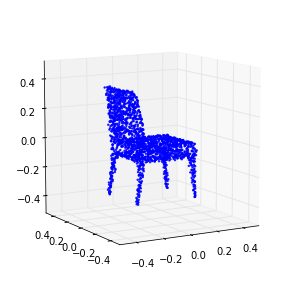

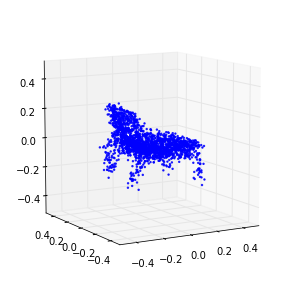

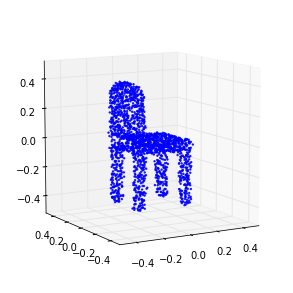

1331 (-0.11148675704305923, 1.3083607112919842)
1332 (0.023637498563362492, 0.96981823002850565)
1333 (0.12834910419252182, 0.72036776664080449)
1334 (0.099550841776309185, -0.27163241603584204)
1335 (-0.11613051844415841, -1.6845300727420383)
1336 (-0.02760055781238609, -1.090802925604361)
1337 (0.1337510981562513, -0.64319109695929066)
1338 (0.28672135000427562, -0.13335139056046805)
1339 (-0.041831577251906747, 1.9231580804895472)
1340 (-0.17457532347697352, 0.90572082996368408)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-1340 is not in all_model_checkpoint_paths. Manually adding it.


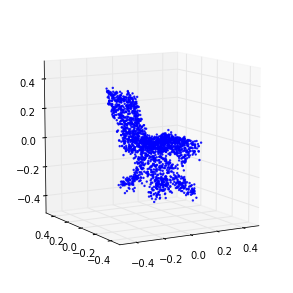

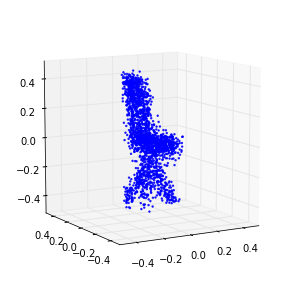

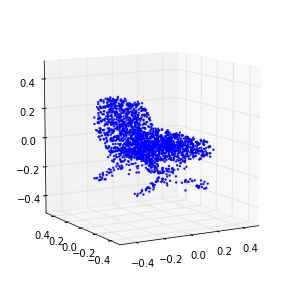

1341 (-0.065239245637699408, 0.30856900372438961)
1342 (0.094175836906113003, -0.84353053183467297)
1343 (0.13231766067997172, -1.9565571193341855)
1344 (-0.074648496715558899, 0.21465881831116146)
1345 (-0.13476967868153697, 1.8121548272945263)
1346 (0.056457476214402252, 1.7142279898678814)
1347 (0.15568396974768903, 1.7395300423657452)
1348 (0.037079800899933887, -0.03640825549761454)
1349 (-0.18432366846612205, -1.869348614304154)
1350 (-0.021128569212224748, -2.1187658795603999)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-1350 is not in all_model_checkpoint_paths. Manually adding it.


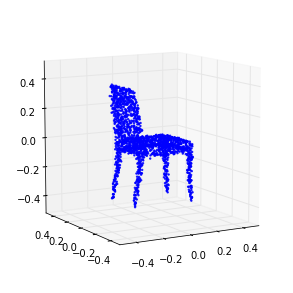

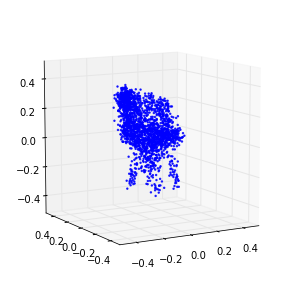

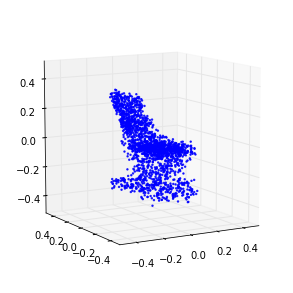

1351 (0.12979148023382381, -2.0525782108306885)
1352 (0.18683419264853002, -1.0479336943891313)
1353 (-0.17928206817143494, 1.6960708079514679)
1354 (-0.058880277378139674, 1.746025562286377)
1355 (0.088647916913032532, 1.5619318396956832)
1356 (0.20477004438914634, 1.0076689179296847)
1357 (0.022274769580474606, -1.3492868388140644)
1358 (-0.087448809509751979, -1.7984231313069661)
1359 (-0.049452438384846406, -0.88097673433798329)
1360 (0.046349952652774473, 0.2729540550046497)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-1360 is not in all_model_checkpoint_paths. Manually adding it.


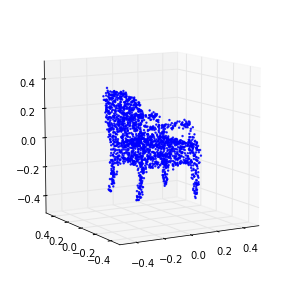

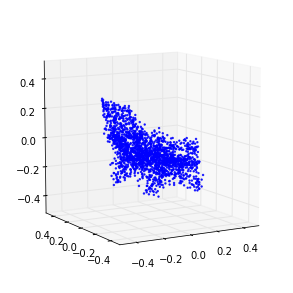

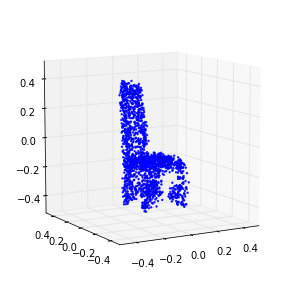

1361 (0.089377922564744944, 0.89122879505157471)
1362 (0.052302655908796521, 0.026986267693616724)
1363 (-0.13350057199735332, -0.63982772827148438)
1364 (-0.011990768903935398, -0.17962044367083796)
1365 (0.14110499378983621, 0.23859308673827737)
1366 (0.15203654316288454, 1.2621585241070501)
1367 (-0.19074949326200619, 0.2302752145462566)
1368 (-0.10510996885735679, -0.72971564862463212)
1369 (0.092454928704709921, -0.90558848888785748)
1370 (0.25549577006173357, -1.4900857960736309)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-1370 is not in all_model_checkpoint_paths. Manually adding it.


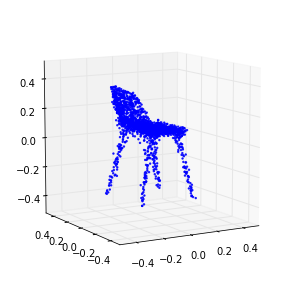

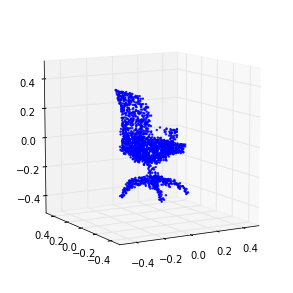

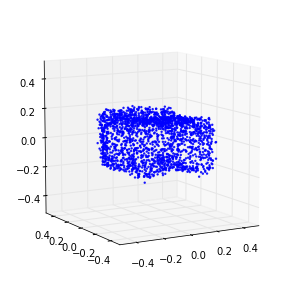

1371 (-0.040925703335691378, 0.69837377661908118)
1372 (-0.23841050685279899, 1.2055865702805695)
1373 (-0.099593687623187349, 0.46533764484855866)
1374 (0.077468505149914157, -0.056968186119640316)
1375 (0.22384406296467341, -0.79791357119878137)
1376 (0.14727407460687336, -2.0209088899471142)
1377 (-0.27240994174585298, 0.47076622879615537)
1378 (-0.11787432693979806, 0.84575954190006963)
1379 (0.03945254072615946, 0.45012091679705513)
1380 (0.20117030333451652, 0.45651323044741593)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-1380 is not in all_model_checkpoint_paths. Manually adding it.


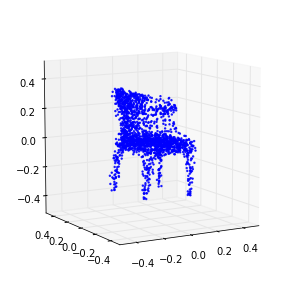

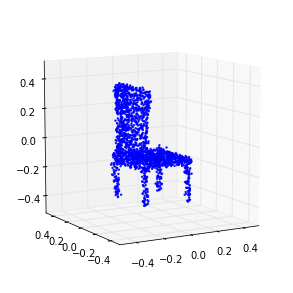

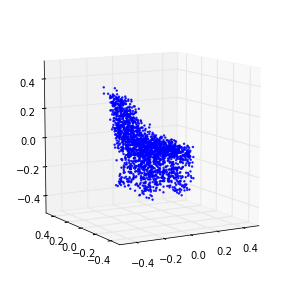

1381 (0.34616697131207697, 0.50175938948437016)
1382 (-0.003949944371426547, -0.97978421162675933)
1383 (-0.32941745440993042, -0.073964649328479057)
1384 (-0.20000202330174269, 0.43969665964444477)
1385 (-0.019708292541542539, 0.4099855108393563)
1386 (0.1543448082688782, -0.18432106739944881)
1387 (0.17205351624223922, -1.0486586623721652)
1388 (-0.15402603732353007, 0.52819469129597696)
1389 (-0.15455302476055091, 1.085100688316204)
1390 (0.0082326766620907516, 1.1563827086378027)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-1390 is not in all_model_checkpoint_paths. Manually adding it.


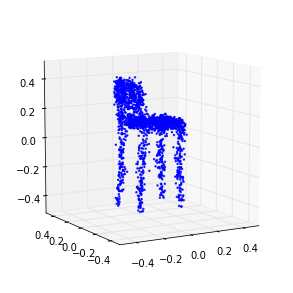

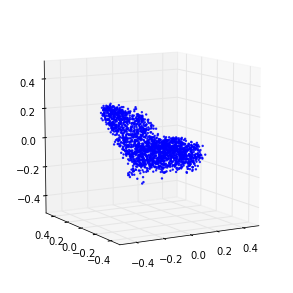

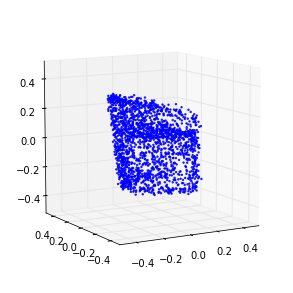

1391 (0.165905328605462, 1.2004508972167969)
1392 (0.0019281891140121002, -0.8538070036857216)
1393 (-0.1761931414267531, -1.4185233822575323)
1394 (-0.015259369035009985, -1.2814620093063072)
1395 (0.18685168234148511, -1.3161944769046925)
1396 (0.20247149150128718, -2.2298324483412282)
1397 (-0.28290172376566464, 1.6246867712449145)
1398 (-0.12406546177721962, 1.8629641577049538)
1399 (0.077554873240835695, 1.77947583021941)
1400 (0.14267756499488043, 0.38035057540293093)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-1400 is not in all_model_checkpoint_paths. Manually adding it.


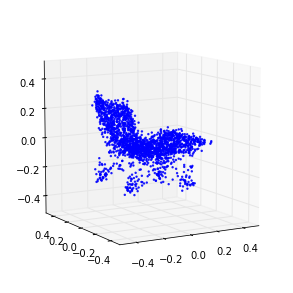

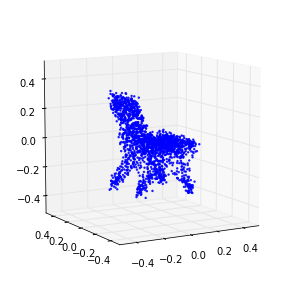

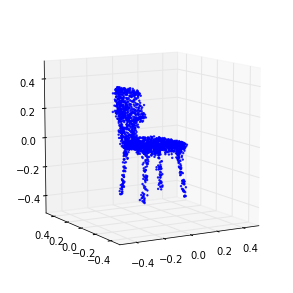

1401 (-0.1129222783225554, -1.6167404784096613)
1402 (-0.13562468341379255, -0.56585911744170714)
1403 (0.044591347145399564, -0.94768660598331023)
1404 (0.18446006310620794, -0.49178590956661439)
1405 (-0.064548864960670471, 2.0304621987872653)
1406 (-0.14880329346008322, 0.80535993200761302)
1407 (-0.0010320942417752963, 0.22285441136746495)
1408 (0.1515043072540451, -0.63357814622146114)
1409 (0.10407994114276435, -2.0713788226798728)
1410 (-0.19296582539876303, 0.83787759227885139)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-1410 is not in all_model_checkpoint_paths. Manually adding it.


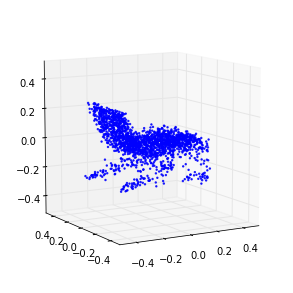

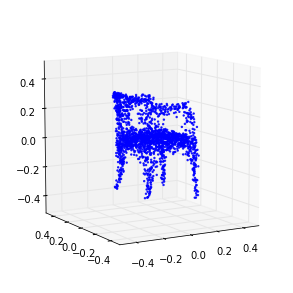

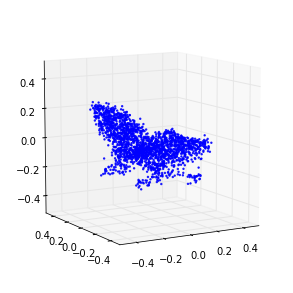

1411 (-0.065686707671179817, 1.6669799398492884)
1412 (0.097111273898432646, 1.7092917407000507)
1413 (0.20548313360799242, 1.9576199363779139)
1414 (-0.16283484617317165, -1.2264788721998532)
1415 (-0.16138073975841205, -2.0327521695031061)
1416 (0.0050026742706972141, -2.0187946778756602)
1417 (0.1789048035974028, -2.3603840050873934)
1418 (0.058497052087827968, 0.23957665430174935)
1419 (-0.22622389679912616, 2.8800928062862821)
1420 (-0.087704311325042333, 1.9036734192459672)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-1420 is not in all_model_checkpoint_paths. Manually adding it.


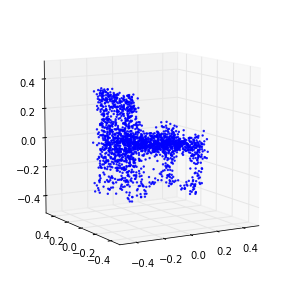

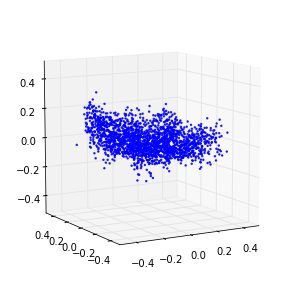

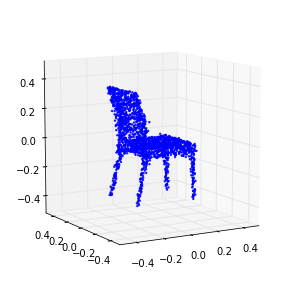

1421 (0.095325586151469632, 0.67463336053683798)
1422 (0.10574280208459606, -1.7913118003419153)
1423 (-0.10339491092772396, -1.3119626928258825)
1424 (-0.08141871068488668, 0.86322623104960827)
1425 (0.054984690738772907, 1.3474653959274292)
1426 (0.19897354634961598, 1.8638206808655351)
1427 (-0.0060050398387290812, 1.2720555809360963)
1428 (-0.20125856515434054, -0.67827009768397717)
1429 (-0.040650299646788172, -0.94887130128012764)
1430 (0.12134032015585237, -1.2727492915259466)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-1430 is not in all_model_checkpoint_paths. Manually adding it.


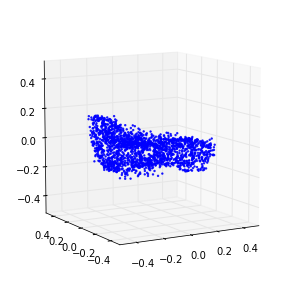

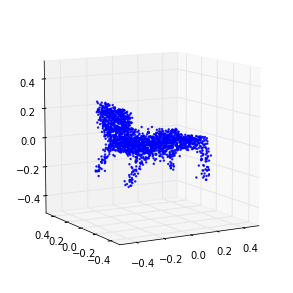

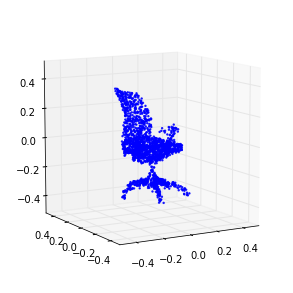

1431 (0.22207606590042511, -2.2514453419932612)
1432 (-0.17060289959664698, 2.2448128525305679)
1433 (-0.14423502068621694, 3.0353316289407237)
1434 (0.035844539585350839, 2.6563056663230613)
1435 (0.1931584060985457, 1.9282402418277882)
1436 (-0.0080251593694642739, -1.3764953723660223)
1437 (-0.22062606852225683, -0.9740977441823041)
1438 (-0.067340256956716374, -0.84764398027349397)
1439 (0.11016768330225238, -0.5081004279631155)
1440 (0.25752512373168157, -1.4801028282554061)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-1440 is not in all_model_checkpoint_paths. Manually adding it.


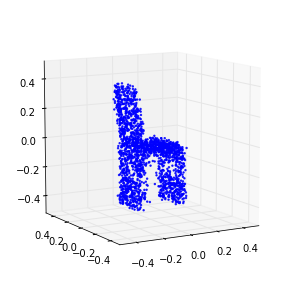

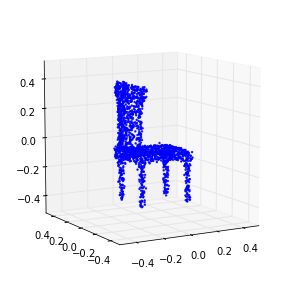

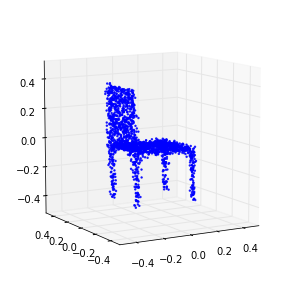

1441 (-0.042014057823905236, -0.34313229499039827)
1442 (-0.25699115070617862, 1.9652845859527588)
1443 (-0.076934612383721054, 1.7261176065162376)
1444 (0.080032999285807219, 0.655323205170808)
1445 (0.1457503428199777, -1.5091102942824364)
1446 (-0.14331678919908072, -0.45093962853705444)
1447 (-0.083975639194250107, 0.74688896592016574)
1448 (0.086493910290300846, 0.76395862521948643)
1449 (0.16636524615740333, -0.92995120502180528)
1450 (-0.13234766436809742, -1.0872618702274781)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-1450 is not in all_model_checkpoint_paths. Manually adding it.


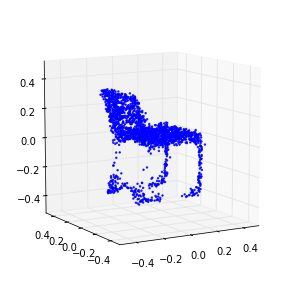

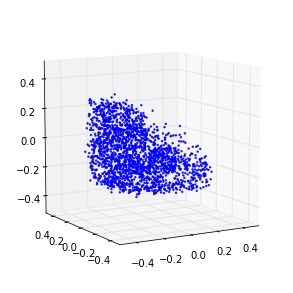

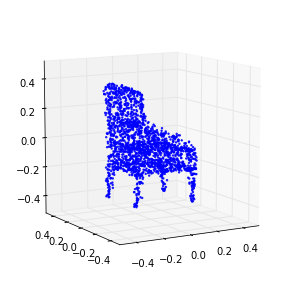

1451 (-0.1272104760269738, 0.98628171947267318)
1452 (0.030598939125667569, 0.28448529527695093)
1453 (0.16598158059296786, -0.86395240588872524)
1454 (-0.031620553197960061, -1.2880786155109052)
1455 (-0.17730841909155801, 1.5465914761578594)
1456 (-0.0063707938590259463, 1.0468649444756684)
1457 (0.090024286522357555, -1.309966863443454)
1458 (0.038180784142955587, -2.0742166076821311)
1459 (-0.15905492635167859, 1.6922893767003659)
1460 (0.0084219629600368173, 1.920529599542971)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-1460 is not in all_model_checkpoint_paths. Manually adding it.


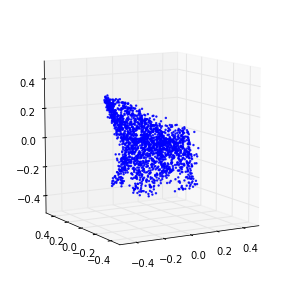

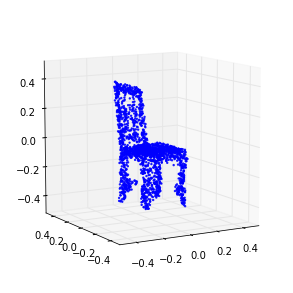

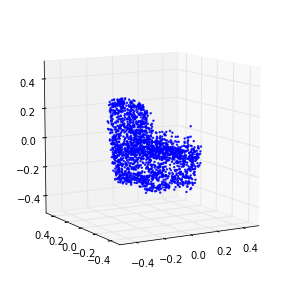

1461 (0.1623318094070311, 1.9938587126908478)
1462 (0.18026698266190511, 1.0765366267274927)
1463 (-0.23378698491249925, -1.6531042478702687)
1464 (-0.12768540279249901, -1.6439376760412145)
1465 (0.044750529015436767, -1.5199417935477362)
1466 (0.13006276148198931, 0.53785112445001249)
1467 (-0.12424548524949286, 2.6631391865235789)
1468 (-0.11197398878909924, 0.046439310604775394)
1469 (0.043581051596750818, -0.62902504095324763)
1470 (0.20163592089105536, -1.0406050682067871)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-1470 is not in all_model_checkpoint_paths. Manually adding it.


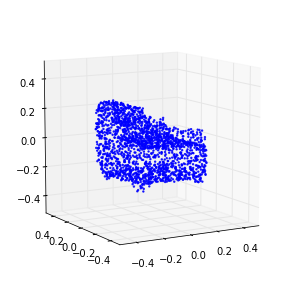

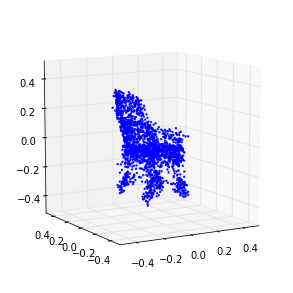

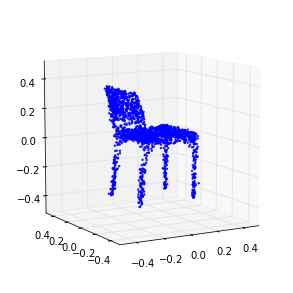

1471 (0.073951634129992241, 0.86162608365217841)
1472 (-0.27483807043344888, 1.0186123251914978)
1473 (-0.11484480197024015, 1.053537044260237)
1474 (0.027110548745150918, 0.25895560484517505)
1475 (0.15019189019997914, -1.8790997597906325)
1476 (-0.040828336885681861, -0.39418814579645794)
1477 (-0.14762228612132647, 2.5120269015983299)
1478 (0.020020758281289429, 2.4465807808770075)
1479 (0.190814029197726, 1.9958232265931588)
1480 (-0.10007939420088574, -2.0300320168888129)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-1480 is not in all_model_checkpoint_paths. Manually adding it.


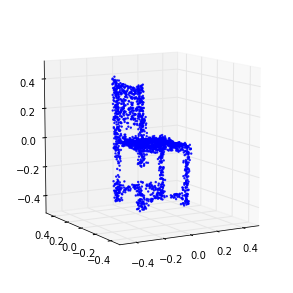

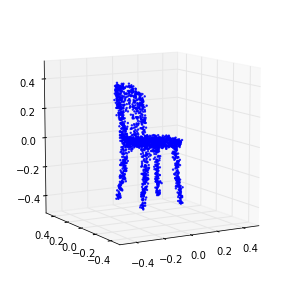

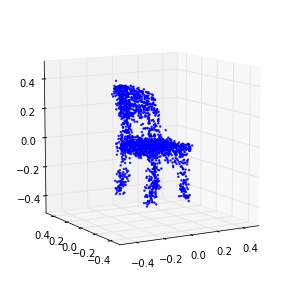

1481 (-0.15521395785941017, -1.2547634288116738)
1482 (0.017168693993826985, -0.43048431779499408)
1483 (0.10500115247236358, 1.5560103991517313)
1484 (-0.028789666388183831, 2.2005983788382122)
1485 (-0.13769937237310742, -1.6636012925042047)
1486 (0.029568287806102524, -2.0239627493752375)
1487 (0.14979487003551589, -0.47365081531030162)
1488 (-0.093802301451149914, 2.8726555329781993)
1489 (-0.12305223855224473, 0.38578515292869675)
1490 (0.019948009953454689, -0.70703890623041876)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-1490 is not in all_model_checkpoint_paths. Manually adding it.


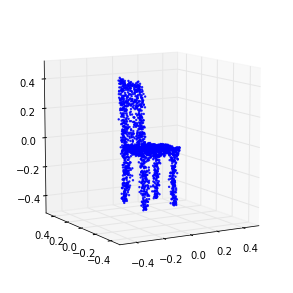

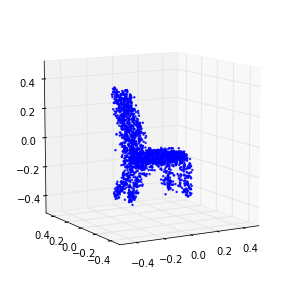

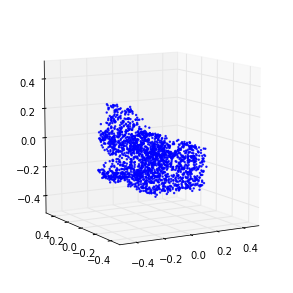

1491 (0.19558173469785187, -0.49397491432588408)
1492 (-0.05077326360882984, 2.6060372767625033)
1493 (-0.15806987869932695, 0.092227817961463218)
1494 (-0.035339330961168917, -0.47905972048088358)
1495 (0.12568090456296449, 0.44582505234413677)
1496 (0.20278391126129364, 2.1106009350882635)
1497 (-0.20397224107895184, 0.36218574311998153)
1498 (-0.18774581317341438, -1.0540739960140653)
1499 (0.024336402011276397, -1.1452822663165905)
1500 (0.12176691903560249, 0.58085027613021711)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_18_emd_chair_2048_best_epoch/models.ckpt-1500 is not in all_model_checkpoint_paths. Manually adding it.


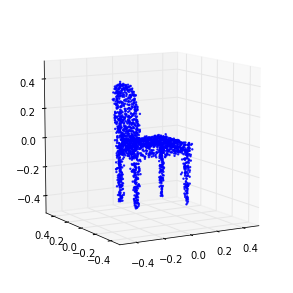

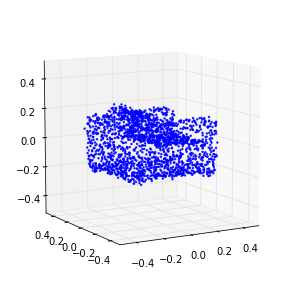

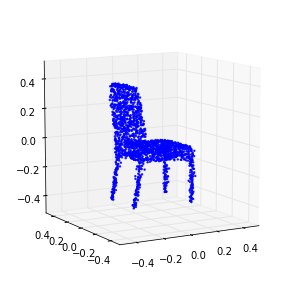

In [10]:
save_dir = osp.join(synthetic_data_out_dir, experiment_name)
save_dir = create_dir(save_dir)

buf_size = 1 # flush each line
if do_training:    
    train_stats = []
    log_file = open(osp.join(train_dir, 'train_stats.txt'), 'a', buf_size)
    for _ in range(max_epochs):        
        loss, duration = gan._single_epoch_train(training_data, batch_size, noise_params)
        epoch = int(gan.sess.run(gan.epoch.assign_add(tf.constant(1.0))))
        print epoch, loss                
        log_file.write('%04d\t%.9f\t%.9f\t%.4f\n' % (epoch, loss[0], loss[1], duration / 60.0))        

        if save_model and (epoch % saver_step == 0 or epoch <= 5):
            checkpoint_path = osp.join(train_dir, model_saver_id)
            gan.saver.save(gan.sess, checkpoint_path, global_step=gan.epoch)
            syn_latent_data = gan.generate(n_syn_samples, noise_params)
            syn_data = ae.decode(syn_latent_data)
            np.savez(osp.join(save_dir, 'epoch_' + str(epoch)), syn_data)
            for k in range(3):
                Point_Cloud(syn_data[k]).plot(in_u_sphere=True)
                        
        train_stats.append((epoch,) + loss)
    log_file.close()

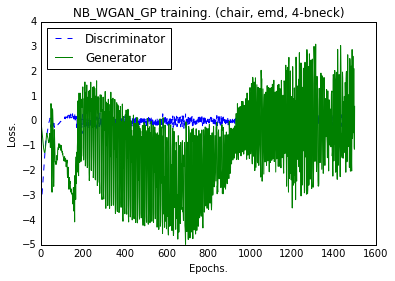

In [11]:
if do_plotting:
    x = range(len(train_stats))
    d_loss = [t[1] for t in train_stats]
    g_loss = [t[2] for t in train_stats]
    plt.plot(x, d_loss, '--')
    plt.plot(x, g_loss)
    plt.title('NB_WGAN_GP training. (%s, %s, %s-bneck)' %(class_name, ae_loss, ae.bottleneck_size))
    plt.legend(['Discriminator', 'Generator'], loc=0)
    
    plt.tick_params(axis='x', which='both', bottom='off', top='off')
    plt.tick_params(axis='y', which='both', left='off', right='off')
    
    plt.xlabel('Epochs.') 
    plt.ylabel('Loss.')
    
    plt.savefig(osp.join(train_dir, 'training_curve.png'))